# Results and Analysis

## Project aims, objectives and research questions
#### Aims and objectives
1. To develop methodology to quantify annual land use changes using Sentinel-2 satellite data using deep learning models trained on the EuroSAT dataset.
2. To assess the impact of LULUCF changes on GHG emissions at the local authority level in the UK between 2015 and 2022.
3. To develop methodology to compare actual GHG emissions with counterfactual scenarios so the effects of LULUCF changes can be quantified.
4. Analyse the contribution of land use changes to overall GHG emissions
#### Research questions
1. What are the relationships between land use and LULUCF GHG emissions?
2. How have land use and land cover categories changed between 2016 and 2022 in the UK?
3. How do the findings vary across regions and city/rural areas?
4. Using counterfactual scenarios, how have land use changes over time effected LULUCF GHG emissions?

#### Hypothesis for research question 3
Null Hypothesis – There is no significant difference between the actual emissions and counterfactual emissions.

Alternate Hypothesis – There is a significant difference between the actual emissions and counterfactual emissions.


In [1]:
import pandas as pd
import numpy as np

# imports visualisation libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# display all columns in datframes
pd.set_option('display.max_columns', None)

# supress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# for statistics and regression models
from scipy.stats import pearsonr
import statsmodels.api as sm
from scipy.stats import ttest_rel

# Processing the emissions dataset

In [2]:
laghg_df = pd.read_excel('2005-2022-local-authority-ghg-emissions-dataset.xlsx')

In [3]:
laghg_df

,Country,Country Code,Region,Region Code,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,LA GHG Sector,LA GHG Sub-sector,Greenhouse gas,Territorial emissions (kt CO2e),CO2 emissions within the scope of influence of LAs (kt CO2),Mid-year Population (thousands),Area (km2)
0,England,E92000001,North East,E12000001,Hartlepool,Hartlepool,E06000001,2005,Agriculture,Agriculture Electricity,CO2,1.678178,1.678178,90.457,98.3466
1,England,E92000001,North East,E12000001,Hartlepool,Hartlepool,E06000001,2005,Agriculture,Agriculture Electricity,CH4,0.052700,0.000000,90.457,98.3466
2,England,E92000001,North East,E12000001,Hartlepool,Hartlepool,E06000001,2005,Agriculture,Agriculture Electricity,N2O,0.006770,0.000000,90.457,98.3466
3,England,E92000001,North East,E12000001,Hartlepool,Hartlepool,E06000001,2005,Agriculture,Agriculture Gas,CO2,0.311375,0.311375,90.457,98.3466
4,England,E92000001,North East,E12000001,Hartlepool,Hartlepool,E06000001,2005,Agriculture,Agriculture Gas,CH4,0.010500,0.000000,90.457,98.3466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
533011,Wales,W92000004,Wales,W92000004,Wales,Merthyr Tydfil,W06000024,2022,Transport,Transport 'Other',N2O,0.011100,0.000000,58.883,111.9569
533012,Wales,W92000004,Wales,W92000004,Wales,Merthyr Tydfil,W06000024,2022,Waste,Landfill,CH4,10.234689,0.000000,58.883,111.9569
533013,Wales,W92000004,Wales,W92000004,Wales,Merthyr Tydfil,W06000024,2022,Waste,Waste 'Other',CO2,0.083700,0.083700,58.883,111.9569
533014,Wales,W92000004,Wales,W92000004,Wales,Merthyr Tydfil,W06000024,2022,Waste,Waste 'Other',CH4,2.596769,0.000000,58.883,111.9569


# Flatten data

I want to get data into a flatter state. It needs to be grouped by 'Local Authority' and 'Calendar Year' then each LA GHG Sub-sector split out into columns and the Territorial emissions (kt CO2e) summed per column

In [4]:
# Aggregate emissions by Local Authority, Year, and Sub-sector
# for each unique combo sum for Territorial emissions (kt CO2e
laghg_agg = laghg_df.groupby(
    ['Local Authority', 'Calendar Year', 'LA GHG Sub-sector'])['Territorial emissions (kt CO2e)'].sum().reset_index()

In [5]:
laghg_agg

,Local Authority,Calendar Year,LA GHG Sub-sector,Territorial emissions (kt CO2e)
0,Aberdeen City,2005,Agriculture 'Other',2.183629
1,Aberdeen City,2005,Agriculture Electricity,4.177167
2,Aberdeen City,2005,Agriculture Gas,1.013365
3,Aberdeen City,2005,Agriculture Livestock,23.175389
4,Aberdeen City,2005,Agriculture Soils,8.608278
...,...,...,...,...
199260,York,2022,Public Sector Gas,12.146008
199261,York,2022,Road Transport (A roads),143.526586
199262,York,2022,Road Transport (Minor roads),105.966826
199263,York,2022,Transport 'Other',5.901186


In [6]:
# pivot so each sub sector becomes a column
laghg_pivot = laghg_agg.pivot_table(
    index=['Local Authority', 'Calendar Year'],
    columns='LA GHG Sub-sector',
    values='Territorial emissions (kt CO2e)',
    fill_value=0  # fills with 0 if anything missing
).reset_index()

# cleans up col names by flattening out again
laghg_pivot.columns = [str(col) for col in laghg_pivot.columns]

In [7]:
laghg_pivot

,Local Authority,Calendar Year,Agriculture 'Other',Agriculture Electricity,Agriculture Gas,Agriculture Livestock,Agriculture Soils,Commercial 'Other',Commercial Electricity,Commercial Gas,Diesel Railways,Domestic 'Other',Domestic Electricity,Domestic Gas,Industry 'Other',Industry Electricity,Industry Gas,LULUCF Net Emissions: Bioenergy crops,LULUCF Net Emissions: Cropland mineral soils under LUC,LULUCF Net Emissions: Forestry,LULUCF Net Emissions: Grassland mineral soils under LUC,LULUCF Net Emissions: Other LULUCF,LULUCF Net Emissions: Peatland,LULUCF Net Emissions: Settlements,Landfill,Large Industrial Installations,Public Sector 'Other',Public Sector Electricity,Public Sector Gas,Road Transport (A roads),Road Transport (Minor roads),Road Transport (Motorways),Transport 'Other',Waste 'Other'
0,Aberdeen City,2005,2.183629,4.177167,1.013365,23.175389,8.608278,9.361295,330.719255,125.781591,2.805404,9.843741,282.431893,321.945877,87.894388,92.211263,49.071398,0.00000,30.983139,-9.993844,-12.420402,-0.090183,4.105613,24.814865,190.794378,43.565004,15.210245,54.140748,93.739214,149.457986,232.921466,0.0,27.764357,13.424932
1,Aberdeen City,2006,3.714461,4.251500,0.751822,22.423787,8.294026,9.702367,336.609331,93.315305,2.780320,9.951259,290.347929,313.008299,79.506340,93.853536,36.405256,0.00000,29.926044,-10.729247,-12.487183,-0.082211,4.061050,24.045340,168.599433,94.658156,12.299563,55.104989,69.543610,153.704197,231.996926,0.0,29.021191,15.883163
2,Aberdeen City,2007,2.194139,4.148319,0.714126,22.017394,8.547735,8.880035,328.438271,88.633881,2.997163,9.230320,289.493674,299.340046,75.818006,91.575278,34.578853,0.00000,29.332331,-9.878894,-12.343494,-0.362142,4.052968,23.555166,150.367263,80.742769,11.123960,53.767337,66.054752,138.688084,234.041598,0.0,29.275230,16.600822
3,Aberdeen City,2008,4.335534,4.272578,0.727647,21.406425,8.677867,9.120179,338.277466,90.318494,3.016312,9.488712,279.087787,310.351595,62.906575,94.318646,35.236116,0.00000,28.805633,-10.782234,-12.322994,-0.164099,4.044450,23.906185,148.454452,69.233892,8.375422,55.378073,67.310177,134.044883,227.529211,0.0,29.164302,15.556631
4,Aberdeen City,2009,2.450441,3.731542,0.670627,21.256157,9.129856,9.423110,295.439130,83.244291,3.033901,8.874509,249.504614,281.932907,61.920448,82.374446,32.476236,0.00000,28.047093,-10.937303,-12.447361,-0.111193,4.034722,23.516452,96.454404,62.722268,7.305113,48.365178,62.038105,126.187765,214.244966,0.0,28.942441,15.415648
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6547,York,2018,8.417974,1.798789,0.801224,29.121497,18.103963,7.837710,74.894109,45.231858,8.589333,20.092495,75.020595,215.305152,21.669748,15.116822,56.823708,-0.00949,9.938569,-7.998788,-7.267087,0.043900,32.591178,5.493549,20.295429,0.124843,3.784198,15.703807,14.625293,167.043748,151.867686,0.0,5.691305,10.611577
6548,York,2019,7.526788,1.299236,0.645677,27.825013,18.432806,7.244498,65.862026,36.409476,8.916729,18.990951,67.103273,214.392327,18.543021,12.562871,55.879185,-0.06190,9.958970,-8.003612,-7.178483,-0.151400,31.975087,5.504450,10.458441,0.081400,4.221798,15.832517,14.961052,166.608678,151.008097,0.0,6.076372,10.307669
6549,York,2020,7.690684,1.107418,0.555939,26.197757,15.240722,7.890651,49.332376,32.637254,6.944184,18.449281,64.870724,206.056903,17.707450,10.896100,49.410209,-0.02570,9.855574,-8.166144,-7.192456,0.205724,31.324739,5.504147,14.567239,0.070938,4.551269,11.954964,14.487638,126.946848,126.025157,0.0,5.337436,10.132714
6550,York,2021,7.637315,1.265721,0.685750,25.113922,17.246294,7.229989,58.438843,44.712800,7.488108,17.874148,66.636477,208.672580,17.704579,12.159850,66.451601,-0.02520,9.808497,-7.889237,-7.210701,0.339472,30.635566,5.501137,13.595631,0.136411,4.196733,13.853633,19.477009,140.969414,107.127130,0.0,5.642917,10.563891


# Get sum of all categories

I want to keep the LULUCF columns but also might be useful to keep a column that has the total emissions (accross all emissions)

In [8]:
laghg_pivot_columns = laghg_pivot.columns.to_list()
laghg_pivot_columns.remove('Local Authority')
laghg_pivot_columns.remove('Calendar Year')

laghg_pivot['all_emmisions_sum'] = laghg_pivot[laghg_pivot_columns].sum(axis=1)

In [9]:
laghg_pivot

,Local Authority,Calendar Year,Agriculture 'Other',Agriculture Electricity,Agriculture Gas,Agriculture Livestock,Agriculture Soils,Commercial 'Other',Commercial Electricity,Commercial Gas,Diesel Railways,Domestic 'Other',Domestic Electricity,Domestic Gas,Industry 'Other',Industry Electricity,Industry Gas,LULUCF Net Emissions: Bioenergy crops,LULUCF Net Emissions: Cropland mineral soils under LUC,LULUCF Net Emissions: Forestry,LULUCF Net Emissions: Grassland mineral soils under LUC,LULUCF Net Emissions: Other LULUCF,LULUCF Net Emissions: Peatland,LULUCF Net Emissions: Settlements,Landfill,Large Industrial Installations,Public Sector 'Other',Public Sector Electricity,Public Sector Gas,Road Transport (A roads),Road Transport (Minor roads),Road Transport (Motorways),Transport 'Other',Waste 'Other',all_emmisions_sum
0,Aberdeen City,2005,2.183629,4.177167,1.013365,23.175389,8.608278,9.361295,330.719255,125.781591,2.805404,9.843741,282.431893,321.945877,87.894388,92.211263,49.071398,0.00000,30.983139,-9.993844,-12.420402,-0.090183,4.105613,24.814865,190.794378,43.565004,15.210245,54.140748,93.739214,149.457986,232.921466,0.0,27.764357,13.424932,2209.641450
1,Aberdeen City,2006,3.714461,4.251500,0.751822,22.423787,8.294026,9.702367,336.609331,93.315305,2.780320,9.951259,290.347929,313.008299,79.506340,93.853536,36.405256,0.00000,29.926044,-10.729247,-12.487183,-0.082211,4.061050,24.045340,168.599433,94.658156,12.299563,55.104989,69.543610,153.704197,231.996926,0.0,29.021191,15.883163,2170.460560
2,Aberdeen City,2007,2.194139,4.148319,0.714126,22.017394,8.547735,8.880035,328.438271,88.633881,2.997163,9.230320,289.493674,299.340046,75.818006,91.575278,34.578853,0.00000,29.332331,-9.878894,-12.343494,-0.362142,4.052968,23.555166,150.367263,80.742769,11.123960,53.767337,66.054752,138.688084,234.041598,0.0,29.275230,16.600822,2081.624988
3,Aberdeen City,2008,4.335534,4.272578,0.727647,21.406425,8.677867,9.120179,338.277466,90.318494,3.016312,9.488712,279.087787,310.351595,62.906575,94.318646,35.236116,0.00000,28.805633,-10.782234,-12.322994,-0.164099,4.044450,23.906185,148.454452,69.233892,8.375422,55.378073,67.310177,134.044883,227.529211,0.0,29.164302,15.556631,2060.075922
4,Aberdeen City,2009,2.450441,3.731542,0.670627,21.256157,9.129856,9.423110,295.439130,83.244291,3.033901,8.874509,249.504614,281.932907,61.920448,82.374446,32.476236,0.00000,28.047093,-10.937303,-12.447361,-0.111193,4.034722,23.516452,96.454404,62.722268,7.305113,48.365178,62.038105,126.187765,214.244966,0.0,28.942441,15.415648,1839.240511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6547,York,2018,8.417974,1.798789,0.801224,29.121497,18.103963,7.837710,74.894109,45.231858,8.589333,20.092495,75.020595,215.305152,21.669748,15.116822,56.823708,-0.00949,9.938569,-7.998788,-7.267087,0.043900,32.591178,5.493549,20.295429,0.124843,3.784198,15.703807,14.625293,167.043748,151.867686,0.0,5.691305,10.611577,1021.364694
6548,York,2019,7.526788,1.299236,0.645677,27.825013,18.432806,7.244498,65.862026,36.409476,8.916729,18.990951,67.103273,214.392327,18.543021,12.562871,55.879185,-0.06190,9.958970,-8.003612,-7.178483,-0.151400,31.975087,5.504450,10.458441,0.081400,4.221798,15.832517,14.961052,166.608678,151.008097,0.0,6.076372,10.307669,973.233016
6549,York,2020,7.690684,1.107418,0.555939,26.197757,15.240722,7.890651,49.332376,32.637254,6.944184,18.449281,64.870724,206.056903,17.707450,10.896100,49.410209,-0.02570,9.855574,-8.166144,-7.192456,0.205724,31.324739,5.504147,14.567239,0.070938,4.551269,11.954964,14.487638,126.946848,126.025157,0.0,5.337436,10.132714,860.567737
6550,York,2021,7.637315,1.265721,0.685750,25.113922,17.246294,7.229989,58.438843,44.712800,7.488108,17.874148,66.636477,208.672580,17.704579,12.159850,66.451601,-0.02520,9.808497,-7.889237,-7.210701,0.339472,30.635566,5.501137,13.595631,0.136411,4.196733,13.853633,19.477009,140.969414,107.127130,0.0,5.642917,10.5638

# drop all cols except LULUCF and sum of all

In [10]:
laghg_pivot_columns

["Agriculture 'Other'",
 'Agriculture Electricity',
 'Agriculture Gas',
 'Agriculture Livestock',
 'Agriculture Soils',
 "Commercial 'Other'",
 'Commercial Electricity',
 'Commercial Gas',
 'Diesel Railways',
 "Domestic 'Other'",
 'Domestic Electricity',
 'Domestic Gas',
 "Industry 'Other'",
 'Industry Electricity',
 'Industry Gas',
 'LULUCF Net Emissions: Bioenergy crops',
 'LULUCF Net Emissions: Cropland mineral soils under LUC',
 'LULUCF Net Emissions: Forestry',
 'LULUCF Net Emissions: Grassland mineral soils under LUC',
 'LULUCF Net Emissions: Other LULUCF',
 'LULUCF Net Emissions: Peatland',
 'LULUCF Net Emissions: Settlements',
 'Landfill',
 'Large Industrial Installations',
 "Public Sector 'Other'",
 'Public Sector Electricity',
 'Public Sector Gas',
 'Road Transport (A roads)',
 'Road Transport (Minor roads)',
 'Road Transport (Motorways)',
 "Transport 'Other'",
 "Waste 'Other'"]

In [11]:
laghg_pivot_columns.remove('LULUCF Net Emissions: Bioenergy crops')
laghg_pivot_columns.remove('LULUCF Net Emissions: Cropland mineral soils under LUC')
laghg_pivot_columns.remove('LULUCF Net Emissions: Forestry')
laghg_pivot_columns.remove('LULUCF Net Emissions: Grassland mineral soils under LUC')
laghg_pivot_columns.remove('LULUCF Net Emissions: Other LULUCF')
laghg_pivot_columns.remove('LULUCF Net Emissions: Peatland')
laghg_pivot_columns.remove('LULUCF Net Emissions: Settlements')

laghg_pivot = laghg_pivot.drop(columns=laghg_pivot_columns) # drops cols

In [12]:
laghg_pivot

,Local Authority,Calendar Year,LULUCF Net Emissions: Bioenergy crops,LULUCF Net Emissions: Cropland mineral soils under LUC,LULUCF Net Emissions: Forestry,LULUCF Net Emissions: Grassland mineral soils under LUC,LULUCF Net Emissions: Other LULUCF,LULUCF Net Emissions: Peatland,LULUCF Net Emissions: Settlements,all_emmisions_sum
0,Aberdeen City,2005,0.00000,30.983139,-9.993844,-12.420402,-0.090183,4.105613,24.814865,2209.641450
1,Aberdeen City,2006,0.00000,29.926044,-10.729247,-12.487183,-0.082211,4.061050,24.045340,2170.460560
2,Aberdeen City,2007,0.00000,29.332331,-9.878894,-12.343494,-0.362142,4.052968,23.555166,2081.624988
3,Aberdeen City,2008,0.00000,28.805633,-10.782234,-12.322994,-0.164099,4.044450,23.906185,2060.075922
4,Aberdeen City,2009,0.00000,28.047093,-10.937303,-12.447361,-0.111193,4.034722,23.516452,1839.240511
...,...,...,...,...,...,...,...,...,...,...
6547,York,2018,-0.00949,9.938569,-7.998788,-7.267087,0.043900,32.591178,5.493549,1021.364694
6548,York,2019,-0.06190,9.958970,-8.003612,-7.178483,-0.151400,31.975087,5.504450,973.233016
6549,York,2020,-0.02570,9.855574,-8.166144,-7.192456,0.205724,31.324739,5.504147,860.567737
6550,York,2021,-0.02520,9.808497,-7.889237,-7.210701,0.339472,30.635566,5.501137,906.040279


# merge back in the Region, Area and Mid Year population

In [13]:
# merge on 'Local Authority' and 'Calendar Year'
laghg_pivot = laghg_pivot.merge(
    laghg_df[['Local Authority', 'Calendar Year', 'Region', 'Area (km2)', 'Mid-year Population (thousands)']].drop_duplicates(),
    on=['Local Authority', 'Calendar Year'],
    how='left'
)

In [14]:
laghg_pivot

,Local Authority,Calendar Year,LULUCF Net Emissions: Bioenergy crops,LULUCF Net Emissions: Cropland mineral soils under LUC,LULUCF Net Emissions: Forestry,LULUCF Net Emissions: Grassland mineral soils under LUC,LULUCF Net Emissions: Other LULUCF,LULUCF Net Emissions: Peatland,LULUCF Net Emissions: Settlements,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands)
0,Aberdeen City,2005,0.00000,30.983139,-9.993844,-12.420402,-0.090183,4.105613,24.814865,2209.641450,Scotland,205.6013,208.690000
1,Aberdeen City,2006,0.00000,29.926044,-10.729247,-12.487183,-0.082211,4.061050,24.045340,2170.460560,Scotland,205.6013,209.620000
2,Aberdeen City,2007,0.00000,29.332331,-9.878894,-12.343494,-0.362142,4.052968,23.555166,2081.624988,Scotland,205.6013,212.460000
3,Aberdeen City,2008,0.00000,28.805633,-10.782234,-12.322994,-0.164099,4.044450,23.906185,2060.075922,Scotland,205.6013,214.020000
4,Aberdeen City,2009,0.00000,28.047093,-10.937303,-12.447361,-0.111193,4.034722,23.516452,1839.240511,Scotland,205.6013,217.020000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6547,York,2018,-0.00949,9.938569,-7.998788,-7.267087,0.043900,32.591178,5.493549,1021.364694,Yorkshire and the Humber,272.0148,204.171293
6548,York,2019,-0.06190,9.958970,-8.003612,-7.178483,-0.151400,31.975087,5.504450,973.233016,Yorkshire and the Humber,272.0148,204.327769
6549,York,2020,-0.02570,9.855574,-8.166144,-7.192456,0.205724,31.324739,5.504147,860.567737,Yorkshire and the Humber,272.0148,202.101013
6550,York,2021,-0.02520,9.808497,-7.889237,-7.210701,0.339472,30.635566,5.501137,906.040279,Yorkshire and the Humber,272.0148,201.672000


## Calculate whether rural or urban

https://www.ons.gov.uk/aboutus/whatwedo/programmesandprojects/europeancitystatistics#:~:text=Areas%20are%20classed%20as%20Rural,150%20inhabitants%20per%20km2.

rural if less than 150 people/sqkm

In [15]:
laghg_pivot['rural/urban'] = np.where((laghg_pivot['Mid-year Population (thousands)']*1000)/laghg_pivot['Area (km2)'] < 150, 'Rural', 'Urban')


In [16]:
laghg_pivot['rural/urban'].value_counts()

rural/urban
Urban    5326
Rural    1226
Name: count, dtype: int64

# Process Prediction Data

In [17]:
land_use_df = pd.read_csv('prediction_df_full_v4.csv')

In [18]:
land_use_df

,local_authority,year,total_pixels,total_sqkm,0,1,2,3,4,5,6,7,8,9
0,South Ayrshire,2016,12284471,1228.4471,57,80,1180,153,45,1430,22,75,65,4
1,Huntingdonshire,2016,9121024,912.1024,693,20,35,299,72,865,144,129,54,13
2,Tewkesbury,2016,4102733,410.2733,95,4,33,82,34,766,30,40,9,0
3,West Lancashire,2016,3427363,342.7363,132,7,67,65,41,480,40,59,7,0
4,Darlington,2016,1976753,197.6753,111,1,25,45,25,244,16,48,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2816,Torridge,2022,9688162,968.8162,760,55,396,8,6,1258,4,7,2,8
2817,Stockton-on-Tees,2022,1586619,158.6619,44,0,52,35,58,155,7,71,3,0
2818,Perth & Kinross,2022,53376489,5337.6489,5664,2905,2839,36,14,1779,58,22,13,33
2819,Selby,2022,4687696,468.7696,194,2,62,168,40,668,30,35,21,0


## Change the class names

In [19]:
land_use_df = land_use_df.rename(columns={'0': 'AnnualCrop',
                                          '1': 'Forest',
                                          '2': 'HerbaceousVegetation',
                                          '3': 'Highway',
                                          '4': 'Industrial',
                                          '5': 'Pasture',
                                          '6': 'PermanentCrop',
                                          '7': 'Residential',
                                          '8': 'River',
                                          '9': 'SeaLake'})

In [20]:
land_use_df

,local_authority,year,total_pixels,total_sqkm,AnnualCrop,Forest,HerbaceousVegetation,Highway,Industrial,Pasture,PermanentCrop,Residential,River,SeaLake
0,South Ayrshire,2016,12284471,1228.4471,57,80,1180,153,45,1430,22,75,65,4
1,Huntingdonshire,2016,9121024,912.1024,693,20,35,299,72,865,144,129,54,13
2,Tewkesbury,2016,4102733,410.2733,95,4,33,82,34,766,30,40,9,0
3,West Lancashire,2016,3427363,342.7363,132,7,67,65,41,480,40,59,7,0
4,Darlington,2016,1976753,197.6753,111,1,25,45,25,244,16,48,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2816,Torridge,2022,9688162,968.8162,760,55,396,8,6,1258,4,7,2,8
2817,Stockton-on-Tees,2022,1586619,158.6619,44,0,52,35,58,155,7,71,3,0
2818,Perth & Kinross,2022,53376489,5337.6489,5664,2905,2839,36,14,1779,58,22,13,33
2819,Selby,2022,4687696,468.7696,194,2,62,168,40,668,30,35,21,0


# Merge the datasets

In [21]:
land_use_df_cols = land_use_df.columns.to_list()
laghg_pivot_cols = laghg_pivot.columns.to_list()

In [22]:
land_use_ghg_df = land_use_df.merge(laghg_pivot,
                                left_on=['local_authority', 'year'],
                                right_on=['Local Authority', 'Calendar Year'],
                                how='inner')

land_use_ghg_df = land_use_ghg_df.drop(columns=['Local Authority', 'Calendar Year']) # drops cols

In [23]:
land_use_ghg_df

,local_authority,year,total_pixels,total_sqkm,AnnualCrop,Forest,HerbaceousVegetation,Highway,Industrial,Pasture,PermanentCrop,Residential,River,SeaLake,LULUCF Net Emissions: Bioenergy crops,LULUCF Net Emissions: Cropland mineral soils under LUC,LULUCF Net Emissions: Forestry,LULUCF Net Emissions: Grassland mineral soils under LUC,LULUCF Net Emissions: Other LULUCF,LULUCF Net Emissions: Peatland,LULUCF Net Emissions: Settlements,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban
0,South Ayrshire,2016,12284471,1228.4471,57,80,1180,153,45,1430,22,75,65,4,0.000000,60.800080,-168.406704,-73.417539,-0.100247,95.996431,20.931298,914.043309,Scotland,1234.6853,112.567854,Rural
1,Huntingdonshire,2016,9121024,912.1024,693,20,35,299,72,865,144,129,54,13,-0.136416,30.954001,-22.369041,-14.162327,0.276267,300.132017,6.148401,1921.331100,East of England,912.5461,177.361733,Urban
2,Tewkesbury,2016,4102733,410.2733,95,4,33,82,34,766,30,40,9,0,-0.036300,13.141069,-22.629027,-14.844106,0.324541,0.000000,3.407730,893.603856,South West,414.9760,88.153766,Urban
3,West Lancashire,2016,3427363,342.7363,132,7,67,65,41,480,40,59,7,0,-0.040800,8.905508,-11.068474,-4.884457,0.067400,217.915016,3.649448,1033.234330,North West,381.3803,114.563882,Urban
4,Darlington,2016,1976753,197.6753,111,1,25,45,25,244,16,48,6,0,-0.026400,8.147986,-5.683302,-4.716493,0.112159,0.000000,3.009305,667.990971,North East,197.4758,106.925688,Urban
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2333,Birmingham,2022,2674485,267.4485,11,2,161,16,90,36,1,377,2,0,-0.002190,0.721603,-8.254602,-1.731454,0.037500,13.873734,17.066511,4316.447767,West Midlands,267.7912,1157.603000,Urban
2334,Torridge,2022,9688162,968.8162,760,55,396,8,6,1258,4,7,2,8,-0.031364,16.215596,-93.930942,-34.536034,-0.203014,0.086894,2.409826,626.901017,South West,995.2034,68.635000,Rural
2335,Stockton-on-Tees,2022,1586619,158.6619,44,0,52,35,58,155,7,71,3,0,-0.014700,5.155602,-10.184451,-3.484902,0.072600,0.019590,7.642307,1978.178678,North East,209.7309,199.966000,Urban
2336,Perth & Kinross,2022,53376489,5337.6489,5664,2905,2839,36,14,1779,58,22,13,33,0.000000,488.102005,-519.099546,-315.313531,-3.128700,157.917781,28.999456,1258.152671,Scotland,5418.9445,151.120000,Rural


In [24]:
# how many local authorities included in the data
land_use_ghg_df[land_use_ghg_df['year'] == 2016].shape

(334, 26)

In [25]:
land_use_ghg_df['year'].value_counts()

year
2016    334
2017    334
2018    334
2019    334
2020    334
2021    334
2022    334
Name: count, dtype: int64

### Basic EDA

* check for nulls
* check data types
* check for outliers
* check distributions

In [26]:
# total local authoroties
len(land_use_ghg_df['local_authority'].value_counts())

334

In [27]:
land_use_ghg_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2338 entries, 0 to 2337
Data columns (total 26 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   local_authority                                          2338 non-null   object 
 1   year                                                     2338 non-null   int64  
 2   total_pixels                                             2338 non-null   int64  
 3   total_sqkm                                               2338 non-null   float64
 4   AnnualCrop                                               2338 non-null   int64  
 5   Forest                                                   2338 non-null   int64  
 6   HerbaceousVegetation                                     2338 non-null   int64  
 7   Highway                                                  2338 non-null   int64  
 8   Industrial                  

In [28]:
land_use_ghg_df.describe()

,year,total_pixels,total_sqkm,AnnualCrop,Forest,HerbaceousVegetation,Highway,Industrial,Pasture,PermanentCrop,Residential,River,SeaLake,LULUCF Net Emissions: Bioenergy crops,LULUCF Net Emissions: Cropland mineral soils under LUC,LULUCF Net Emissions: Forestry,LULUCF Net Emissions: Grassland mineral soils under LUC,LULUCF Net Emissions: Other LULUCF,LULUCF Net Emissions: Peatland,LULUCF Net Emissions: Settlements,all_emmisions_sum,Area (km2),Mid-year Population (thousands)
count,2338.000000,2.338000e+03,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000,2338.000000
mean,2019.000000,4.960970e+06,496.096957,278.881095,34.929427,306.683490,47.366125,26.406330,463.348161,31.827203,58.133447,11.803251,7.309666,-0.026103,23.224107,-38.512401,-17.548827,0.431525,30.621298,7.023899,1058.594348,527.903290,178.932298
std,2.000428,8.807829e+06,880.782934,880.334521,166.864696,778.857539,72.989459,25.918506,900.937451,63.657628,48.770587,32.523830,36.523682,0.059780,90.898639,100.968967,46.493123,3.542024,91.199041,8.922753,818.118005,946.456948,119.609089
min,2016.000000,1.206980e+05,12.069800,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.821426,-0.004580,-1025.768142,-511.701249,-18.477925,0.000000,0.899481,199.919024,12.383700,21.885660
25%,2017.000000,8.269080e+05,82.690800,7.000000,0.000000,32.000000,4.000000,9.000000,22.000000,2.000000,22.000000,1.000000,0.000000,-0.024806,0.301098,-31.437974,-14.233219,-0.024075,0.000000,2.942550,618.225487,86.494300,103.229826
50%,2019.000000,2.112236e+06,211.223650,33.000000,4.000000,78.000000,20.000000,20.000000,139.000000,7.000000,54.000000,2.000000,1.000000,-0.002955,3.572582,-11.626018,-5.818444,0.028200,0.751830,4.310769,859.835054,238.199150,141.543045
75%,2021.000000,5.519419e+06,551.941875,178.000000,17.000000,227.000000,61.000000,35.000000,522.000000,30.000000,81.000000,9.000000,3.000000,-0.000104,15.233685,-3.221834,-1.205963,0.282058,17.322374,6.335518,1214.362332,568.551300,218.142825
max,2022.000000,6.496205e+07,6496.204800,10799.000000,3781.000000,9122.000000,849.000000,292.000000,9305.000000,618.000000,377.000000,475.000000,710.000000,0.015200,1289.275204,51.747070,-0.003279,96.409911,724.641031,92.254941,8108.463887,7165.171500,1157.603000


In [29]:
# checking for null values

cols_null_values = land_use_ghg_df.columns[land_use_ghg_df.isnull().any()].tolist() # list of cols with null values

# % missing
(land_use_ghg_df[cols_null_values].isna().mean()*100).sort_values(ascending=False)

Series([], dtype: float64)

## Checking some of the max values

Some of the max values look very high. from the checks below it looks like Highland is causing alot of these issues.

There are also spikes in sea lake and Industrial.

Sealake again seems to eb caused by

In [30]:
# Check max values
# There are some high max values 

land_use_ghg_df[land_use_ghg_df.AnnualCrop == land_use_ghg_df.AnnualCrop.max()]

,local_authority,year,total_pixels,total_sqkm,AnnualCrop,Forest,HerbaceousVegetation,Highway,Industrial,Pasture,PermanentCrop,Residential,River,SeaLake,LULUCF Net Emissions: Bioenergy crops,LULUCF Net Emissions: Cropland mineral soils under LUC,LULUCF Net Emissions: Forestry,LULUCF Net Emissions: Grassland mineral soils under LUC,LULUCF Net Emissions: Other LULUCF,LULUCF Net Emissions: Peatland,LULUCF Net Emissions: Settlements,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban
333,Perth & Kinross,2016,53431856,5343.1856,10799,349,1818,5,1,207,17,4,7,156,0.0,505.13392,-545.33533,-304.221817,-5.347995,165.514193,30.356171,1403.223685,Scotland,5418.9445,151.007642,Rural


In [31]:
land_use_ghg_df.nlargest(10,['HerbaceousVegetation'])

,local_authority,year,total_pixels,total_sqkm,AnnualCrop,Forest,HerbaceousVegetation,Highway,Industrial,Pasture,PermanentCrop,Residential,River,SeaLake,LULUCF Net Emissions: Bioenergy crops,LULUCF Net Emissions: Cropland mineral soils under LUC,LULUCF Net Emissions: Forestry,LULUCF Net Emissions: Grassland mineral soils under LUC,LULUCF Net Emissions: Other LULUCF,LULUCF Net Emissions: Peatland,LULUCF Net Emissions: Settlements,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban
533,Argyll & Bute,2017,43683824,4368.3824,5,159,9122,153,34,1117,15,63,475,9,0.0,22.162303,-1007.540881,-188.807073,4.057252,648.523678,18.380018,293.203331,Scotland,7165.1715,87.355729,Rural
203,Argyll & Bute,2016,43680509,4368.0509,7,567,8283,120,58,1567,31,53,464,2,0.0,22.657102,-1025.768142,-186.703673,3.256149,655.020515,18.898756,298.371109,Scotland,7165.1715,87.586451,Rural
2207,Argyll & Bute,2022,43576571,4357.6571,16,720,7753,68,49,2015,34,48,447,2,0.0,19.622277,-843.445610,-198.203160,4.019646,618.282351,18.123968,332.997720,Scotland,7165.1715,87.920000,Rural
28,Dumfries & Galloway,2016,64962048,6496.2048,277,274,7713,422,100,6959,86,95,251,8,0.0,269.560816,-956.381894,-328.528583,1.156686,724.641031,41.065572,2428.127540,Scotland,6676.3147,149.942085,Rural
871,Argyll & Bute,2018,43689094,4368.9094,44,1361,7666,52,49,1549,20,51,340,20,0.0,21.009806,-1014.556492,-190.158132,21.881961,641.948864,19.676608,278.024054,Scotland,7165.1715,86.892650,Rural
1001,Perth & Kinross,2018,53436929,5343.6929,621,679,7451,532,114,3328,217,91,312,18,0.0,495.168587,-557.491895,-309.098691,-3.008252,163.392903,30.689106,1371.177978,Scotland,5418.9445,151.750556,Rural
696,Dumfries & Galloway,2018,64151166,6415.1166,451,569,6780,234,120,7826,38,91,59,16,0.0,263.434351,-942.597798,-332.620267,0.821607,711.521461,41.779831,2345.761190,Scotland,6676.3147,149.378035,Rural
1335,Argyll & Bute,2019,43550565,4355.0565,262,1827,6709,10,22,2109,4,25,106,78,0.0,20.468834,-983.988624,-192.550055,3.761818,636.062273,19.872551,260.982016,Scotland,7165.1715,86.589760,Rural
688,Eilean Siar,2018,21533069,2153.3069,4,7,5451,10,12,77,11,11,13,5,0.0,0.321131,-5.811352,-42.520908,3.436991,702.679745,2.722321,892.532759,Scotland,3268.3963,26.998344,Rural
1022,Eilean Siar,2019,21532404,2153.2404,5,5,5449,11,9,79,6,9,20,8,0.0,0.309090,-5.192894,-43.037332,3.224696,702.224062,2.846856,886.151517,Scotland,3268.3963,26.911604,Rural


In [32]:
land_use_ghg_df.nlargest(10,['SeaLake'])

,local_authority,year,total_pixels,total_sqkm,AnnualCrop,Forest,HerbaceousVegetation,Highway,Industrial,Pasture,PermanentCrop,Residential,River,SeaLake,LULUCF Net Emissions: Bioenergy crops,LULUCF Net Emissions: Cropland mineral soils under LUC,LULUCF Net Emissions: Forestry,LULUCF Net Emissions: Grassland mineral soils under LUC,LULUCF Net Emissions: Other LULUCF,LULUCF Net Emissions: Peatland,LULUCF Net Emissions: Settlements,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban
2032,Dumfries & Galloway,2022,64783625,6478.3625,10449,225,3116,26,10,1594,43,4,8,710,0.000000,261.334981,-804.228626,-339.781376,0.655321,692.882101,38.958180,2302.904662,Scotland,6676.3147,145.770000,Rural
2003,Perth & Kinross,2021,53395339,5339.5339,8011,241,3663,13,4,718,55,6,4,648,0.000000,491.370404,-527.336056,-313.834270,-2.498608,158.515440,29.671962,1295.406103,Scotland,5418.9445,153.810000,Rural
504,East Lindsey,2017,17696171,1769.6171,2244,19,924,21,1,548,61,5,3,590,-0.395286,74.516717,-40.194913,-29.798269,0.321187,149.290870,6.600732,1280.841505,East Midlands,1830.8572,141.820936,Rural
449,Shropshire,2017,32148437,3214.8437,2417,55,3946,29,8,1077,25,2,5,505,-0.358284,97.954493,-194.309750,-107.953452,0.828070,67.252757,10.956254,2870.693682,West Midlands,3197.2758,317.520294,Rural
1597,Moray,2020,22560088,2256.0088,3650,129,722,34,6,623,58,9,12,429,0.000000,169.419487,-387.067970,-105.440122,-0.728072,122.343472,19.911326,722.602800,Scotland,2257.1536,95.493137,Rural
1854,Scottish Borders,2021,47726725,4772.6725,7058,166,3028,14,25,1123,58,5,8,411,0.000000,557.185983,-534.497330,-326.754510,-4.179947,176.186727,24.403226,1228.757056,Scotland,4742.6850,116.020000,Rural
500,Isle of Anglesey,2017,6810001,681.0001,911,16,377,0,1,57,9,1,1,357,0.000000,13.323994,-14.581493,-25.200285,3.337042,2.350823,9.682594,578.911329,Wales,749.4385,69.106367,Rural
1018,Shetland Islands,2019,9636251,963.6251,1383,75,424,4,3,389,8,3,12,339,0.000000,0.433180,0.044312,-36.136199,0.854915,384.320959,3.494965,568.331209,Scotland,1657.2904,22.963800,Rural
1084,Powys,2019,52435234,5243.5234,7005,810,2809,4,9,2089,14,5,5,316,0.000000,91.165900,-287.075405,-149.452302,27.025812,80.845352,15.053059,1756.921164,Wales,5195.4561,134.466976,Rural
1774,Stirling,2021,22004480,2200.4480,3478,231,1246,3,3,314,5,3,2,260,0.000000,121.105822,-293.117755,-98.950265,-0.700616,119.664968,15.983054,704.407752,Scotland,2254.8126,93.470000,Rural


In [33]:
land_use_ghg_df.nlargest(20,['Industrial'])

,local_authority,year,total_pixels,total_sqkm,AnnualCrop,Forest,HerbaceousVegetation,Highway,Industrial,Pasture,PermanentCrop,Residential,River,SeaLake,LULUCF Net Emissions: Bioenergy crops,LULUCF Net Emissions: Cropland mineral soils under LUC,LULUCF Net Emissions: Forestry,LULUCF Net Emissions: Grassland mineral soils under LUC,LULUCF Net Emissions: Other LULUCF,LULUCF Net Emissions: Peatland,LULUCF Net Emissions: Settlements,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban
1408,Wiltshire,2020,32642733,3264.2733,1325,84,700,849,292,3826,423,300,332,31,-0.255250,113.981997,-189.706796,-132.652570,5.924143,0.056997,17.324444,2905.963253,South West,3255.3380,511.002363,Urban
1742,Wiltshire,2021,32695342,3269.5342,1627,166,226,628,228,4490,213,301,231,52,-0.249996,113.439006,-183.978582,-133.355862,7.252056,0.056585,17.331019,3136.246063,South West,3255.3380,513.411000,Urban
740,Wiltshire,2018,32462649,3246.2649,1769,94,365,740,218,4041,453,252,217,13,-0.095300,115.091339,-185.945804,-130.334862,6.160075,0.057620,16.803490,3404.912534,South West,3255.3380,503.944379,Urban
1074,Wiltshire,2019,32410530,3241.0530,2477,86,385,236,213,3820,577,266,41,59,-0.617483,114.764401,-186.046696,-131.076590,0.390262,0.057306,16.774357,3303.833066,South West,3255.3380,507.170038,Urban
1167,East Riding of Yorkshire,2019,22731123,2273.1123,2306,14,31,427,186,2178,111,243,167,46,-0.821426,108.480278,-47.281229,-40.425519,-1.005213,117.105849,13.984056,3497.556655,Yorkshire and the Humber,2495.0970,343.254466,Rural
1501,East Riding of Yorkshire,2020,22861684,2286.1684,2697,8,271,526,176,1356,266,247,150,12,-0.337394,108.800516,-48.078208,-40.388028,1.078320,113.367485,14.440703,3235.019826,Yorkshire and the Humber,2495.0970,344.699409,Rural
842,East Lindsey,2018,17620232,1762.0232,1856,30,258,548,172,881,360,131,170,8,-0.080700,74.886223,-39.567321,-30.442205,-0.996503,149.289013,6.880402,1253.996482,East Midlands,1830.8572,142.676948,Rural
72,Wiltshire,2016,32563163,3256.3163,1466,68,266,483,171,5160,137,261,138,12,-0.335958,116.674102,-182.922922,-125.973560,7.728071,0.416542,16.226390,3466.898194,South West,3255.3380,495.585111,Urban
2169,East Riding of Yorkshire,2022,22861545,2286.1545,2311,3,197,339,170,2217,119,234,113,6,-0.330279,107.714879,-45.987999,-40.257140,2.452634,108.252615,14.846395,3051.466624,Yorkshire and the Humber,2495.0970,346.309000,Rural
1510,East Lindsey,2020,17496882,1749.6882,1214,11,697,535,164,925,596,122,147,4,-0.238871,75.015059,-40.288643,-30.357188,0.980966,149.341419,6.770559,1094.689290,East Midlands,1830.8572,143.743116,Rural


## Drop some of the outliers

Decided to drop all of highlands as its skewing results

In [34]:
# delete rows for Highland as skewing numbers
land_use_ghg_df.drop(land_use_ghg_df[land_use_ghg_df['local_authority'] == 'Highland'].index, inplace = True)

## Summary of Land use

In [35]:
### pivot table with summary of total land use 

land_use_summary_pivot = land_use_ghg_df.groupby(['year'])[['AnnualCrop','Forest','HerbaceousVegetation',
                                                  'Highway','Industrial','Pasture','PermanentCrop',
                                                  'Residential','River','SeaLake']].sum().reset_index()

land_use_summary_pivot

,year,AnnualCrop,Forest,HerbaceousVegetation,Highway,Industrial,Pasture,PermanentCrop,Residential,River,SeaLake
0,2016,94247,8825,92581,16050,9098,167274,8654,20342,4824,1173
1,2017,114149,10578,150063,7307,5319,111566,5766,11794,1991,4521
2,2018,51736,8657,90728,24925,11469,186866,17120,24892,6005,665
3,2019,108495,18867,101996,11771,6958,145429,8083,14845,3105,3531
4,2020,85317,7731,88161,22294,11422,160671,17061,24400,4513,1511
5,2021,99324,14382,90159,14670,8815,159871,9556,19180,4120,3005
6,2022,98756,12625,103338,13725,8657,151631,8172,20463,3038,2684


# percentage of each land use per year

In [36]:
# get cols for summing
land_use_columns = land_use_summary_pivot.columns[1:] 

land_use_percentage = land_use_summary_pivot.copy() #  copy df

# sum up total for each row
land_use_percentage['Total_LandUse'] = land_use_percentage[land_use_columns].sum(axis=1)

# convert to %
land_use_percentage[land_use_columns] = (land_use_percentage[land_use_columns].div(land_use_percentage['Total_LandUse'],
                                                                                   axis=0)) * 100

land_use_percentage[land_use_columns] = land_use_percentage[land_use_columns].round(2)

# drop totals
land_use_percentage.drop(columns=['Total_LandUse'], inplace=True)

land_use_percentage

,year,AnnualCrop,Forest,HerbaceousVegetation,Highway,Industrial,Pasture,PermanentCrop,Residential,River,SeaLake
0,2016,22.28,2.09,21.88,3.79,2.15,39.54,2.05,4.81,1.14,0.28
1,2017,26.98,2.50,35.47,1.73,1.26,26.37,1.36,2.79,0.47,1.07
2,2018,12.23,2.05,21.45,5.89,2.71,44.17,4.05,5.88,1.42,0.16
3,2019,25.64,4.46,24.11,2.78,1.64,34.37,1.91,3.51,0.73,0.83
4,2020,20.17,1.83,20.84,5.27,2.70,37.98,4.03,5.77,1.07,0.36
5,2021,23.48,3.40,21.31,3.47,2.08,37.79,2.26,4.53,0.97,0.71
6,2022,23.34,2.98,24.42,3.24,2.05,35.84,1.93,4.84,0.72,0.63


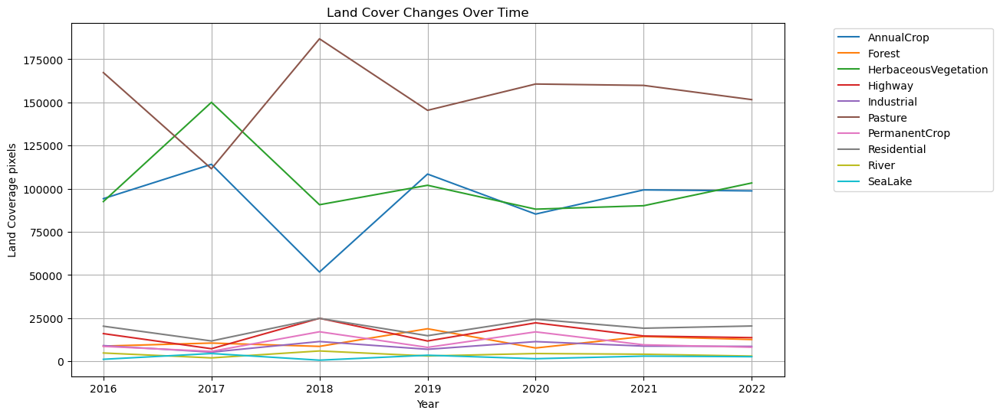

In [37]:
### line chart showing all land use cols

plt.figure(figsize=(12, 6))
#loop through cols creating lines
for column in land_use_summary_pivot.columns[1:]:  # doesnt use the year column
    plt.plot(land_use_summary_pivot['year'], land_use_summary_pivot[column], label=column)

# adds labels/titles
plt.xlabel('Year')
plt.ylabel('Land Coverage pixels')
plt.title('Land Cover Changes Over Time')
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
plt.grid(True)
plt.xticks(land_use_summary_pivot['year'])

plt.show()

## Summary of GHG

In [38]:
### pivot table with summary of total ghg

ghg_summary_pivot = land_use_ghg_df.groupby(['year'])[['LULUCF Net Emissions: Bioenergy crops',
                                                       'LULUCF Net Emissions: Cropland mineral soils under LUC',
                                                       'LULUCF Net Emissions: Forestry',
                                                       'LULUCF Net Emissions: Grassland mineral soils under LUC',
                                                       'LULUCF Net Emissions: Other LULUCF',
                                                       'LULUCF Net Emissions: Peatland',
                                                       'LULUCF Net Emissions: Settlements']].sum().reset_index()

ghg_summary_pivot

,year,LULUCF Net Emissions: Bioenergy crops,LULUCF Net Emissions: Cropland mineral soils under LUC,LULUCF Net Emissions: Forestry,LULUCF Net Emissions: Grassland mineral soils under LUC,LULUCF Net Emissions: Other LULUCF,LULUCF Net Emissions: Peatland,LULUCF Net Emissions: Settlements
0,2016,-9.123854,7906.578535,-13093.000836,-5763.886496,122.771397,10418.963293,2347.390645
1,2017,-11.629239,7861.529555,-13206.945587,-5781.825189,58.665090,10360.176886,2327.286287
2,2018,-2.393717,7770.785450,-13160.362566,-5847.296456,128.350372,10254.912412,2355.996582
3,2019,-17.245456,7740.818203,-12709.463914,-5856.401072,146.948686,10224.761713,2356.297804
4,2020,-6.978339,7719.926887,-12939.287100,-5890.353693,227.813982,10169.975074,2364.682810
5,2021,-6.828899,7677.301114,-12585.918961,-5932.453204,146.858103,10112.211951,2330.904425
6,2022,-6.828743,7621.023235,-12347.014931,-5956.941056,177.496962,10051.593002,2339.316232


## line chart of all LULUC GHG cols

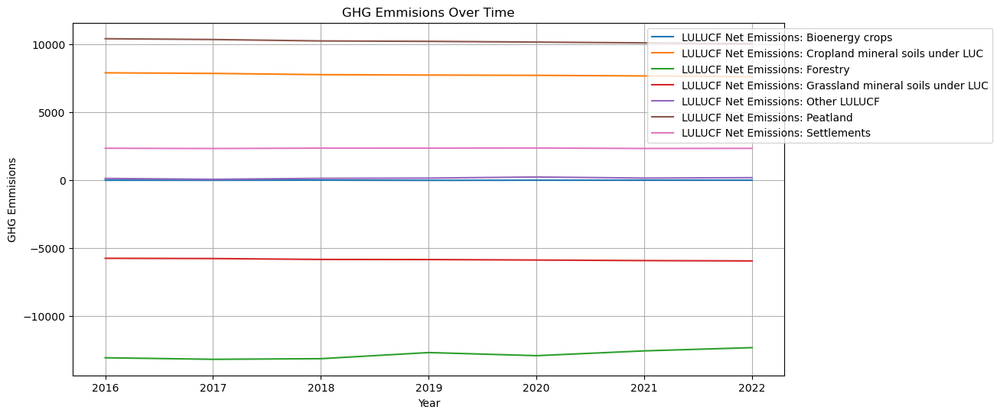

In [39]:
### line chart showing all land use cols

plt.figure(figsize=(12, 6))
#loop through cols creating lines
for column in ghg_summary_pivot.columns[1:]:  # doesnt use the year column
    plt.plot(ghg_summary_pivot['year'], ghg_summary_pivot[column], label=column)

# adds labels/titles
plt.xlabel('Year')
plt.ylabel('GHG Emmisions')
plt.title('GHG Emmisions Over Time')
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
plt.grid(True)
plt.xticks(ghg_summary_pivot['year'])

plt.show()

# Standardise cols and headers

Use the following categories to standardise

| LULUCF Category         | Land Use Category (Eurosat)          | Local Authority GHG Category                                 |
|-------------------------|--------------------------------------|--------------------------------------------------------------|
| Cropland               | AnnualCrop, PermanentCrop           | Bioenergy crops, Cropland mineral soils under LUC           |
| Forest Land            | Forest                              | Forestry                                                    |
| Grassland / Wetland    | HerbaceousVegetation, Pasture       | Grassland mineral soils under LUC, Peatland                 |
| Other                 | River, Sea                          | Other LULUCF                                                |
| Settlements           | Residential, Industrial, Highway    | Settlements                                                 |


In [40]:
### standardise cols and headers
## join into common categories between LULUCF

# land use cols
land_use_ghg_df['Cropland_LandUse'] = land_use_ghg_df['AnnualCrop'] + land_use_ghg_df['PermanentCrop']

land_use_ghg_df['ForestLand_LandUse'] = land_use_ghg_df['Forest']

land_use_ghg_df['GrasslandWetland_LandUse'] = land_use_ghg_df['HerbaceousVegetation'] + land_use_ghg_df['Pasture']

land_use_ghg_df['Other_LandUse'] = land_use_ghg_df['River'] + land_use_ghg_df['SeaLake']

land_use_ghg_df['Settlements_LandUse'] = (land_use_ghg_df['Residential'] + land_use_ghg_df['Industrial'] 
                                          + land_use_ghg_df['Highway'])

# ghg cols
land_use_ghg_df['Cropland_GHG'] = (land_use_ghg_df['LULUCF Net Emissions: Bioenergy crops'] 
                                   + land_use_ghg_df['LULUCF Net Emissions: Cropland mineral soils under LUC'])

land_use_ghg_df['ForestLand_GHG'] = (land_use_ghg_df['LULUCF Net Emissions: Forestry'])

land_use_ghg_df['GrasslandWetland_GHG'] = (land_use_ghg_df['LULUCF Net Emissions: Grassland mineral soils under LUC'] 
                                           + land_use_ghg_df['LULUCF Net Emissions: Peatland'])

land_use_ghg_df['Other_GHG'] = (land_use_ghg_df['LULUCF Net Emissions: Other LULUCF'])

land_use_ghg_df['Settlements_GHG'] = (land_use_ghg_df['LULUCF Net Emissions: Settlements'])

In [41]:
land_use_ghg_df.head(1)

,local_authority,year,total_pixels,total_sqkm,AnnualCrop,Forest,HerbaceousVegetation,Highway,Industrial,Pasture,PermanentCrop,Residential,River,SeaLake,LULUCF Net Emissions: Bioenergy crops,LULUCF Net Emissions: Cropland mineral soils under LUC,LULUCF Net Emissions: Forestry,LULUCF Net Emissions: Grassland mineral soils under LUC,LULUCF Net Emissions: Other LULUCF,LULUCF Net Emissions: Peatland,LULUCF Net Emissions: Settlements,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG
0,South Ayrshire,2016,12284471,1228.4471,57,80,1180,153,45,1430,22,75,65,4,0.0,60.80008,-168.406704,-73.417539,-0.100247,95.996431,20.931298,914.043309,Scotland,1234.6853,112.567854,Rural,79,80,2610,69,273,60.80008,-168.406704,22.578893,-0.100247,20.931298


In [42]:
# drop old columns
land_use_ghg_df = land_use_ghg_df.drop(columns=['AnnualCrop',
                                                'Forest',
                                                'HerbaceousVegetation',
                                                'Highway',
                                                'Industrial',
                                                'Pasture',
                                                'PermanentCrop',
                                                'Residential',
                                                'River',
                                                'SeaLake',
                                                'LULUCF Net Emissions: Bioenergy crops',
                                                'LULUCF Net Emissions: Cropland mineral soils under LUC',
                                                'LULUCF Net Emissions: Forestry',
                                                'LULUCF Net Emissions: Grassland mineral soils under LUC',
                                                'LULUCF Net Emissions: Other LULUCF',
                                                'LULUCF Net Emissions: Peatland',
                                                'LULUCF Net Emissions: Settlements'])

In [43]:
land_use_ghg_df

,local_authority,year,total_pixels,total_sqkm,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG
0,South Ayrshire,2016,12284471,1228.4471,914.043309,Scotland,1234.6853,112.567854,Rural,79,80,2610,69,273,60.800080,-168.406704,22.578893,-0.100247,20.931298
1,Huntingdonshire,2016,9121024,912.1024,1921.331100,East of England,912.5461,177.361733,Urban,837,20,900,67,500,30.817585,-22.369041,285.969690,0.276267,6.148401
2,Tewkesbury,2016,4102733,410.2733,893.603856,South West,414.9760,88.153766,Urban,125,4,799,9,156,13.104769,-22.629027,-14.844106,0.324541,3.407730
3,West Lancashire,2016,3427363,342.7363,1033.234330,North West,381.3803,114.563882,Urban,172,7,547,7,165,8.864708,-11.068474,213.030559,0.067400,3.649448
4,Darlington,2016,1976753,197.6753,667.990971,North East,197.4758,106.925688,Urban,127,1,269,6,118,8.121586,-5.683302,-4.716493,0.112159,3.009305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2333,Birmingham,2022,2674485,267.4485,4316.447767,West Midlands,267.7912,1157.603000,Urban,12,2,197,2,483,0.719413,-8.254602,12.142281,0.037500,17.066511
2334,Torridge,2022,9688162,968.8162,626.901017,South West,995.2034,68.635000,Rural,764,55,1654,10,21,16.184232,-93.930942,-34.449140,-0.203014,2.409826
2335,Stockton-on-Tees,2022,1586619,158.6619,1978.178678,North East,209.7309,199.966000,Urban,51,0,207,3,164,5.140902,-10.184451,-3.465311,0.072600,7.642307
2336,Perth & Kinross,2022,53376489,5337.6489,1258.152671,Scotland,5418.9445,151.120000,Rural,5722,2905,4618,46,72,488.102005,-519.099546,-157.395750,-3.128700,28.999456


## pivot again

In [44]:
### pivot table with summary of total land use 

land_use_summary_pivot = land_use_ghg_df.groupby(['year'])[['Cropland_LandUse',
                                                            'ForestLand_LandUse','GrasslandWetland_LandUse','Other_LandUse',
                                                            'Settlements_LandUse']].sum().reset_index()

land_use_summary_pivot

,year,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse
0,2016,102901,8825,259855,5997,45490
1,2017,119915,10578,261629,6512,24420
2,2018,68856,8657,277594,6670,61286
3,2019,116578,18867,247425,6636,33574
4,2020,102378,7731,248832,6024,58116
5,2021,108880,14382,250030,7125,42665
6,2022,106928,12625,254969,5722,42845


In [45]:
ghg_summary_pivot = land_use_ghg_df.groupby(['year'])[['Cropland_GHG',
                                                       'ForestLand_GHG',
                                                       'GrasslandWetland_GHG',
                                                       'Other_GHG',
                                                       'Settlements_GHG']].sum().reset_index()

ghg_summary_pivot

,year,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG
0,2016,7897.454681,-13093.000836,4655.076797,122.771397,2347.390645
1,2017,7849.900316,-13206.945587,4578.351697,58.665090,2327.286287
2,2018,7768.391733,-13160.362566,4407.615956,128.350372,2355.996582
3,2019,7723.572746,-12709.463914,4368.360642,146.948686,2356.297804
4,2020,7712.948548,-12939.287100,4279.621381,227.813982,2364.682810
5,2021,7670.472214,-12585.918961,4179.758746,146.858103,2330.904425
6,2022,7614.194492,-12347.014931,4094.651946,177.496962,2339.316232


## Line charts with standardised cols

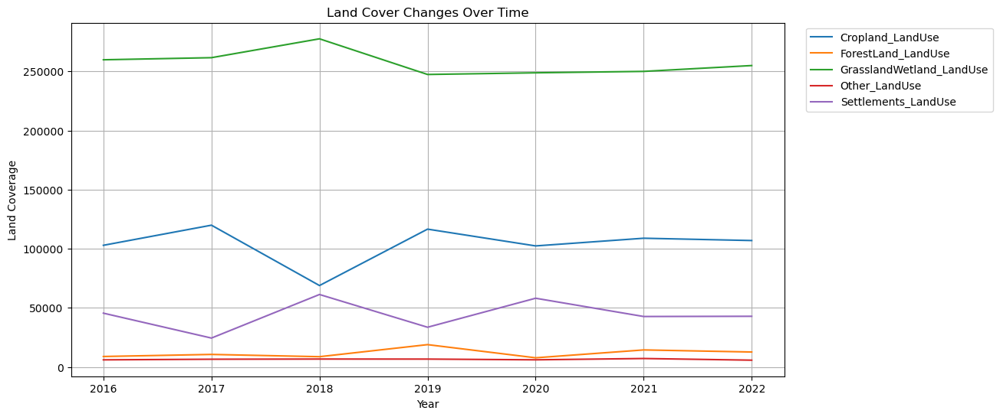

In [46]:
plt.figure(figsize=(12, 6))
#loop through cols creating lines
for column in land_use_summary_pivot.columns[1:]:
    plt.plot(land_use_summary_pivot['year'], land_use_summary_pivot[column], label=column)

#adss labels/titles
plt.xlabel('Year')
plt.ylabel('Land Coverage')
plt.title('Land Cover Changes Over Time')
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
plt.grid(True)
plt.xticks(land_use_summary_pivot['year'])

plt.show()

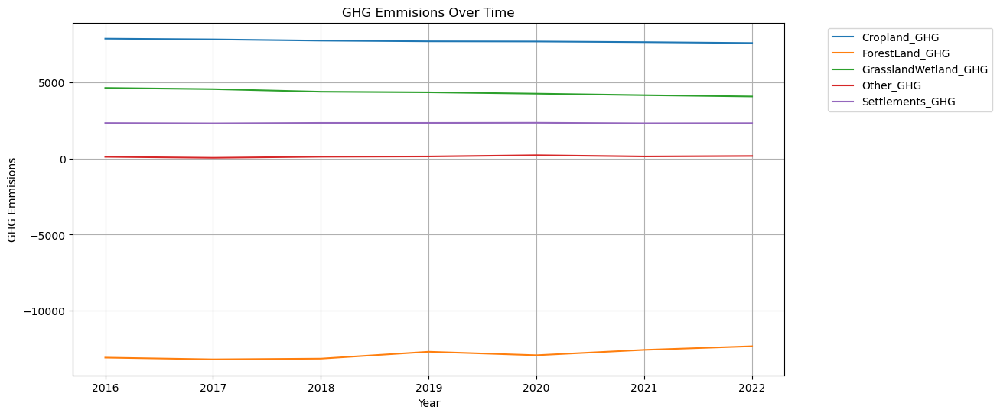

In [47]:
plt.figure(figsize=(12, 6))
#loop through cols creating lines
for column in ghg_summary_pivot.columns[1:]:
    plt.plot(ghg_summary_pivot['year'], ghg_summary_pivot[column], label=column)

#labels/titles
plt.xlabel('Year')
plt.ylabel('GHG Emmisions')
plt.title('GHG Emmisions Over Time')
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
plt.grid(True)
plt.xticks(ghg_summary_pivot['year'])

plt.show()

### Convert pixel count per land use class to sqkm

640×640m2 = 409,600m2 = 0.4096 km2

In [48]:
columns_to_transform = ['Cropland_LandUse','ForestLand_LandUse','GrasslandWetland_LandUse',
                        'Other_LandUse','Settlements_LandUse']  # list of cols to apply to
# multiplies pixels by 0.4096 to get sqkm 
land_use_ghg_df[columns_to_transform] = land_use_ghg_df[columns_to_transform] * 0.4096

In [49]:
land_use_ghg_df

,local_authority,year,total_pixels,total_sqkm,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG
0,South Ayrshire,2016,12284471,1228.4471,914.043309,Scotland,1234.6853,112.567854,Rural,32.3584,32.7680,1069.0560,28.2624,111.8208,60.800080,-168.406704,22.578893,-0.100247,20.931298
1,Huntingdonshire,2016,9121024,912.1024,1921.331100,East of England,912.5461,177.361733,Urban,342.8352,8.1920,368.6400,27.4432,204.8000,30.817585,-22.369041,285.969690,0.276267,6.148401
2,Tewkesbury,2016,4102733,410.2733,893.603856,South West,414.9760,88.153766,Urban,51.2000,1.6384,327.2704,3.6864,63.8976,13.104769,-22.629027,-14.844106,0.324541,3.407730
3,West Lancashire,2016,3427363,342.7363,1033.234330,North West,381.3803,114.563882,Urban,70.4512,2.8672,224.0512,2.8672,67.5840,8.864708,-11.068474,213.030559,0.067400,3.649448
4,Darlington,2016,1976753,197.6753,667.990971,North East,197.4758,106.925688,Urban,52.0192,0.4096,110.1824,2.4576,48.3328,8.121586,-5.683302,-4.716493,0.112159,3.009305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2333,Birmingham,2022,2674485,267.4485,4316.447767,West Midlands,267.7912,1157.603000,Urban,4.9152,0.8192,80.6912,0.8192,197.8368,0.719413,-8.254602,12.142281,0.037500,17.066511
2334,Torridge,2022,9688162,968.8162,626.901017,South West,995.2034,68.635000,Rural,312.9344,22.5280,677.4784,4.0960,8.6016,16.184232,-93.930942,-34.449140,-0.203014,2.409826
2335,Stockton-on-Tees,2022,1586619,158.6619,1978.178678,North East,209.7309,199.966000,Urban,20.8896,0.0000,84.7872,1.2288,67.1744,5.140902,-10.184451,-3.465311,0.072600,7.642307
2336,Perth & Kinross,2022,53376489,5337.6489,1258.152671,Scotland,5418.9445,151.120000,Rural,2343.7312,1189.8880,1891.5328,18.8416,29.4912,488.102005,-519.099546,-157.395750,-3.128700,28.999456


### make a longform dataset

In [50]:
# https://pandas.pydata.org/docs/reference/api/pandas.melt.html

# columns to melt
id_vars = ['local_authority', 'year', 'Region']
value_vars = [col for col in land_use_ghg_df.columns if col not in id_vars and col not in 
              ['total_pixels', 'total_sqkm', 'all_emmisions_sum', 'Area (km2)', 'Mid-year Population (thousands)']]

# melt df
land_use_ghg_df_melted = land_use_ghg_df.melt(id_vars=id_vars, value_vars=value_vars,
                                              var_name='Variable', value_name='Value')

# extract LULUCF_category and type - landuse or GHG
land_use_ghg_df_melted['LULUCF_category'] = land_use_ghg_df_melted['Variable'].str.split('_').str[0]  # gets prefix
land_use_ghg_df_melted['Type'] = land_use_ghg_df_melted['Variable'].str.split('_').str[1]  # gets suffix - landuse or GHG

# pivot to create landuse and GHG cols
land_use_ghg_df_longform = land_use_ghg_df_melted.pivot_table(index=['local_authority', 'year', 'Region', 'LULUCF_category'], 
                                                              columns='Type', values='Value', aggfunc='sum').reset_index()

land_use_ghg_df_longform.columns.name = None  # removes name assigned

In [51]:
# https://pandas.pydata.org/docs/reference/api/pandas.melt.html

# columns to melt
id_vars = ['local_authority', 'year', 'Region', 'rural/urban']
value_vars = [col for col in land_use_ghg_df.columns if col not in id_vars and col not in 
              ['total_pixels', 'total_sqkm', 'all_emmisions_sum', 'Area (km2)', 'Mid-year Population (thousands)']]

# melt df
land_use_ghg_df_melted = land_use_ghg_df.melt(id_vars=id_vars, value_vars=value_vars,
                                              var_name='Variable', value_name='Value')

# extract LULUCF_category and type - landuse or GHG
land_use_ghg_df_melted['LULUCF_category'] = land_use_ghg_df_melted['Variable'].str.split('_').str[0]  # gets prefix
land_use_ghg_df_melted['Type'] = land_use_ghg_df_melted['Variable'].str.split('_').str[1]  # gets suffix - landuse or GHG

# pivot to create landuse and GHG cols
land_use_ghg_df_longform = land_use_ghg_df_melted.pivot_table(index=['local_authority', 'year', 'Region',
                                                                     'LULUCF_category', 'rural/urban'], 
                                                              columns='Type', values='Value', aggfunc='sum').reset_index()

land_use_ghg_df_longform.columns.name = None  # removes name assigned

In [52]:
land_use_ghg_df_longform

,local_authority,year,Region,LULUCF_category,rural/urban,GHG,LandUse
0,Aberdeen City,2016,Scotland,Cropland,Urban,23.444301,38.0928
1,Aberdeen City,2016,Scotland,ForestLand,Urban,-8.793797,0.8192
2,Aberdeen City,2016,Scotland,GrasslandWetland,Urban,-8.672550,101.9904
3,Aberdeen City,2016,Scotland,Other,Urban,-0.195695,2.4576
4,Aberdeen City,2016,Scotland,Settlements,Urban,22.495649,54.0672
...,...,...,...,...,...,...,...
11685,York,2022,Yorkshire and the Humber,Cropland,Urban,9.734717,38.9120
11686,York,2022,Yorkshire and the Humber,ForestLand,Urban,-7.776860,0.4096
11687,York,2022,Yorkshire and the Humber,GrasslandWetland,Urban,22.713738,155.2384
11688,York,2022,Yorkshire and the Humber,Other,Urban,0.309932,1.2288


## Analysis of results

### Distributions

The distributions show:

GHG emissions

Most GHG categories spike near zero suggesting that most local authorities have relatively low emmisions for each category

Positive right tailed distribution - Cropland, GrasslandWetland, and Settlements have long right tails showing that whereas mostly local authorities have low emissions some regions have extreme values. Suggests that urbanb expansion in certain areas has led to high emisions - likely sue to industrial activities and industrial development

Negative Left talied distribution - ForestLand has many values below zero highlighting that some LA areas act as carbon sinks whre the forest areas absorb more co2 than the emit

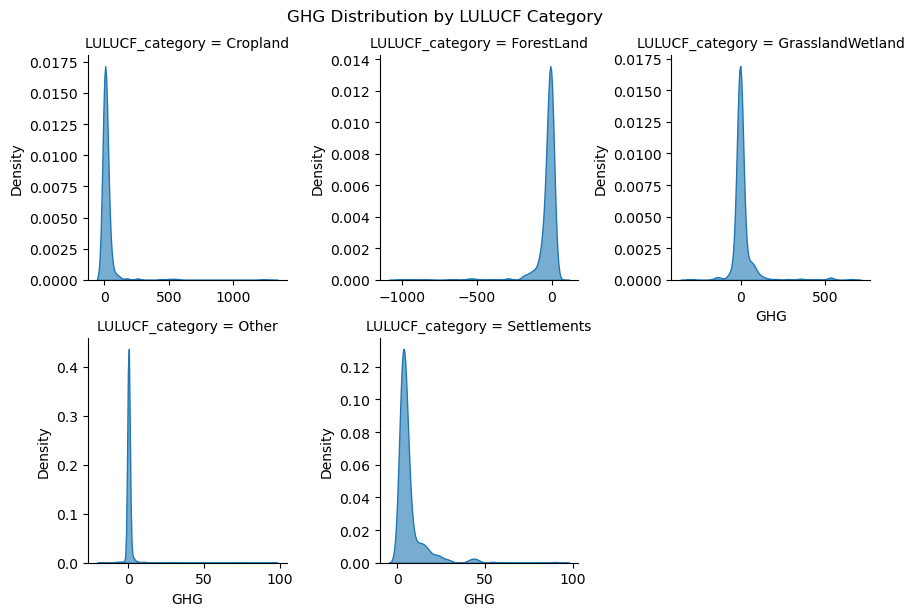

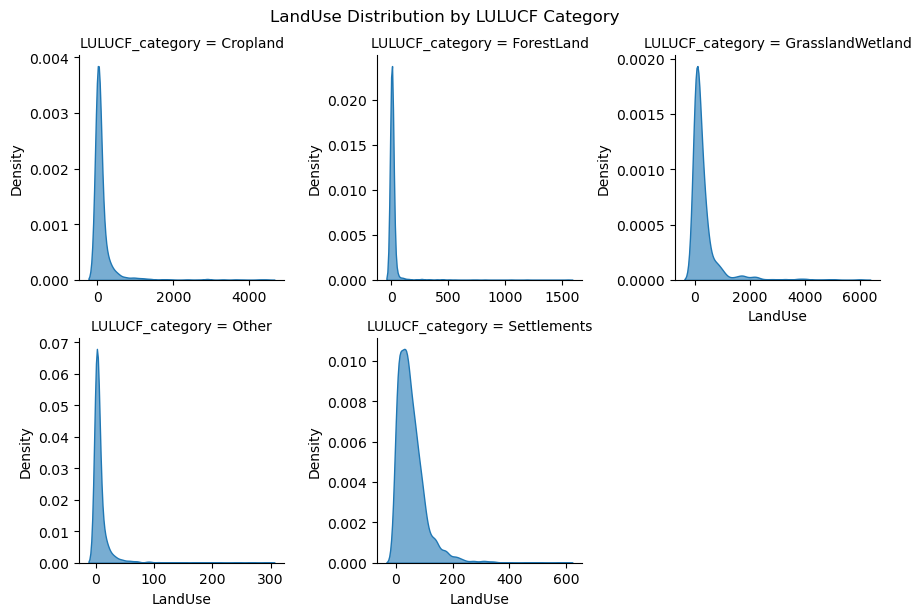

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt

# creates FacetGrid for GHG distributions
g = sns.FacetGrid(land_use_ghg_df_longform, col="LULUCF_category", col_wrap=3, sharex=False, sharey=False)
g.map(sns.kdeplot, "GHG", fill=True, alpha=0.6)
g.fig.suptitle("GHG Distribution by LULUCF Category", y=1.02)

plt.show()

# create FacetGrid for LandUse distributions
g = sns.FacetGrid(land_use_ghg_df_longform, col="LULUCF_category", col_wrap=3, sharex=False, sharey=False)
g.map(sns.kdeplot, "LandUse", fill=True, alpha=0.6)
g.fig.suptitle("LandUse Distribution by LULUCF Category", y=1.02)

plt.show()

### Summary stats

In [54]:
land_use_ghg_df.agg(
    {
        "Cropland_LandUse": ["min", "max", "median", "mean"],
        "ForestLand_LandUse": ["min", "max", "median", "mean"],
        "GrasslandWetland_LandUse": ["min", "max", "median", "mean"],
        "Other_LandUse": ["min", "max", "median", "mean"],
        "Settlements_LandUse": ["min", "max", "median", "mean"],
        "ForestLand_LandUse": ["min", "max", "median", "mean"],
        
    }
)


,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse
min,0.000000,0.000000,0.409600,0.000000,0.000000
max,4436.377600,1548.697600,6009.651200,294.092800,590.233600
median,20.889600,1.638400,130.252800,2.048000,41.779200
mean,127.266119,14.307093,315.404964,7.828651,54.028658


### Line charts for land changes over time

In [55]:
category_list = list(set(land_use_ghg_df_longform['LULUCF_category'].to_list()))

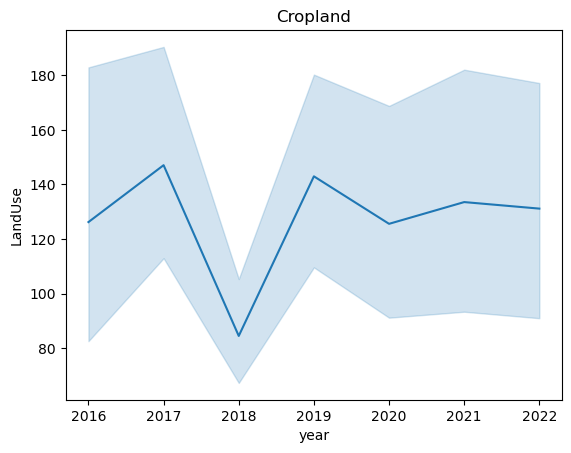

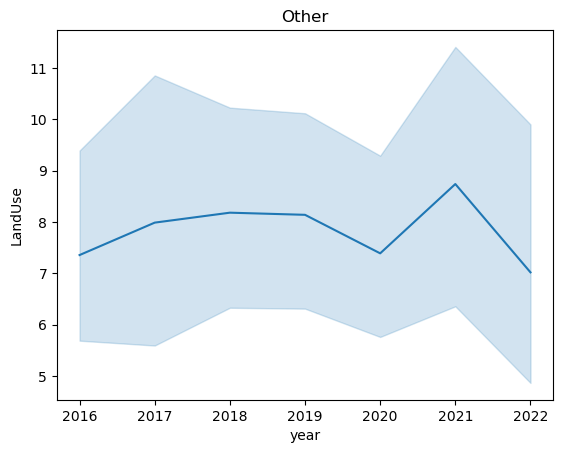

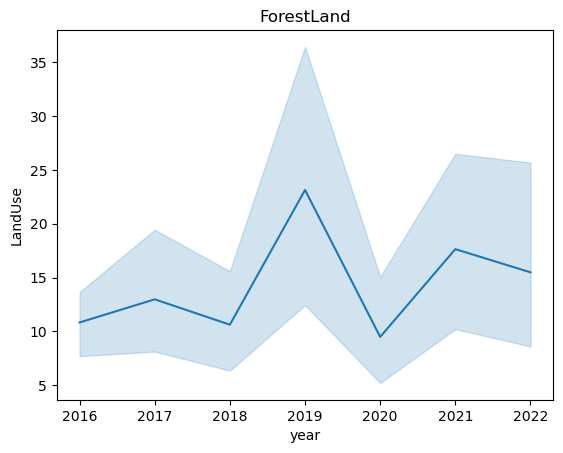

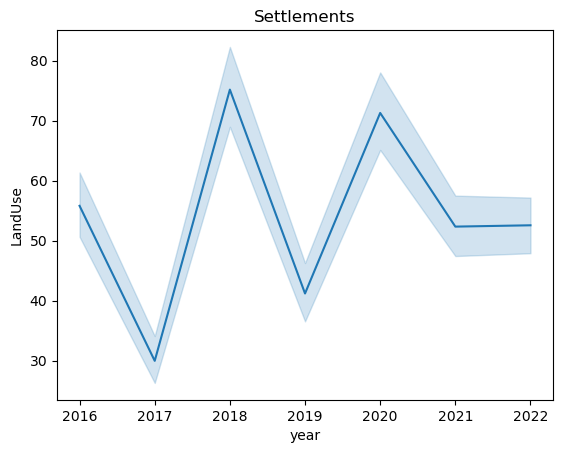

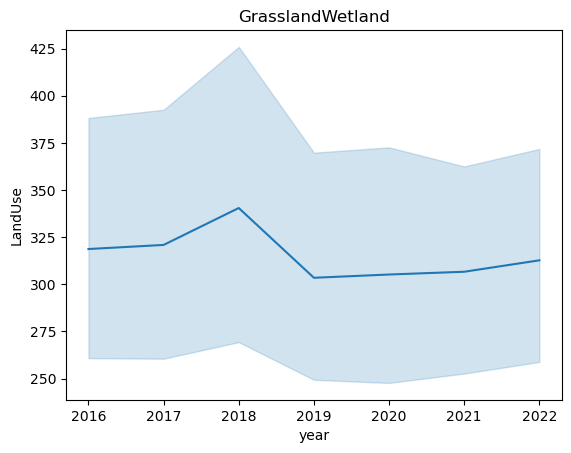

In [56]:
for i in category_list:
    category = land_use_ghg_df_longform.query(f"LULUCF_category == '{i}'")
    sns.lineplot(data=category, x="year", y="LandUse", markers=True).set_title(i)
    plt.show()

# Research Q2

#### Research questions are not in the correct order as I switched them around in the report

## How have land use and land cover categories changed between 2016 and 2022 in the UK?

### Percentage changes

### Change by year

In [57]:
land_use_ghg_df_longform

,local_authority,year,Region,LULUCF_category,rural/urban,GHG,LandUse
0,Aberdeen City,2016,Scotland,Cropland,Urban,23.444301,38.0928
1,Aberdeen City,2016,Scotland,ForestLand,Urban,-8.793797,0.8192
2,Aberdeen City,2016,Scotland,GrasslandWetland,Urban,-8.672550,101.9904
3,Aberdeen City,2016,Scotland,Other,Urban,-0.195695,2.4576
4,Aberdeen City,2016,Scotland,Settlements,Urban,22.495649,54.0672
...,...,...,...,...,...,...,...
11685,York,2022,Yorkshire and the Humber,Cropland,Urban,9.734717,38.9120
11686,York,2022,Yorkshire and the Humber,ForestLand,Urban,-7.776860,0.4096
11687,York,2022,Yorkshire and the Humber,GrasslandWetland,Urban,22.713738,155.2384
11688,York,2022,Yorkshire and the Humber,Other,Urban,0.309932,1.2288


In [58]:
# pivot - makes rows LULUCF categories and cols years
pc_change_pivot_year = land_use_ghg_df_longform.pivot_table(index='LULUCF_category',
                                                            columns='year',
                                                            values='LandUse',
                                                            aggfunc='sum').reset_index()


pc_change_pivot_year

year,LULUCF_category,2016,2017,2018,2019,2020,2021,2022
0,Cropland,42148.2496,49117.1840,28203.4176,47750.3488,41934.0288,44597.2480,43797.7088
1,ForestLand,3614.7200,4332.7488,3545.9072,7727.9232,3166.6176,5890.8672,5171.2000
2,GrasslandWetland,106436.6080,107163.2384,113702.5024,101345.2800,101921.5872,102412.2880,104435.3024
3,Other,2456.3712,2667.3152,2732.0320,2718.1056,2467.4304,2918.4000,2343.7312
4,Settlements,18632.7040,10002.4320,25102.7456,13751.9104,23804.3136,17475.5840,17549.3120


In [59]:


# calcualates percentage changes between years
pc_change_pivot_year['p/c change 2016-17'] = ((pc_change_pivot_year[2017] - pc_change_pivot_year[2016]) / 
                                              pc_change_pivot_year[2016]) * 100

pc_change_pivot_year['p/c change 2017-18'] = ((pc_change_pivot_year[2018] - pc_change_pivot_year[2017]) / 
                                              pc_change_pivot_year[2017]) * 100

pc_change_pivot_year['p/c change 2018-19'] = ((pc_change_pivot_year[2019] - pc_change_pivot_year[2018]) / 
                                              pc_change_pivot_year[2018]) * 100

pc_change_pivot_year['p/c change 2019-20'] = ((pc_change_pivot_year[2020] - pc_change_pivot_year[2019]) / 
                                              pc_change_pivot_year[2019]) * 100

pc_change_pivot_year['p/c change 2020-21'] = ((pc_change_pivot_year[2021] - pc_change_pivot_year[2020]) / 
                                              pc_change_pivot_year[2020]) * 100

pc_change_pivot_year['p/c change 2021-22'] = ((pc_change_pivot_year[2022] - pc_change_pivot_year[2021]) / 
                                              pc_change_pivot_year[2021]) * 100

# calcs total percentage change from 2016-2022
pc_change_pivot_year['p/c change 2016-22'] = ((pc_change_pivot_year[2022] - pc_change_pivot_year[2016]) / 
                                              pc_change_pivot_year[2016]) * 100

# drops original year cols
pc_change_pivot_year = pc_change_pivot_year.drop(columns=[2016, 2017, 2018, 2019, 2020, 2021, 2022])



In [60]:
pc_change_pivot_year

year,LULUCF_category,p/c change 2016-17,p/c change 2017-18,p/c change 2018-19,p/c change 2019-20,p/c change 2020-21,p/c change 2021-22,p/c change 2016-22
0,Cropland,16.534339,-42.579327,69.306959,-12.180686,6.350974,-1.792799,3.913470
1,ForestLand,19.864023,-18.160333,117.939240,-59.023692,86.030268,-12.216660,43.059490
2,GrasslandWetland,0.682688,6.102152,-10.868030,0.568657,0.481449,1.975363,-1.880279
3,Other,8.587627,2.426290,-0.509745,-9.222423,18.276892,-19.691228,-4.585626
4,Settlements,-46.317872,150.966421,-45.217505,73.098231,-26.586482,0.421891,-5.814465


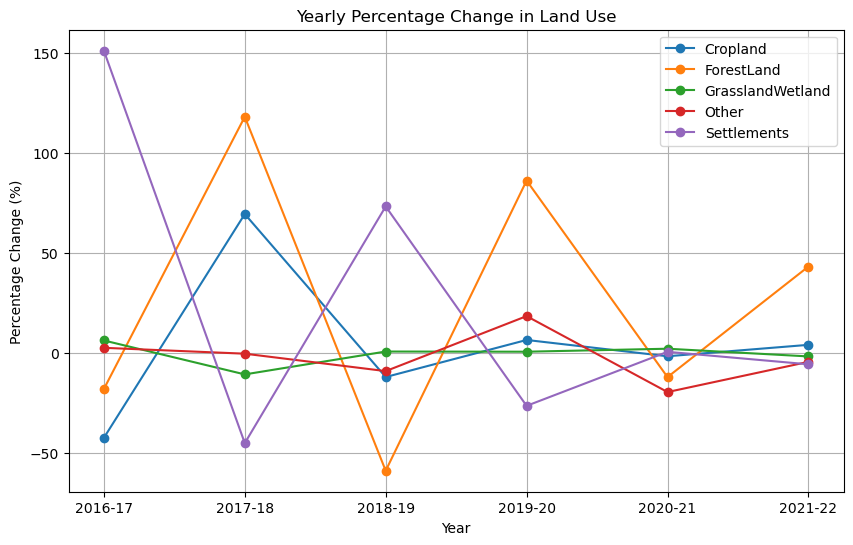

In [61]:
plt.figure(figsize=(10, 6))
for category in pc_change_pivot_year['LULUCF_category'].unique():
    subset = pc_change_pivot_year[pc_change_pivot_year['LULUCF_category'] == category]
    plt.plot(subset.columns[2:], subset.iloc[0, 2:], marker='o', label=category)

plt.xlabel("Year")
plt.xticks(ticks=[0, 1, 2, 3, 4, 5], labels=['2016-17', '2017-18', '2018-19', '2019-20', '2020-21', '2021-22'])
plt.ylabel('Percentage Change (%)')
plt.title('Yearly Percentage Change in Land Use')
plt.legend()
plt.grid(True)
plt.show()

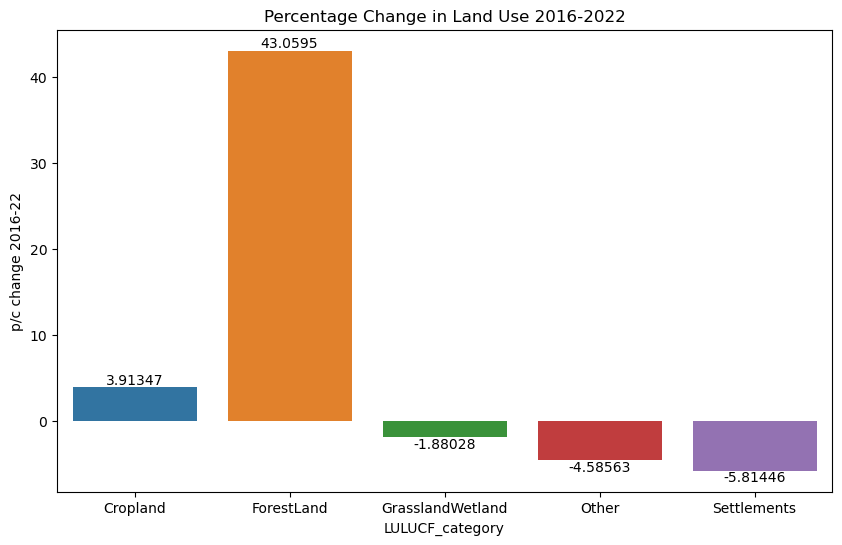

In [62]:
plt.figure(figsize=(10, 6))
plt.title('Percentage Change in Land Use 2016-2022')
ax = sns.barplot(pc_change_pivot_year, x='LULUCF_category', y="p/c change 2016-22", errorbar=None)
ax.bar_label(ax.containers[0], fontsize=10);

# Stacked bars showing% per class

In [63]:
# get cols for summing
land_use_columns = land_use_summary_pivot.columns[1:] 

land_use_percentage = land_use_summary_pivot.copy() #  copy df

# sum up total for each row
land_use_percentage['Total_LandUse'] = land_use_percentage[land_use_columns].sum(axis=1)

# convert to %
land_use_percentage[land_use_columns] = (land_use_percentage[land_use_columns].div(land_use_percentage['Total_LandUse'],
                                                                                   axis=0)) * 100

land_use_percentage[land_use_columns] = land_use_percentage[land_use_columns].round(2)

# drop totals
land_use_percentage.drop(columns=['Total_LandUse'], inplace=True)

land_use_percentage

,year,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse
0,2016,24.32,2.09,61.42,1.42,10.75
1,2017,28.35,2.50,61.84,1.54,5.77
2,2018,16.28,2.05,65.62,1.58,14.49
3,2019,27.55,4.46,58.48,1.57,7.94
4,2020,24.20,1.83,58.81,1.42,13.74
5,2021,25.73,3.40,59.10,1.68,10.08
6,2022,25.27,2.98,60.26,1.35,10.13


<Figure size 1200x600 with 0 Axes>

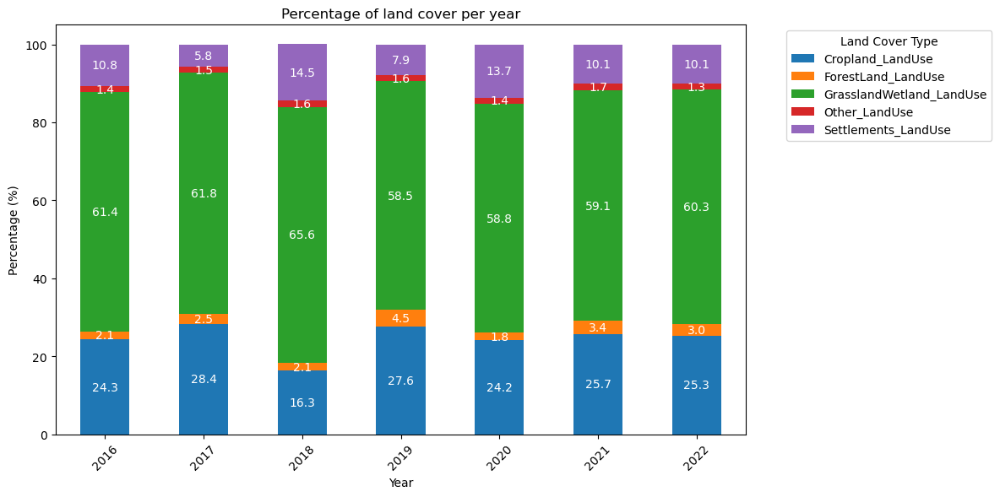

In [64]:
plt.figure(figsize=(12, 6))

ax = land_use_percentage.plot(
    x='year', kind='bar', stacked=True,
    title='Percentage of land cover per year',
    figsize=(12, 6)
)

# add labels
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f', fontsize=10, label_type='center', color='white')

# put legend to right hand side
ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1), title="Land Cover Type")

# this makes layout better
plt.xlabel("Year")
plt.ylabel("Percentage (%)")
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

### Change by year and region

In [65]:
# pivot - makes rows LULUCF categories and cols years
pc_change_pivot_region = land_use_ghg_df_longform.pivot_table(index=['Region','LULUCF_category'],
                                                            columns='year',
                                                            values='LandUse',
                                                            aggfunc='sum').reset_index()


pc_change_pivot_region

year,Region,LULUCF_category,2016,2017,2018,2019,2020,2021,2022
0,East Midlands,Cropland,3778.1504,6440.5504,4641.1776,6416.7936,4422.0416,5439.0784,3742.1056
1,East Midlands,ForestLand,114.6880,90.1120,77.8240,141.7216,64.3072,140.9024,94.2080
2,East Midlands,GrasslandWetland,7356.0064,6499.9424,6575.7184,6032.5888,6499.5328,6624.8704,7375.6672
3,East Midlands,Other,340.7872,582.8608,232.6528,151.1424,257.2288,201.9328,217.4976
4,East Midlands,Settlements,2283.1104,259.6864,2346.1888,1131.3152,2630.0416,1467.5968,2443.6736
5,East of England,Cropland,6304.1536,6988.5952,6344.2944,6184.5504,5040.9472,3452.5184,4877.1072
6,East of England,ForestLand,231.8336,142.1312,202.7520,189.6448,78.6432,144.5888,148.2752
7,East of England,GrasslandWetland,7258.1120,8711.7824,6113.2800,8300.9536,7891.7632,9973.7600,9481.8304
8,East of England,Other,458.7520,152.3712,455.0656,249.4464,328.0896,351.4368,176.9472
9,East of England,Settlements,2728.7552,988.3648,3867.4432,2059.0592,3643.8016,3060.5312,2301.1328


In [66]:
# calculate percentage changes between years and final column from start to end

pc_change_pivot_region['p/c change 2016-17'] = ((pc_change_pivot_region[2017]-pc_change_pivot_region[2016])/
                                              pc_change_pivot_region[2016]*100)

pc_change_pivot_region['p/c change 2017-18'] = ((pc_change_pivot_region[2018]-pc_change_pivot_region[2017])/
                                              pc_change_pivot_region[2017]*100)

pc_change_pivot_region['p/c change 2018-19'] = ((pc_change_pivot_region[2019]-pc_change_pivot_region[2018])/
                                              pc_change_pivot_region[2018]*100)

pc_change_pivot_region['p/c change 2019-20'] = ((pc_change_pivot_region[2020]-pc_change_pivot_region[2019])/
                                              pc_change_pivot_region[2019]*100)

pc_change_pivot_region['p/c change 2020-21'] = ((pc_change_pivot_region[2021]-pc_change_pivot_region[2020])/
                                              pc_change_pivot_region[2020]*100)

pc_change_pivot_region['p/c change 2021-22'] = ((pc_change_pivot_region[2022]-pc_change_pivot_region[2021])/
                                              pc_change_pivot_region[2021]*100)

pc_change_pivot_region['p/c change 2016-22'] = ((pc_change_pivot_region[2022]-pc_change_pivot_region[2016])/
                                              pc_change_pivot_region[2016]*100)

pc_change_pivot_region = pc_change_pivot_region.drop(columns = [2016,2017,2018,2019,2020,2021,2022])

In [67]:
pc_change_pivot_region

year,Region,LULUCF_category,p/c change 2016-17,p/c change 2017-18,p/c change 2018-19,p/c change 2019-20,p/c change 2020-21,p/c change 2021-22,p/c change 2016-22
0,East Midlands,Cropland,70.468343,-27.938184,38.257877,-31.086429,2.299926e+01,-31.199639,-0.954033
1,East Midlands,ForestLand,-21.428571,-13.636364,82.105263,-54.624277,1.191083e+02,-33.139535,-17.857143
2,East Midlands,GrasslandWetland,-11.637619,1.165795,-8.259624,7.740359,1.928409e+00,11.333004,0.267275
3,East Midlands,Other,71.033654,-60.084329,-35.035211,70.189702,-2.149682e+01,7.707911,-36.177885
4,East Midlands,Settlements,-88.625762,803.470032,-51.780726,132.476466,-4.419872e+01,66.508512,7.032652
5,East of England,Cropland,10.856994,-9.219318,-2.517916,-18.491291,-3.151052e+01,41.262309,-22.636606
6,East of England,ForestLand,-38.692580,42.651297,-6.464646,-58.531317,8.385417e+01,2.549575,-36.042403
7,East of England,GrasslandWetland,20.028217,-29.827448,35.785595,-4.929438,2.638190e+01,-4.932238,30.637698
8,East of England,Other,-66.785714,198.655914,-45.184518,31.527094,7.116105e+00,-49.650350,-61.428571
9,East of England,Settlements,-63.779646,291.297140,-46.759161,76.964392,-1.600719e+01,-24.812634,-15.670970


In [68]:
pc_change_pivot_region[pc_change_pivot_region['Region'] == 'London'] # filters to authority

year,Region,LULUCF_category,p/c change 2016-17,p/c change 2017-18,p/c change 2018-19,p/c change 2019-20,p/c change 2020-21,p/c change 2021-22,p/c change 2016-22
10,London,Cropland,82.464455,-71.948052,-18.518519,-4.545455,2.065147e-14,4.761905,-58.293839
11,London,ForestLand,44.654088,-94.347826,-38.461538,-50.000000,2.750000e+02,166.666667,-74.842767
12,London,GrasslandWetland,4.699140,-36.453202,-4.995693,8.068903,-1.174497e+01,6.273764,-35.931232
13,London,Other,13.888889,0.000000,17.073171,-10.416667,4.651163e+00,-4.444444,19.444444
14,London,Settlements,-16.641604,69.753458,2.692171,-2.621594,4.463337e+00,-3.119702,43.208020


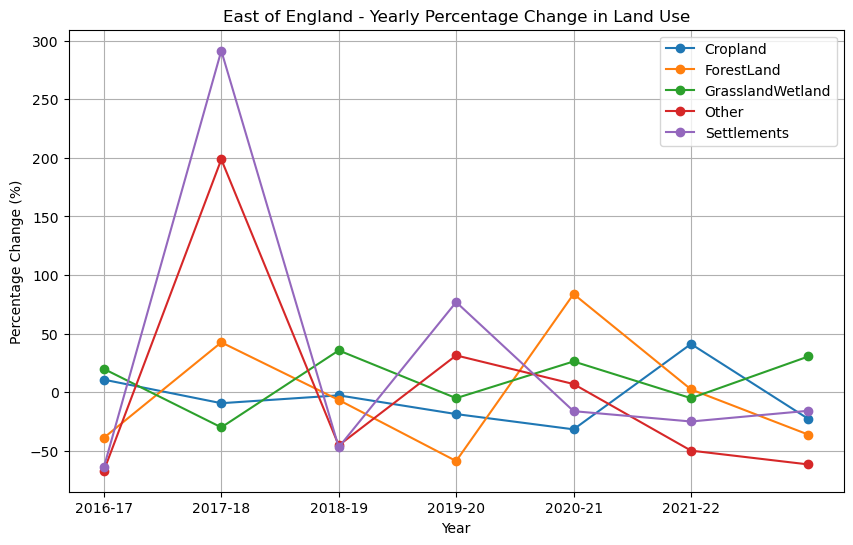

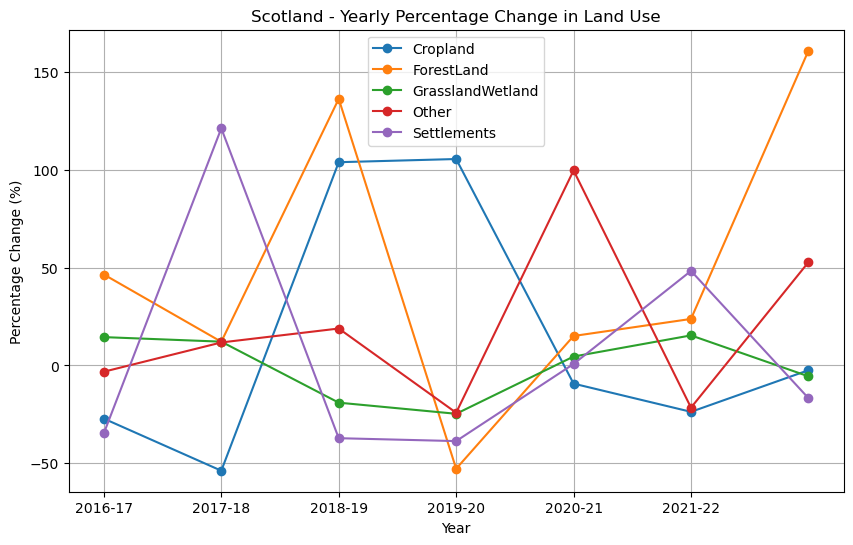

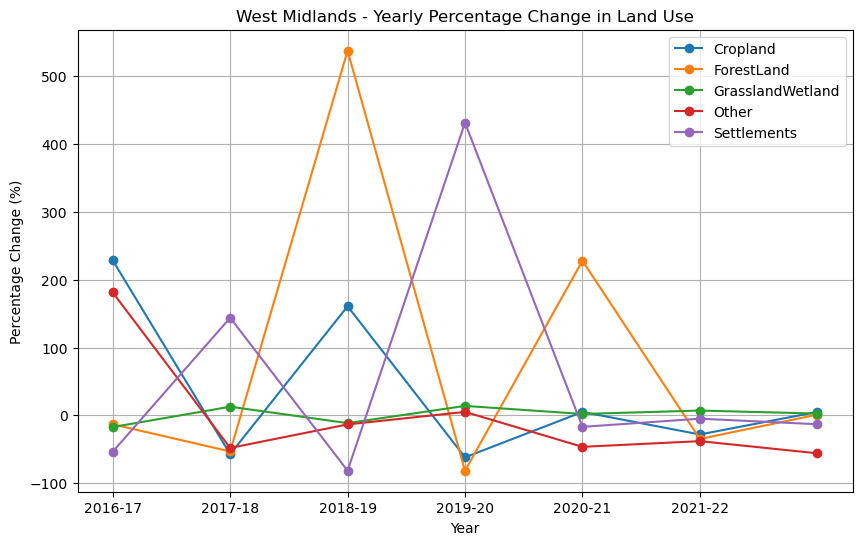

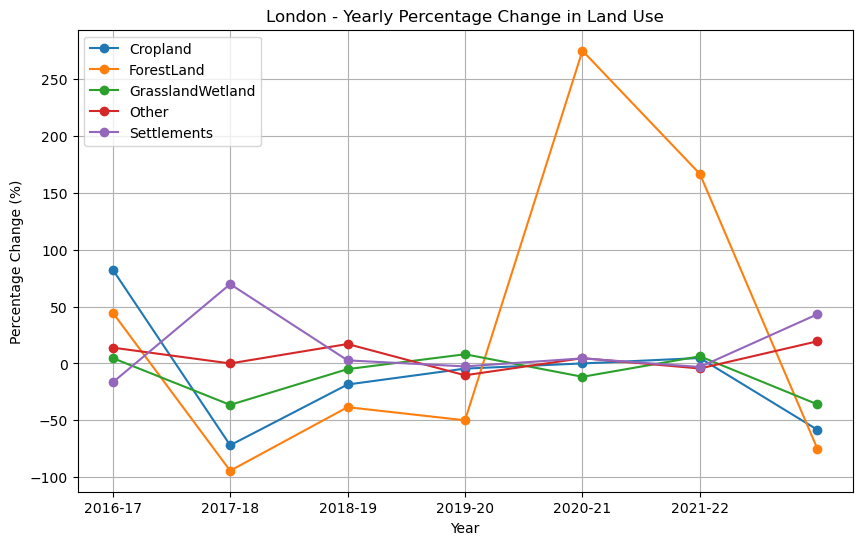

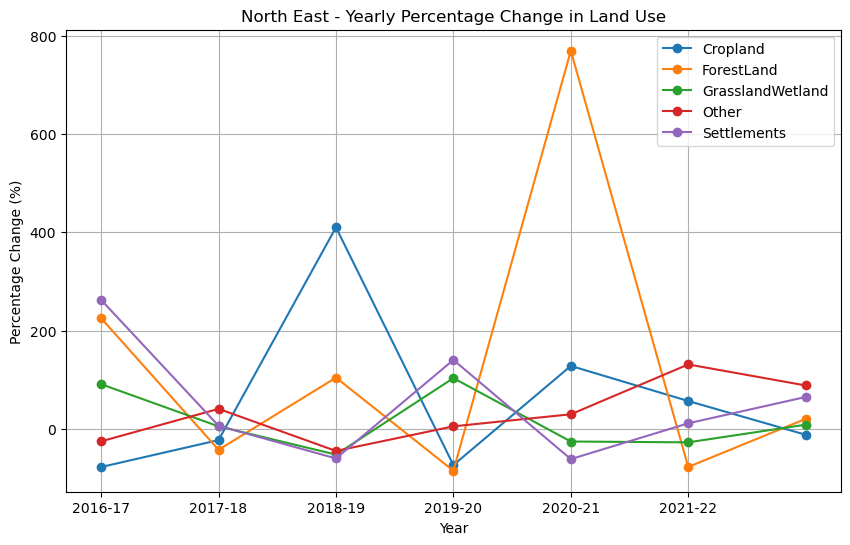

...

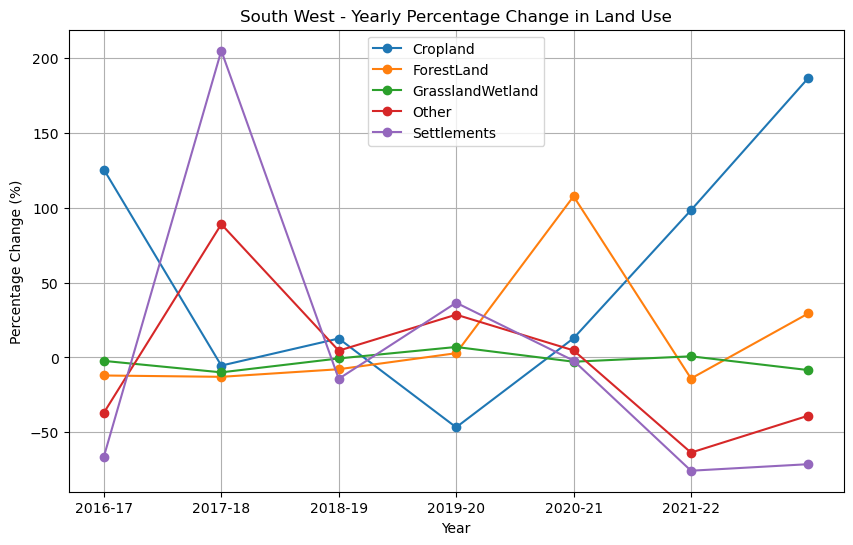

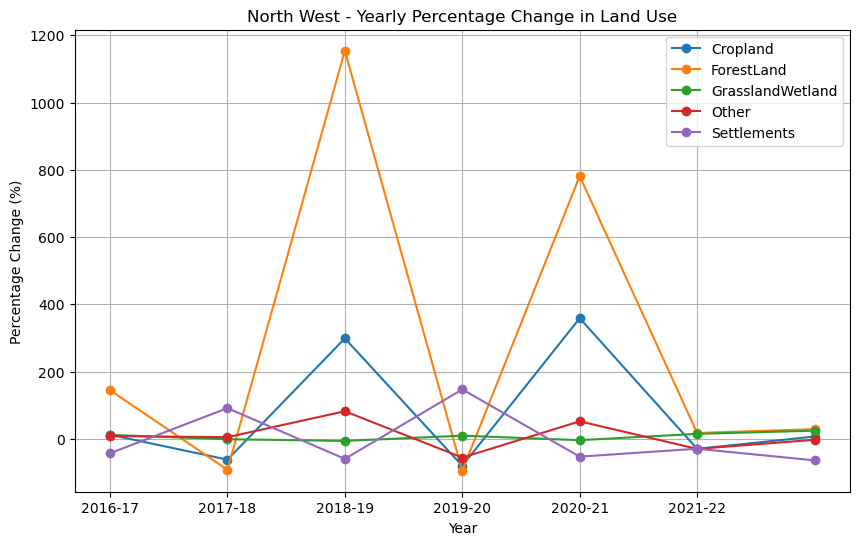

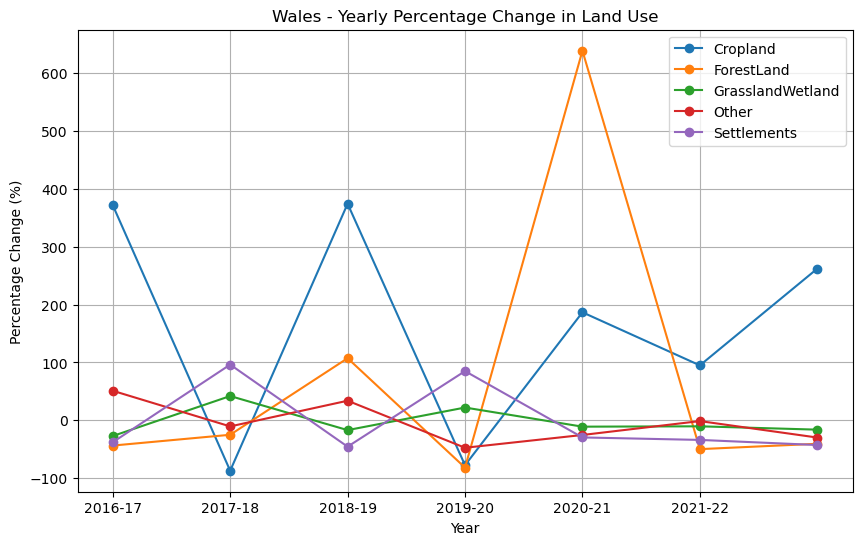

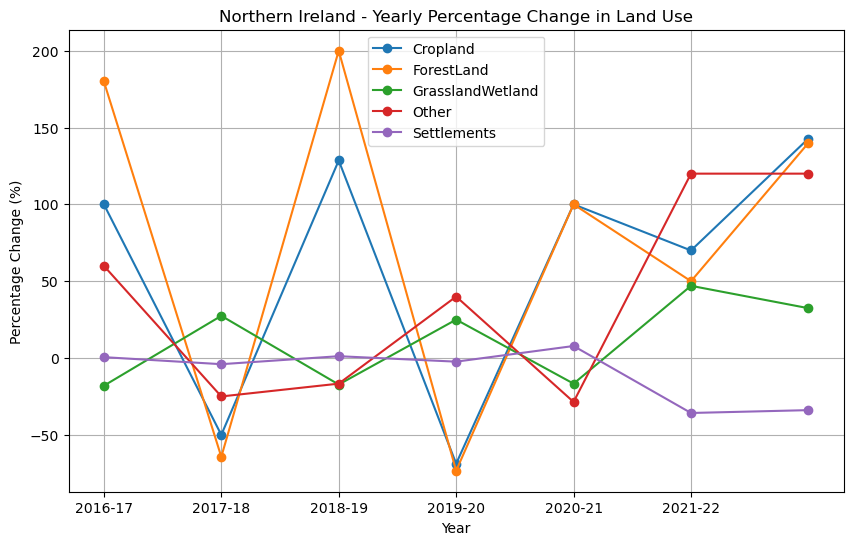

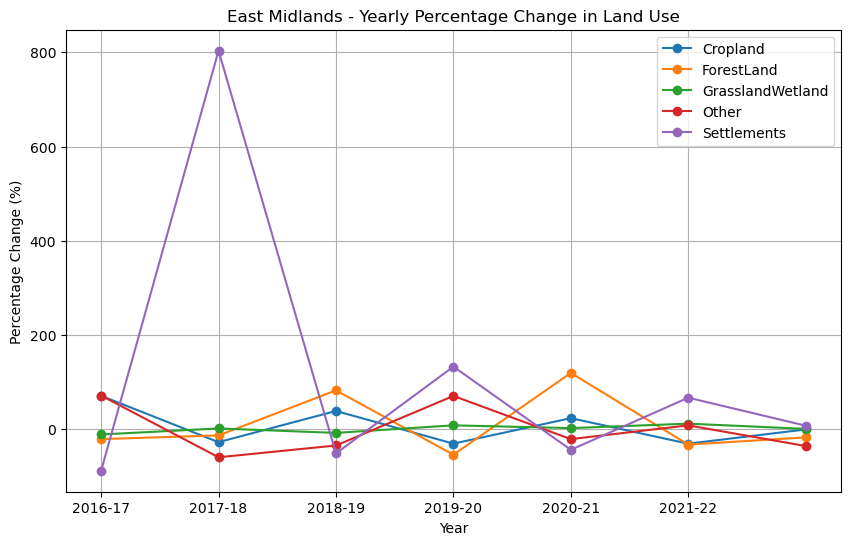

In [69]:
region_list = list(set(pc_change_pivot_region['Region'].to_list())) # get regions in list

for i in region_list:
    region_subset = pc_change_pivot_region[pc_change_pivot_region['Region'] == i] # filters to authority
    plt.figure(figsize=(10, 6))
    for category in region_subset['LULUCF_category'].unique():
        subset = region_subset[region_subset['LULUCF_category'] == category]
        plt.plot(subset.columns[2:], subset.iloc[0, 2:], marker='o', label=category)

    plt.xlabel("Year")
    plt.xticks(ticks=[0, 1, 2, 3, 4, 5], labels=['2016-17', '2017-18', '2018-19', '2019-20', '2020-21', '2021-22'])
    plt.ylabel('Percentage Change (%)')
    plt.title(f'{i} - Yearly Percentage Change in Land Use')
    plt.legend()
    plt.grid(True)
    plt.show()

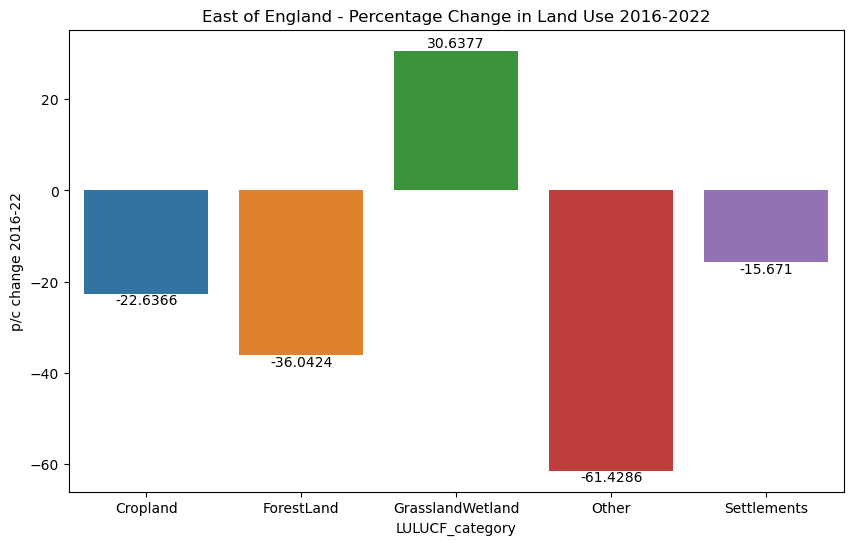

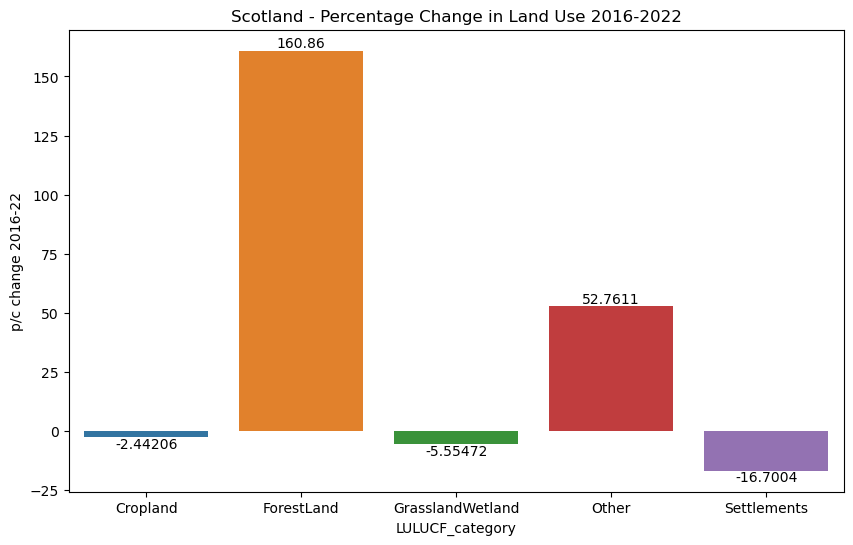

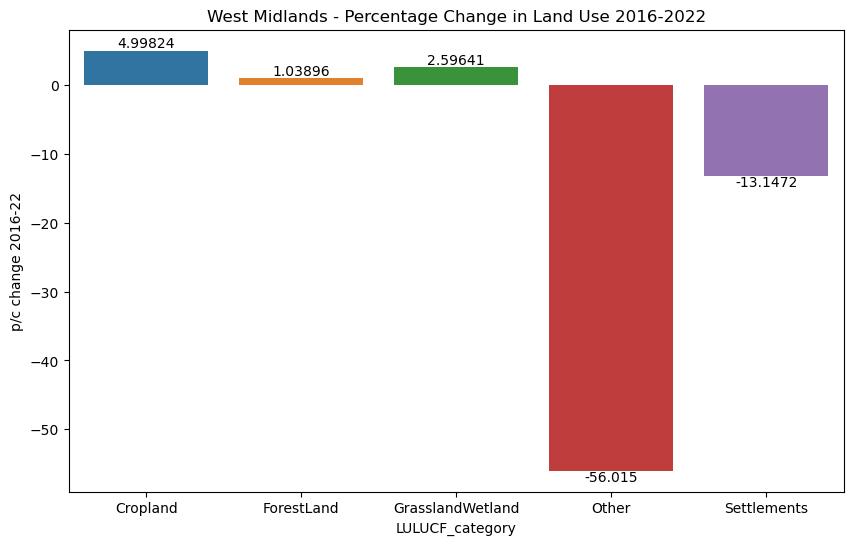

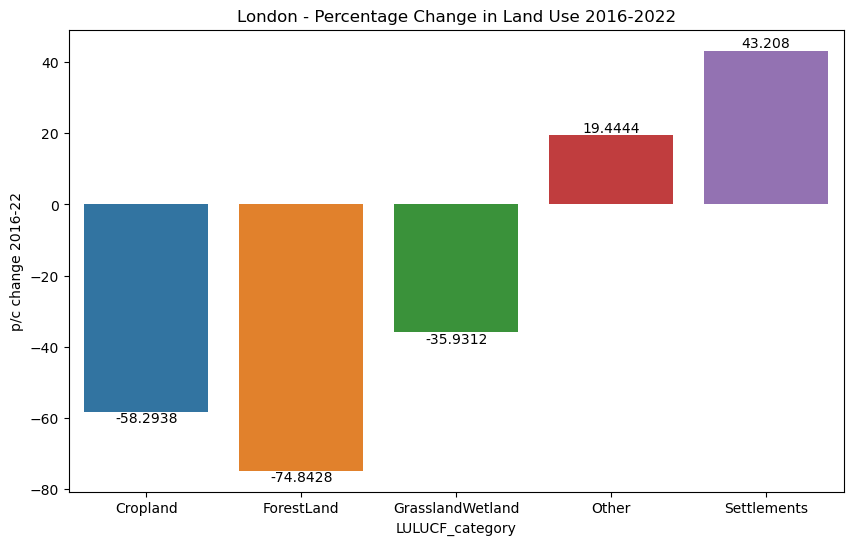

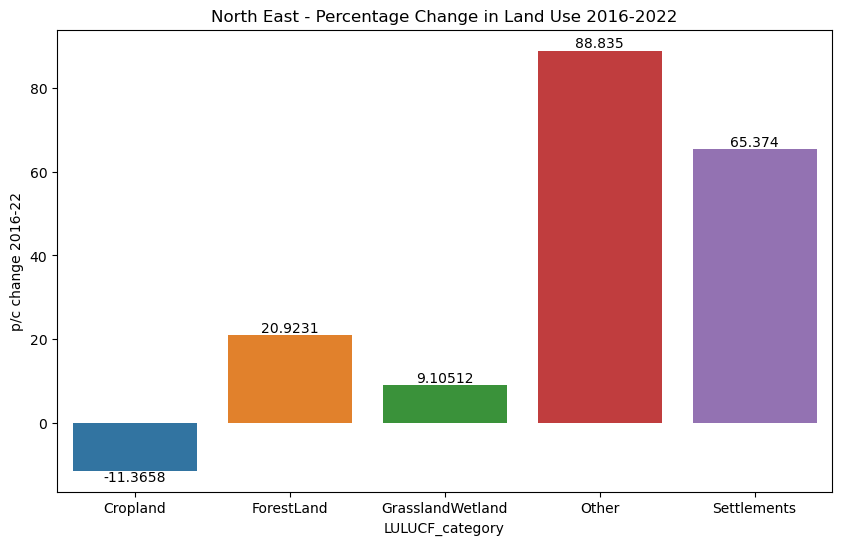

...

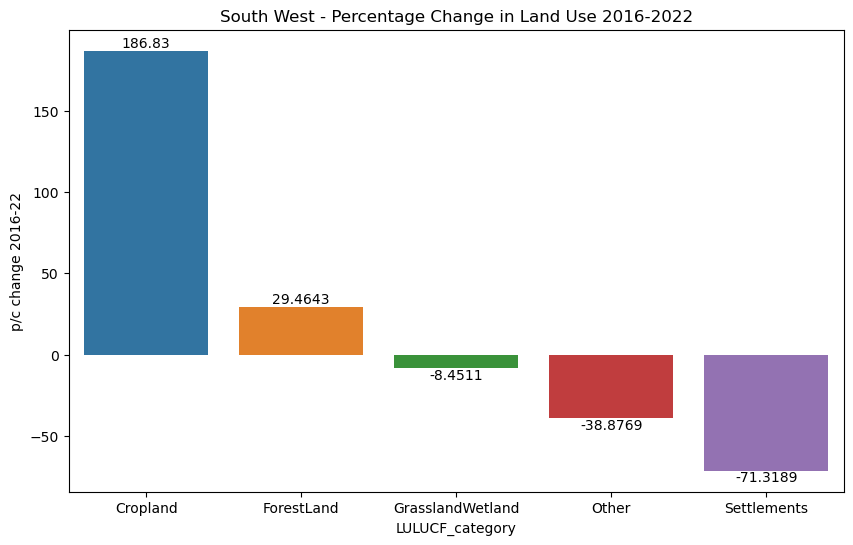

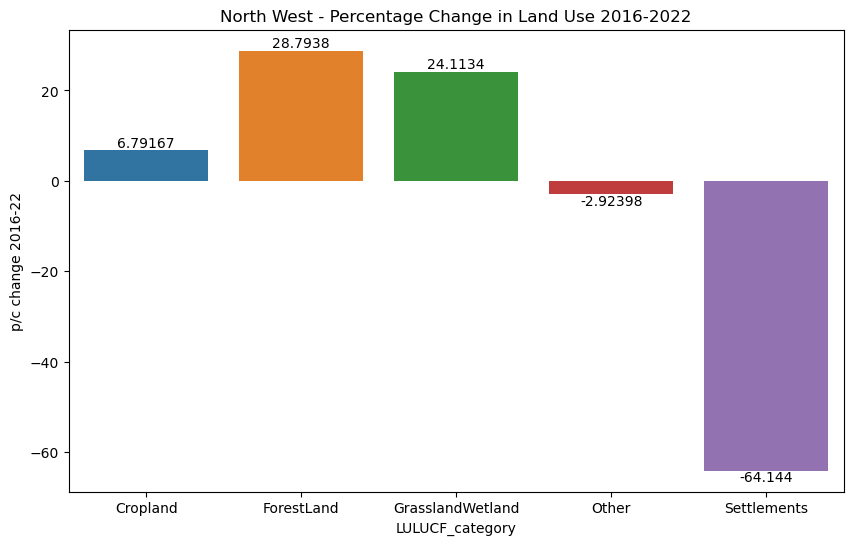

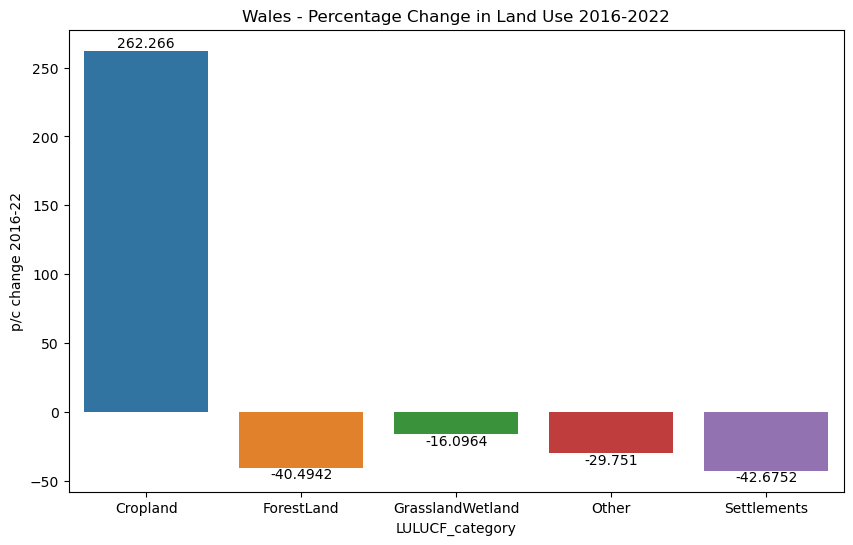

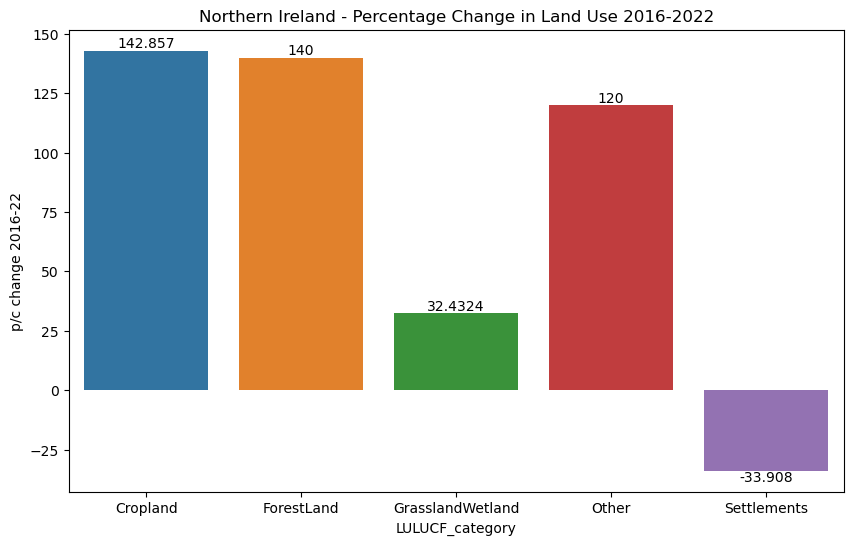

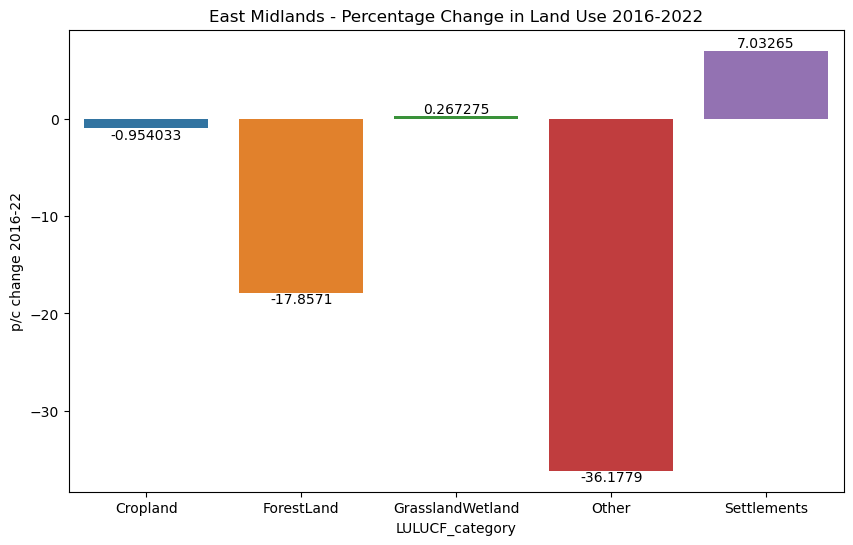

In [70]:

for i in region_list:
    region_subset = pc_change_pivot_region[pc_change_pivot_region['Region'] == i] # filters to authority
    plt.figure(figsize=(10, 6))
    plt.title(f'{i} - Percentage Change in Land Use 2016-2022')
    ax = sns.barplot(region_subset, x='LULUCF_category', y="p/c change 2016-22", errorbar=None)
    ax.bar_label(ax.containers[0], fontsize=10);

## Change by Urban/rural

In [71]:
# pivot - makes rows LULUCF categories and cols years
pc_change_pivot_urban_rural = land_use_ghg_df_longform.pivot_table(index=['rural/urban','LULUCF_category'],
                                                            columns='year',
                                                            values='LandUse',
                                                            aggfunc='sum').reset_index()


pc_change_pivot_urban_rural

year,rural/urban,LULUCF_category,2016,2017,2018,2019,2020,2021,2022
0,Rural,Cropland,28576.1536,28695.3472,13936.2304,26498.6624,27972.8128,29406.8224,29835.2640
1,Rural,ForestLand,2381.4144,2492.0064,2629.6320,6112.4608,2451.4560,4215.1936,4025.5488
2,Rural,GrasslandWetland,59745.4848,60731.8016,70334.0544,56802.0992,56577.6384,54921.6256,55604.8384
3,Rural,Other,1527.3984,1733.0176,1663.3856,1591.2960,1390.1824,1707.6224,1382.8096
4,Rural,Settlements,4186.1120,1674.4448,6291.8656,3047.0144,5035.6224,3176.4480,2580.4800
5,Urban,Cropland,13572.0960,20421.8368,14267.1872,21251.6864,13961.2160,15190.4256,13962.4448
6,Urban,ForestLand,1233.3056,1840.7424,916.2752,1615.4624,715.1616,1675.6736,1145.6512
7,Urban,GrasslandWetland,46691.1232,46431.4368,43368.4480,44543.1808,45343.9488,47490.6624,48830.4640
8,Urban,Other,928.9728,934.2976,1068.6464,1126.8096,1077.2480,1210.7776,960.9216
9,Urban,Settlements,14446.5920,8327.9872,18810.8800,10704.8960,18768.6912,14299.1360,14968.8320


In [72]:
# calculate percentage changes between years and final column from start to end

pc_change_pivot_urban_rural['p/c change 2016-17'] = ((pc_change_pivot_urban_rural[2017]-pc_change_pivot_urban_rural[2016])/
                                              pc_change_pivot_urban_rural[2016]*100)

pc_change_pivot_urban_rural['p/c change 2017-18'] = ((pc_change_pivot_urban_rural[2018]-pc_change_pivot_urban_rural[2017])/
                                              pc_change_pivot_urban_rural[2017]*100)

pc_change_pivot_urban_rural['p/c change 2018-19'] = ((pc_change_pivot_urban_rural[2019]-pc_change_pivot_urban_rural[2018])/
                                              pc_change_pivot_urban_rural[2018]*100)

pc_change_pivot_urban_rural['p/c change 2019-20'] = ((pc_change_pivot_urban_rural[2020]-pc_change_pivot_urban_rural[2019])/
                                              pc_change_pivot_urban_rural[2019]*100)

pc_change_pivot_urban_rural['p/c change 2020-21'] = ((pc_change_pivot_urban_rural[2021]-pc_change_pivot_urban_rural[2020])/
                                              pc_change_pivot_urban_rural[2020]*100)

pc_change_pivot_urban_rural['p/c change 2021-22'] = ((pc_change_pivot_urban_rural[2022]-pc_change_pivot_urban_rural[2021])/
                                              pc_change_pivot_urban_rural[2021]*100)

pc_change_pivot_urban_rural['p/c change 2016-22'] = ((pc_change_pivot_urban_rural[2022]-pc_change_pivot_urban_rural[2016])/
                                              pc_change_pivot_urban_rural[2016]*100)

pc_change_pivot_urban_rural = pc_change_pivot_urban_rural.drop(columns = [2016,2017,2018,2019,2020,2021,2022])

In [73]:
pc_change_pivot_urban_rural

year,rural/urban,LULUCF_category,p/c change 2016-17,p/c change 2017-18,p/c change 2018-19,p/c change 2019-20,p/c change 2020-21,p/c change 2021-22,p/c change 2016-22
0,Rural,Cropland,0.417109,-51.433832,90.142253,5.563112,5.126440,1.456946,4.406158
1,Rural,ForestLand,4.643963,5.522682,132.445483,-59.894123,71.946533,-4.499077,69.040248
2,Rural,GrasslandWetland,1.650864,15.810914,-19.239549,-0.395163,-2.926974,1.243978,-6.930476
3,Rural,Other,13.462054,-4.017963,-4.333908,-12.638353,22.834414,-19.021348,-9.466345
4,Rural,Settlements,-60.000000,275.758317,-51.572163,65.264148,-36.920449,-18.762089,-38.356164
5,Urban,Cropland,50.469292,-30.137591,48.954984,-34.305374,8.804459,-8.083913,2.876113
6,Urban,ForestLand,49.252740,-50.222519,76.307555,-55.730223,134.306987,-31.630408,-7.107273
7,Urban,GrasslandWetland,-0.556179,-6.596800,2.708727,1.797734,4.734289,2.821190,4.581900
8,Urban,Other,0.573192,14.379658,5.442698,-4.398401,12.395437,-20.635995,3.439153
9,Urban,Settlements,-42.353275,125.875467,-43.091998,75.328104,-23.813889,4.683472,3.614970


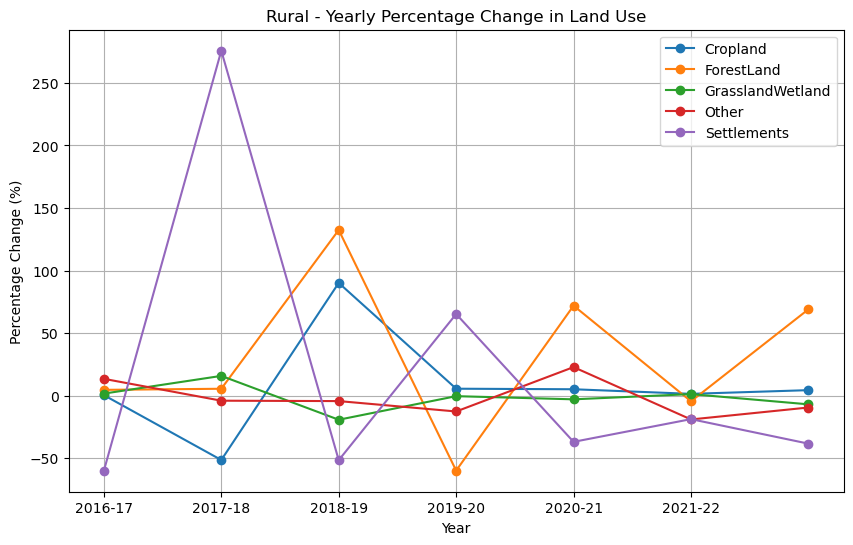

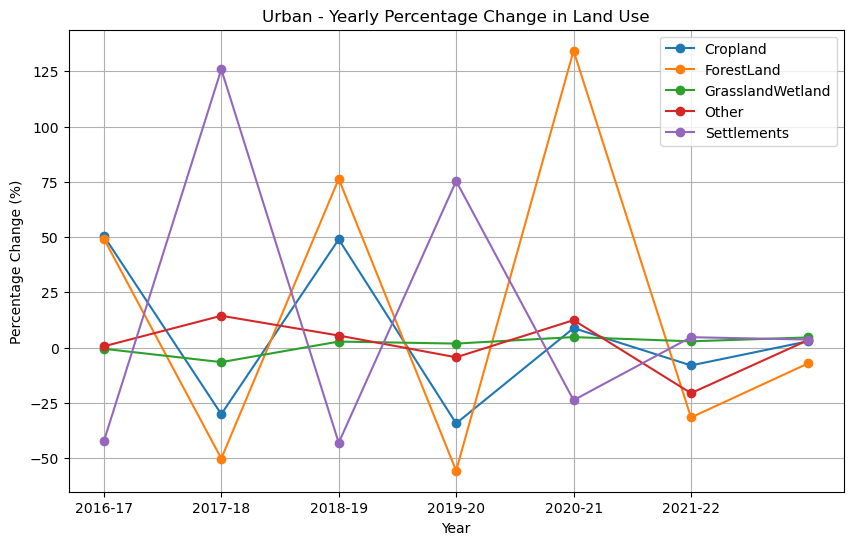

In [74]:
rural_urban_list = ['Rural','Urban']

for i in rural_urban_list:
    rural_urban_subset = pc_change_pivot_urban_rural[pc_change_pivot_urban_rural['rural/urban'] == i] # filters to authority
    plt.figure(figsize=(10, 6))
    for category in rural_urban_subset['LULUCF_category'].unique():
        subset = rural_urban_subset[rural_urban_subset['LULUCF_category'] == category]
        plt.plot(subset.columns[2:], subset.iloc[0, 2:], marker='o', label=category)

    plt.xlabel("Year")
    plt.xticks(ticks=[0, 1, 2, 3, 4, 5], labels=['2016-17', '2017-18', '2018-19', '2019-20', '2020-21', '2021-22'])
    plt.ylabel('Percentage Change (%)')
    plt.title(f'{i} - Yearly Percentage Change in Land Use')
    plt.legend()
    plt.grid(True)
    plt.show()

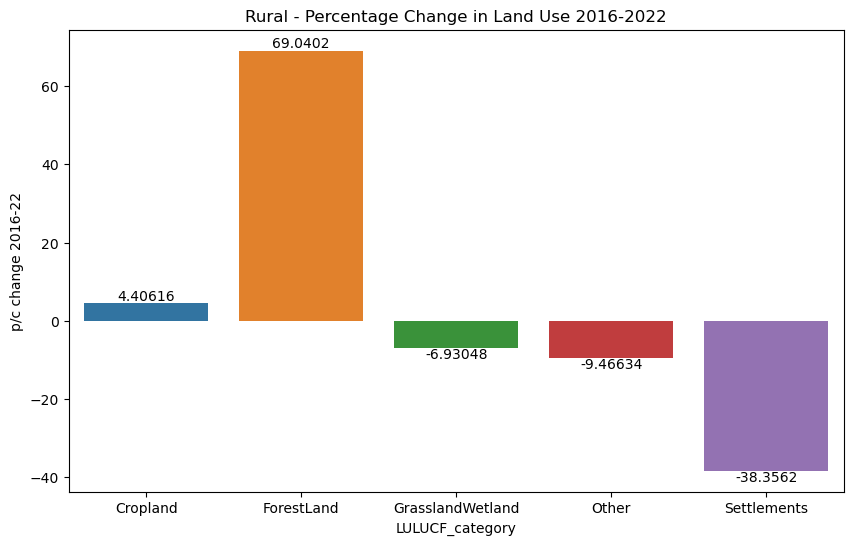

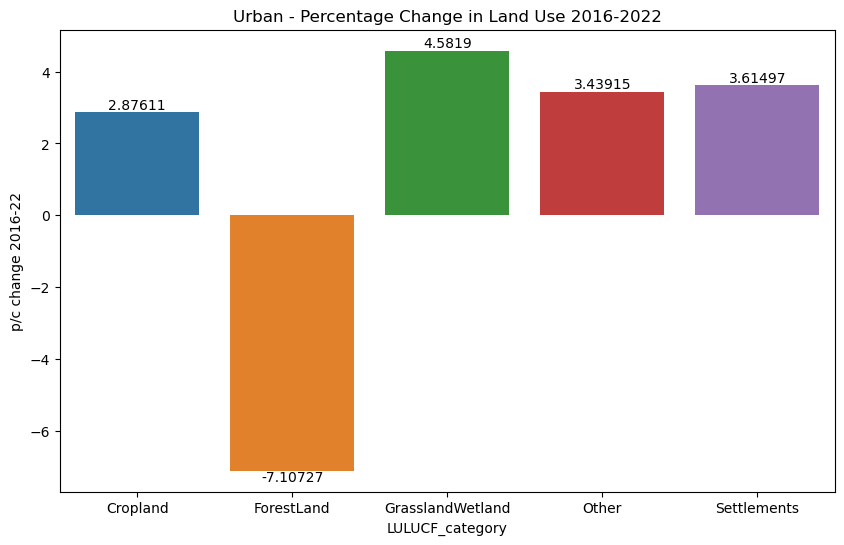

In [75]:

for i in rural_urban_list:
    rural_urban_subset = pc_change_pivot_urban_rural[pc_change_pivot_urban_rural['rural/urban'] == i] # filters to authority
    plt.figure(figsize=(10, 6))
    plt.title(f'{i} - Percentage Change in Land Use 2016-2022')
    ax = sns.barplot(rural_urban_subset, x='LULUCF_category', y="p/c change 2016-22", errorbar=None)
    ax.bar_label(ax.containers[0], fontsize=10);

# Results for Research Q1

### What are the relationships between land use and LULUCF GHG emissions?

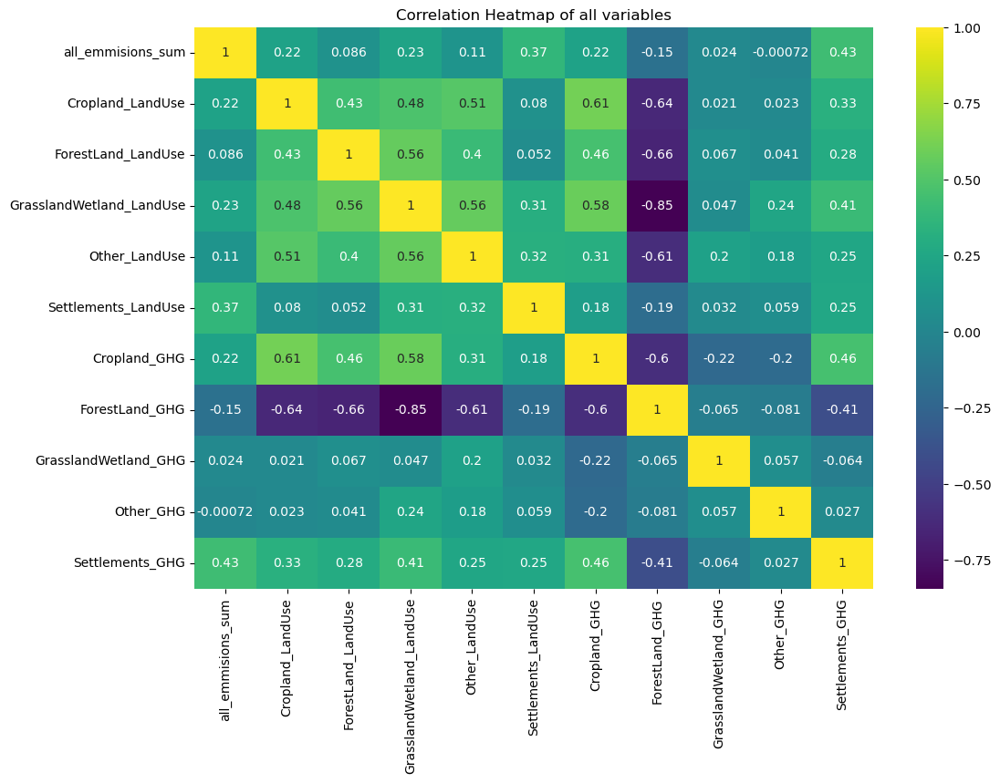

In [76]:
# heat map of all cols
# drop cols I dont want to include first
heatmap_df = land_use_ghg_df.drop(columns = ['local_authority','year','total_pixels','total_sqkm',
                                            'Region','Area (km2)','Mid-year Population (thousands)', 'rural/urban'])
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_df.corr(),annot=True,cmap='viridis')
plt.title("Correlation Heatmap of all variables")
plt.show()

In [77]:
heatmap_df.corr()

,all_emmisions_sum,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG
all_emmisions_sum,1.000000,0.216651,0.086068,0.227598,0.106787,0.370174,0.219711,-0.153503,0.024295,-0.000718,0.428000
Cropland_LandUse,0.216651,1.000000,0.433319,0.481082,0.510407,0.079760,0.607498,-0.639197,0.021110,0.023206,0.325786
ForestLand_LandUse,0.086068,0.433319,1.000000,0.562430,0.403361,0.051615,0.457668,-0.661659,0.066765,0.041171,0.283543
GrasslandWetland_LandUse,0.227598,0.481082,0.562430,1.000000,0.563098,0.310833,0.577996,-0.845027,0.046791,0.237624,0.407017
Other_LandUse,0.106787,0.510407,0.403361,0.563098,1.000000,0.319364,0.310806,-0.609974,0.203962,0.176175,0.249460
Settlements_LandUse,0.370174,0.079760,0.051615,0.310833,0.319364,1.000000,0.181135,-0.190164,0.032404,0.059268,0.252354
Cropland_GHG,0.219711,0.607498,0.457668,0.577996,0.310806,0.181135,1.000000,-0.603774,-0.219536,-0.204824,0.457037
ForestLand_GHG,-0.153503,-0.639197,-0.661659,-0.845027,-0.609974,-0.190164,-0.603774,1.000000,-0.065235,-0.081065,-0.408519
GrasslandWetland_GHG,0.024295,0.021110,0.066765,0.046791,0.203962,0.032404,-0.219536,-0.065235,1.000000,0.056825,-0.063806
Other_GHG,-0.000718,0.023206,0.041171,0.237624,0.176175,0.059268,-0.204824,-0.081065,0.056825,1.000000,0.027373


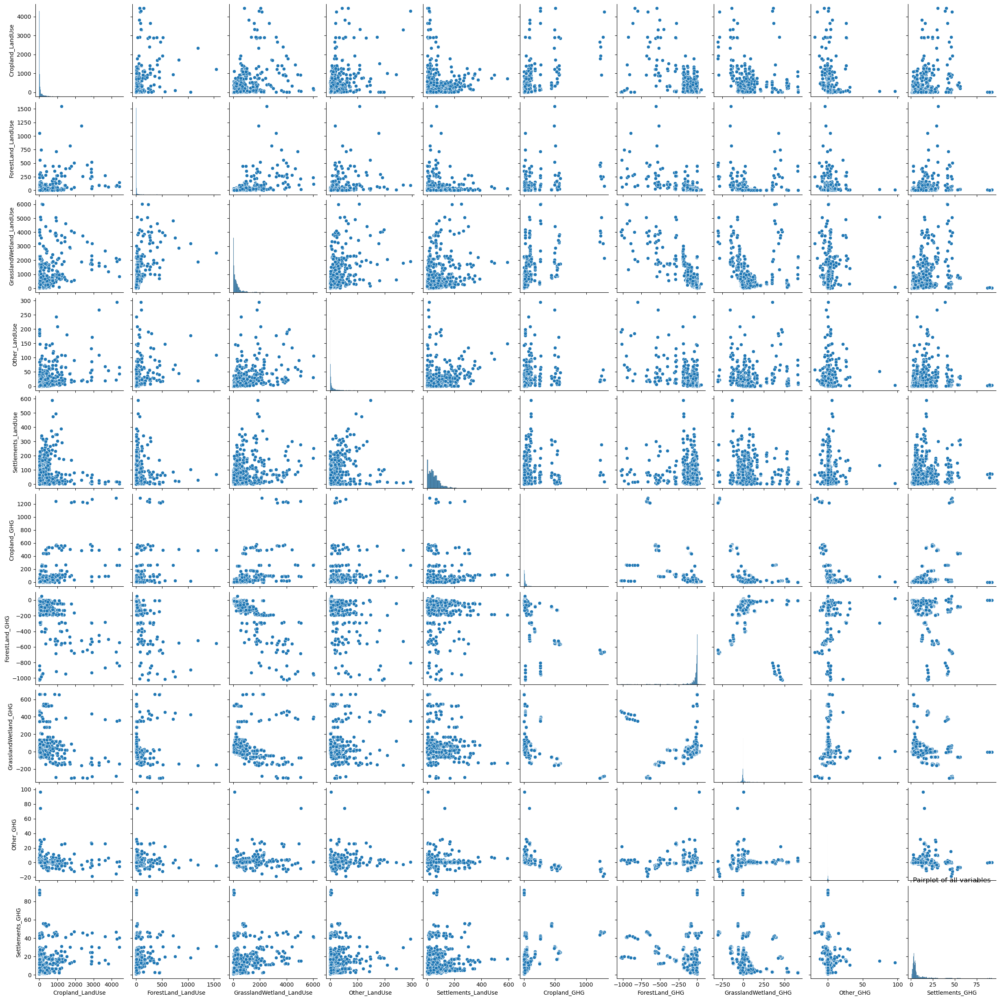

In [78]:
sns.pairplot(land_use_ghg_df[['Cropland_LandUse','ForestLand_LandUse','GrasslandWetland_LandUse',
                              'Other_LandUse','Settlements_LandUse','Cropland_GHG',
                              'ForestLand_GHG','GrasslandWetland_GHG','Other_GHG','Settlements_GHG']])
plt.title("Pairplot of all variables")
plt.show()

## Get correlations

In [79]:
land_use_ghg_df.head()

,local_authority,year,total_pixels,total_sqkm,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG
0,South Ayrshire,2016,12284471,1228.4471,914.043309,Scotland,1234.6853,112.567854,Rural,32.3584,32.7680,1069.0560,28.2624,111.8208,60.800080,-168.406704,22.578893,-0.100247,20.931298
1,Huntingdonshire,2016,9121024,912.1024,1921.331100,East of England,912.5461,177.361733,Urban,342.8352,8.1920,368.6400,27.4432,204.8000,30.817585,-22.369041,285.969690,0.276267,6.148401
2,Tewkesbury,2016,4102733,410.2733,893.603856,South West,414.9760,88.153766,Urban,51.2000,1.6384,327.2704,3.6864,63.8976,13.104769,-22.629027,-14.844106,0.324541,3.407730
3,West Lancashire,2016,3427363,342.7363,1033.234330,North West,381.3803,114.563882,Urban,70.4512,2.8672,224.0512,2.8672,67.5840,8.864708,-11.068474,213.030559,0.067400,3.649448
4,Darlington,2016,1976753,197.6753,667.990971,North East,197.4758,106.925688,Urban,52.0192,0.4096,110.1824,2.4576,48.3328,8.121586,-5.683302,-4.716493,0.112159,3.009305


In [80]:
heatmap_df.corr()

,all_emmisions_sum,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG
all_emmisions_sum,1.000000,0.216651,0.086068,0.227598,0.106787,0.370174,0.219711,-0.153503,0.024295,-0.000718,0.428000
Cropland_LandUse,0.216651,1.000000,0.433319,0.481082,0.510407,0.079760,0.607498,-0.639197,0.021110,0.023206,0.325786
ForestLand_LandUse,0.086068,0.433319,1.000000,0.562430,0.403361,0.051615,0.457668,-0.661659,0.066765,0.041171,0.283543
GrasslandWetland_LandUse,0.227598,0.481082,0.562430,1.000000,0.563098,0.310833,0.577996,-0.845027,0.046791,0.237624,0.407017
Other_LandUse,0.106787,0.510407,0.403361,0.563098,1.000000,0.319364,0.310806,-0.609974,0.203962,0.176175,0.249460
Settlements_LandUse,0.370174,0.079760,0.051615,0.310833,0.319364,1.000000,0.181135,-0.190164,0.032404,0.059268,0.252354
Cropland_GHG,0.219711,0.607498,0.457668,0.577996,0.310806,0.181135,1.000000,-0.603774,-0.219536,-0.204824,0.457037
ForestLand_GHG,-0.153503,-0.639197,-0.661659,-0.845027,-0.609974,-0.190164,-0.603774,1.000000,-0.065235,-0.081065,-0.408519
GrasslandWetland_GHG,0.024295,0.021110,0.066765,0.046791,0.203962,0.032404,-0.219536,-0.065235,1.000000,0.056825,-0.063806
Other_GHG,-0.000718,0.023206,0.041171,0.237624,0.176175,0.059268,-0.204824,-0.081065,0.056825,1.000000,0.027373


In [81]:
x = land_use_ghg_df['Cropland_LandUse']
y = land_use_ghg_df['Cropland_GHG']

x.corr(y) 

0.6074979270495859

## Regression plots for each category

This compares each LULUCF class - it's land use class with its repective GHG emissions 

In [82]:
land_use_ghg_df_longform

,local_authority,year,Region,LULUCF_category,rural/urban,GHG,LandUse
0,Aberdeen City,2016,Scotland,Cropland,Urban,23.444301,38.0928
1,Aberdeen City,2016,Scotland,ForestLand,Urban,-8.793797,0.8192
2,Aberdeen City,2016,Scotland,GrasslandWetland,Urban,-8.672550,101.9904
3,Aberdeen City,2016,Scotland,Other,Urban,-0.195695,2.4576
4,Aberdeen City,2016,Scotland,Settlements,Urban,22.495649,54.0672
...,...,...,...,...,...,...,...
11685,York,2022,Yorkshire and the Humber,Cropland,Urban,9.734717,38.9120
11686,York,2022,Yorkshire and the Humber,ForestLand,Urban,-7.776860,0.4096
11687,York,2022,Yorkshire and the Humber,GrasslandWetland,Urban,22.713738,155.2384
11688,York,2022,Yorkshire and the Humber,Other,Urban,0.309932,1.2288


Cropland
Correlation coefficient: 0.607
p-value: 6.682e-236
The correlation is statistically significant


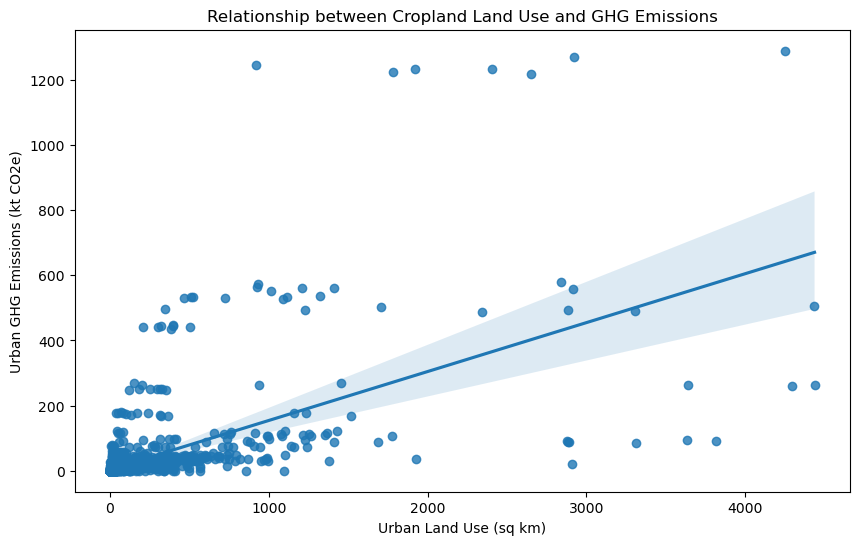

Other
Correlation coefficient: 0.176
p-value: 9.388e-18
The correlation is statistically significant


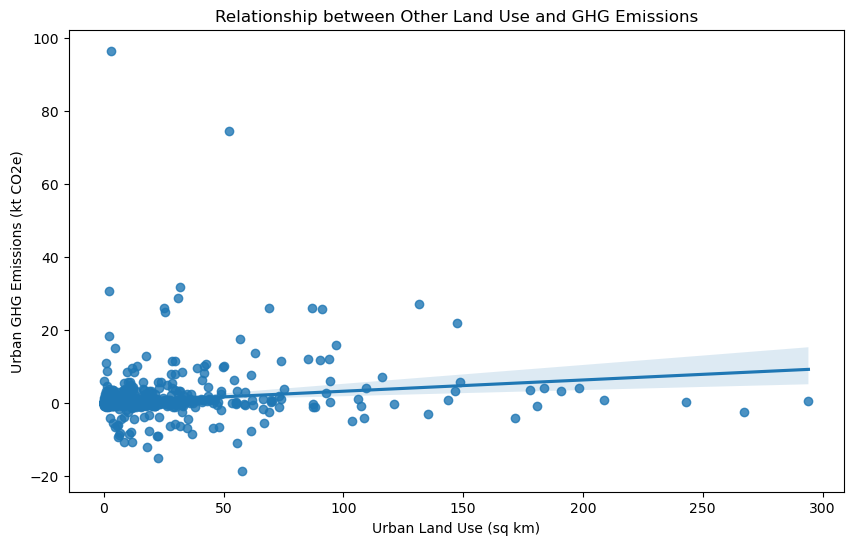

ForestLand
Correlation coefficient: -0.662
p-value: 1.889e-294
The correlation is statistically significant


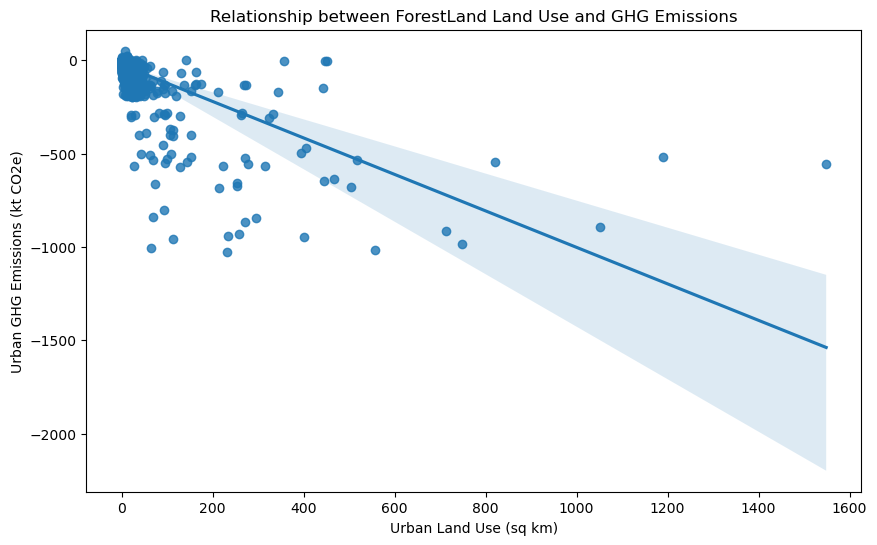

Settlements
Correlation coefficient: 0.252
p-value: 2.725e-35
The correlation is statistically significant


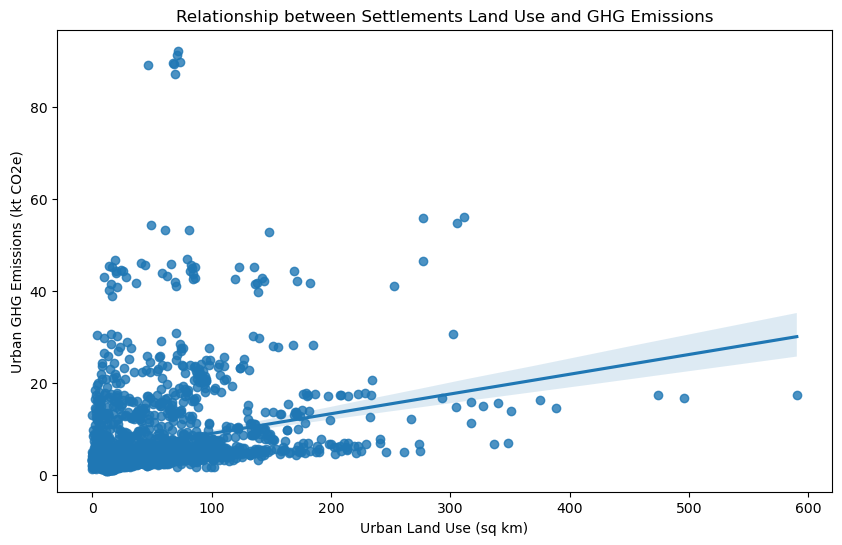

GrasslandWetland
Correlation coefficient: 0.0468
p-value: 2.367e-02
The correlation is statistically significant


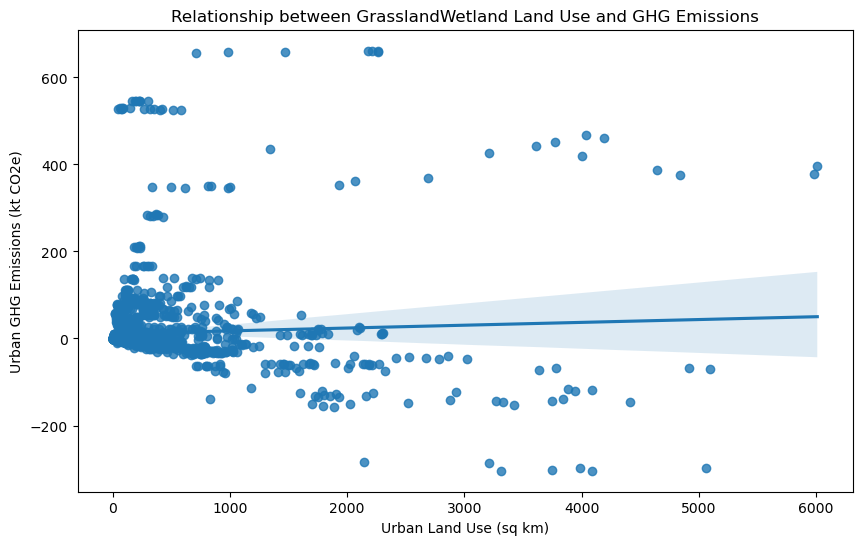

In [83]:

lulucf_cat = set(land_use_ghg_df_longform['LULUCF_category'].to_list())

for j in lulucf_cat:
        
    #filtered_data = land_use_ghg_df[land_use_ghg_df['rural/urban'] == i]
        
    x = land_use_ghg_df[f'{j}_LandUse']
    y = land_use_ghg_df[f'{j}_GHG']
        
    print(j)
    print(f'Correlation coefficient: {x.corr(y):.3}')
    p_value = pearsonr(x, y)[1]
    if p_value < 0.05:
        print(f'p-value: {p_value:.3e}')
        print('The correlation is statistically significant')
    else:
        print(f'p-value: {p_value}')
        print('The correlation is NOT statistically significant')


    #data = filtered_data[filtered_data['LULUCF_category']==j]
    plt.figure(figsize=(10, 6))
    sns.regplot(data=land_use_ghg_df, x=f'{j}_LandUse',y=f'{j}_GHG')
    plt.xlabel(f"{i} Land Use (sq km)")
    plt.ylabel(f"{i} GHG Emissions (kt CO2e)")
    plt.title(f"Relationship between {j} Land Use and GHG Emissions")
    plt.show()

## Plot against opposing categories

relationship between opposing categories. E.g settlements and forest. Settlement and cropland etc

do it for land use only rather then land use vs GHG so I can say an increase in x category causes a decrease in y category

It will show for example:

if settlemetns increase while forest decreases then we are seeing that urbanisation is replacing forests


If Settlements increase while ForestLand decreases → urbanization is replacing forests.
If Cropland declines while Settlements increase → agricultural land loss due to urbanization.
If Grassland/Wetland declines while ForestLand increases → afforestation is occurring at the expense of open land.
If GHG emissions change with land conversion, this supports policy intervention for land conservation or reforestation.


### Everything

Settlements_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.0516
p-value: 1.256e-02
The correlation is statistically significant


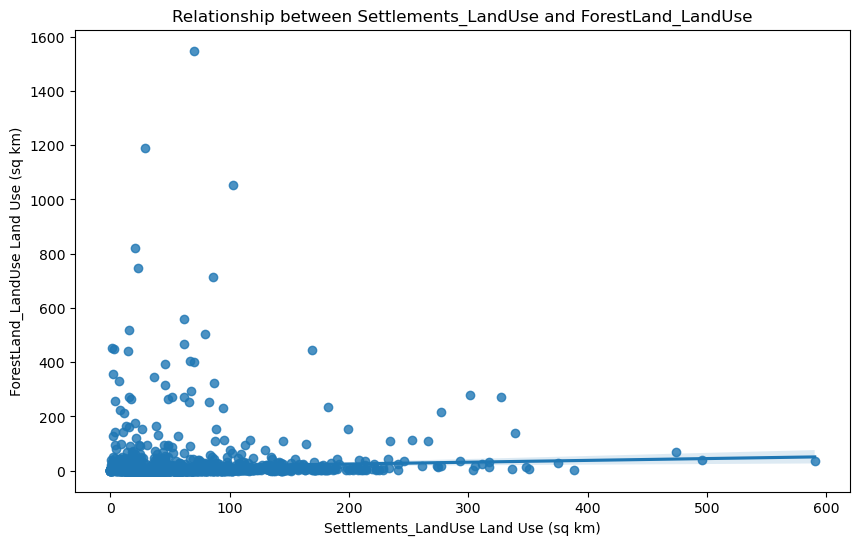

Settlements_LandUse vs Cropland_LandUse
Correlation coefficient: 0.0798
p-value: 1.131e-04
The correlation is statistically significant


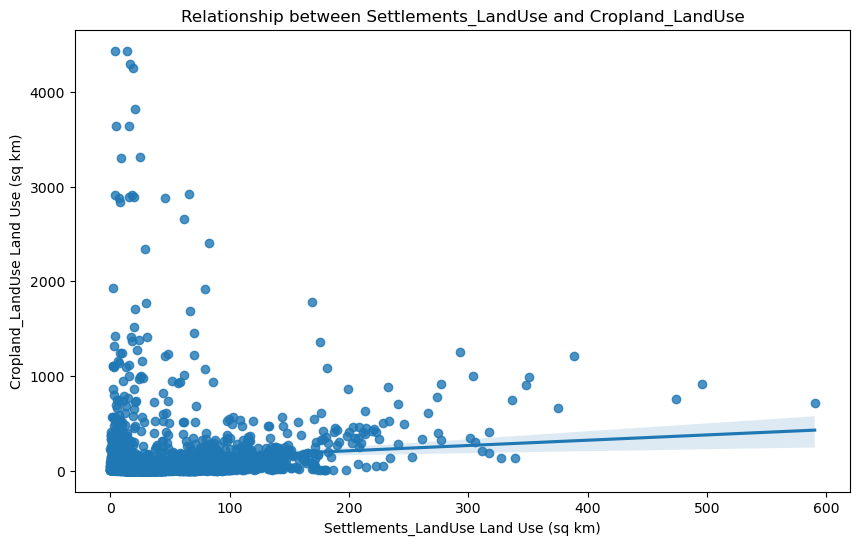

Cropland_LandUse vs GrasslandWetland_LandUse
Correlation coefficient: 0.481
p-value: 1.016e-135
The correlation is statistically significant


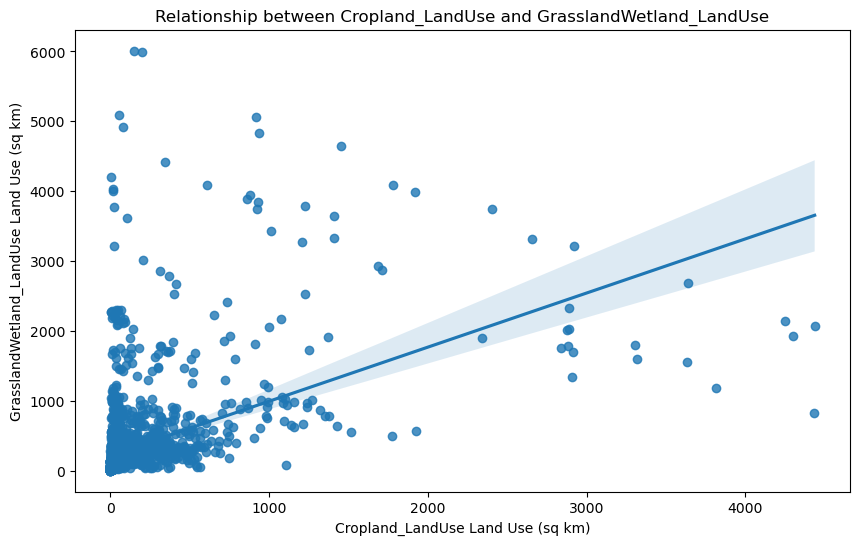

GrasslandWetland_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.562
p-value: 3.716e-195
The correlation is statistically significant


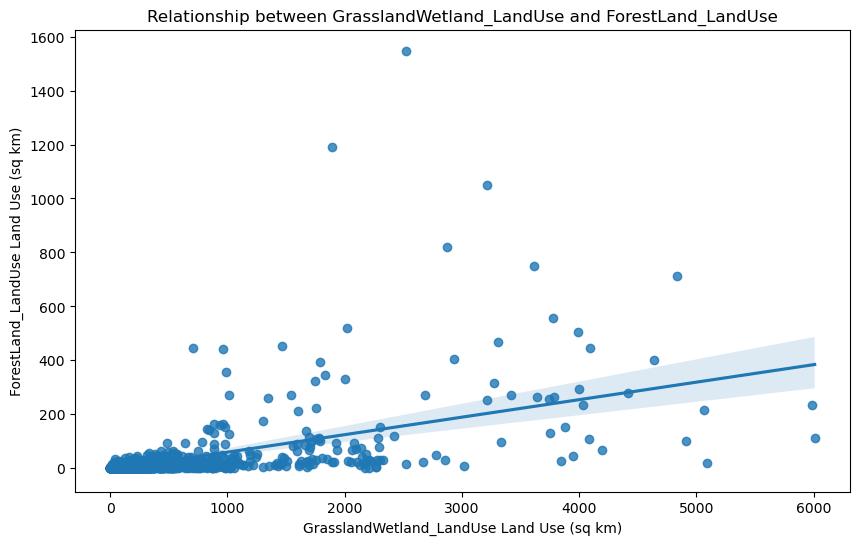

Other_LandUse vs Settlements_LandUse
Correlation coefficient: 0.319
p-value: 1.388e-56
The correlation is statistically significant


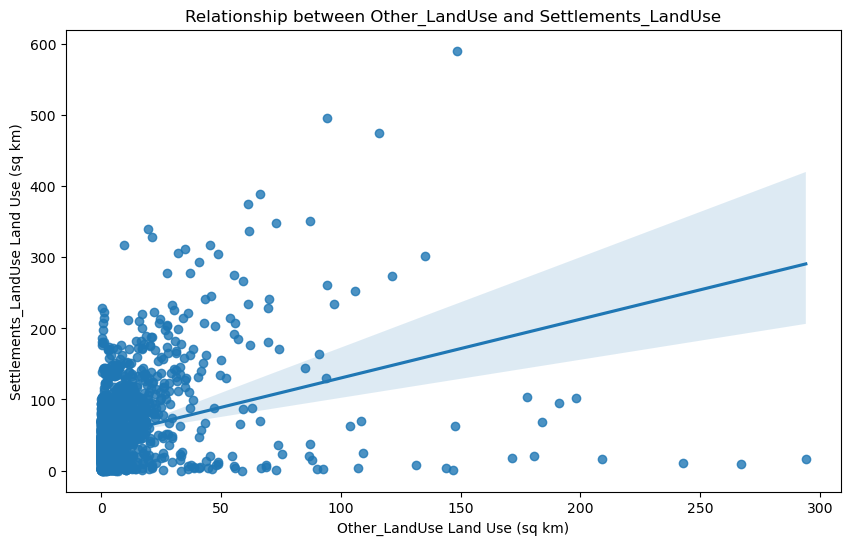

In [84]:
# opposing categories
opposing_cats = [
    ('Settlements_LandUse', 'ForestLand_LandUse'),
    ('Settlements_LandUse', 'Cropland_LandUse'),
    ('Cropland_LandUse', 'GrasslandWetland_LandUse'),
    ('GrasslandWetland_LandUse', 'ForestLand_LandUse'),
    ('Other_LandUse', 'Settlements_LandUse'),
]

for i in opposing_cats:
    x = land_use_ghg_df[i[0]]
    y = land_use_ghg_df[i[1]]
    
    print(f'{i[0]} vs {i[1]}')
    print(f'Correlation coefficient: {x.corr(y):.3}')
    p_value = pearsonr(x, y)[1]
    if p_value < 0.05:
        print(f'p-value: {p_value:.3e}')
        print('The correlation is statistically significant')
    else:
        print(f'p-value: {p_value}')
        print('The correlation is NOT statistically significant')
        
        

    plt.figure(figsize=(10, 6))
    sns.regplot(data=land_use_ghg_df, x=i[0],y=i[1])
    plt.xlabel(f'{i[0]} Land Use (sq km)')
    plt.ylabel(f'{i[1]} Land Use (sq km)')
    plt.title(f'Relationship between {i[0]} and {i[1]}')
    plt.show()

### Per year

2016 - Settlements_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.0479
p-value: 0.38280626233744464
The correlation is NOT statistically significant


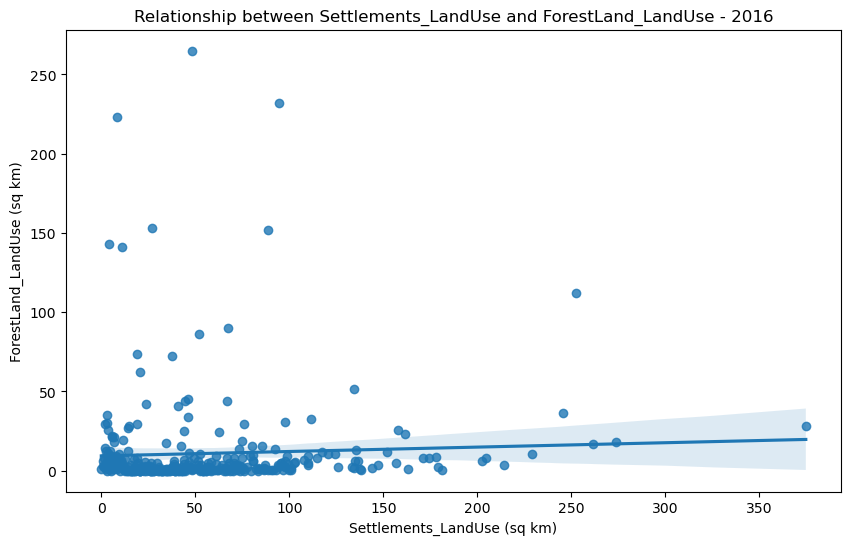

2016 - Settlements_LandUse vs Cropland_LandUse
Correlation coefficient: 0.0191
p-value: 0.7281488967348
The correlation is NOT statistically significant


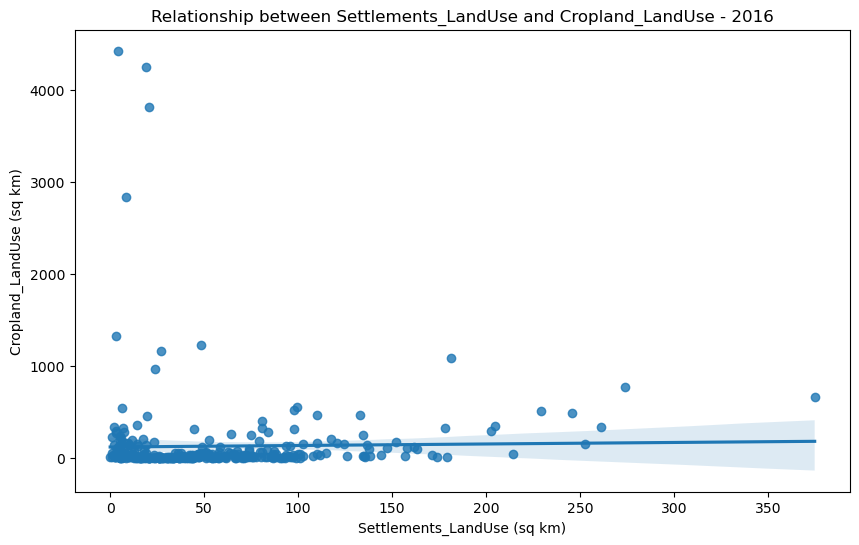

2016 - Cropland_LandUse vs GrasslandWetland_LandUse
Correlation coefficient: 0.32
p-value: 2.126e-09
The correlation is statistically significant


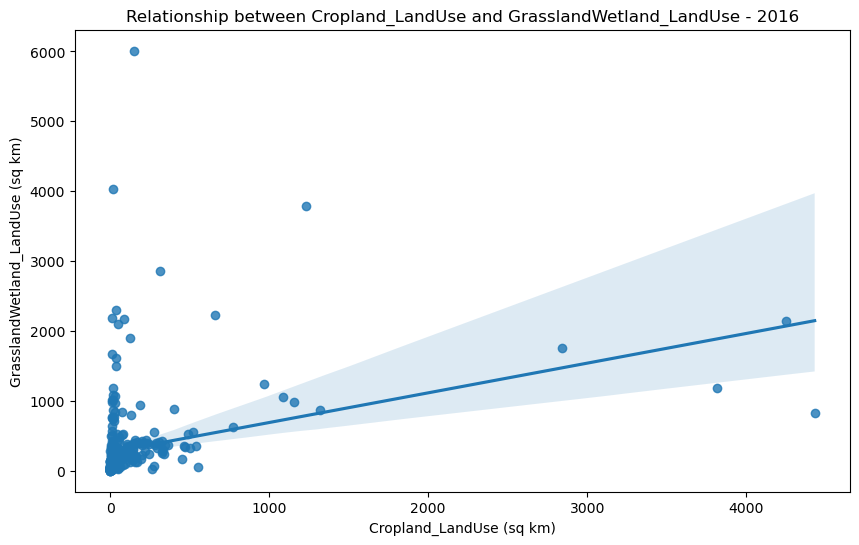

2016 - GrasslandWetland_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.707
p-value: 6.176e-52
The correlation is statistically significant


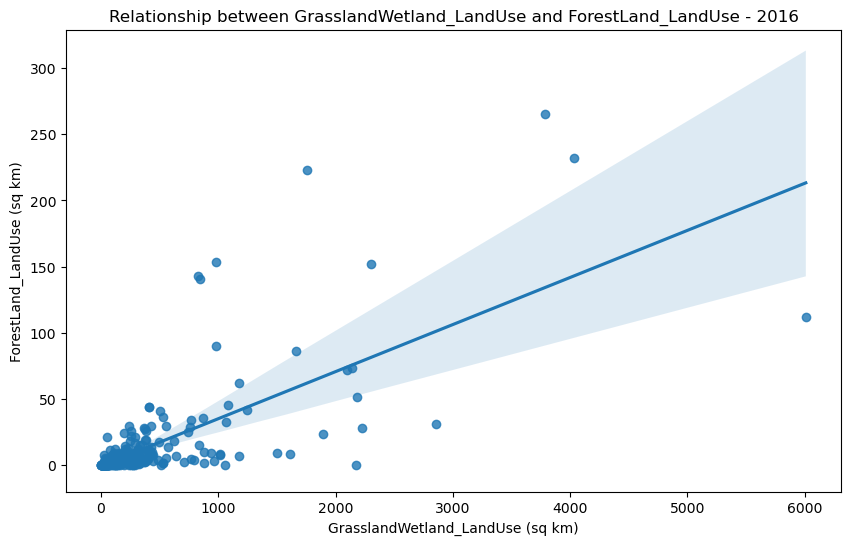

2016 - Other_LandUse vs Settlements_LandUse
Correlation coefficient: 0.514
p-value: 7.052e-24
The correlation is statistically significant


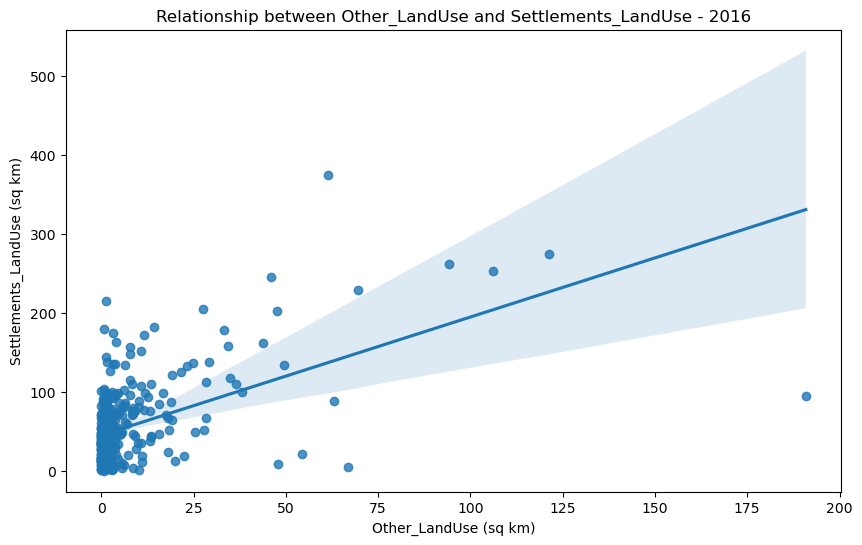

2017 - Settlements_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.182
p-value: 8.395e-04
The correlation is statistically significant


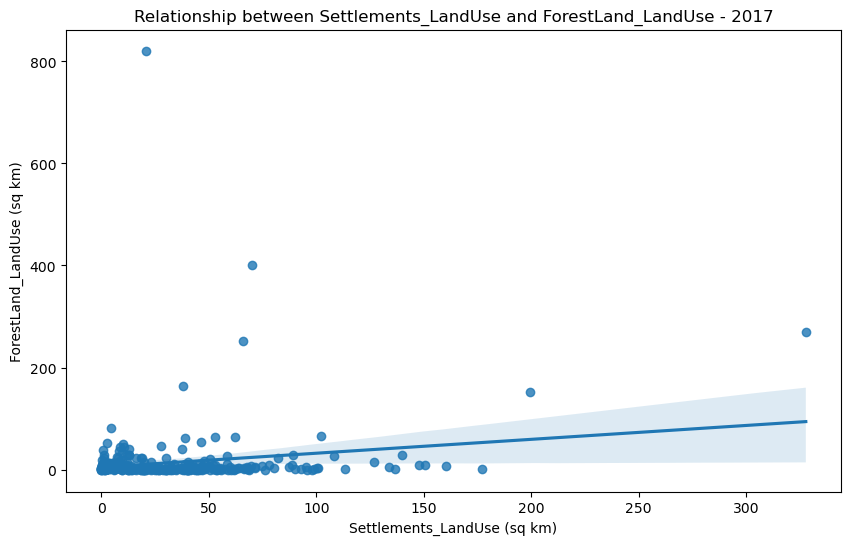

2017 - Settlements_LandUse vs Cropland_LandUse
Correlation coefficient: -0.00922
p-value: 0.8666122673246885
The correlation is NOT statistically significant


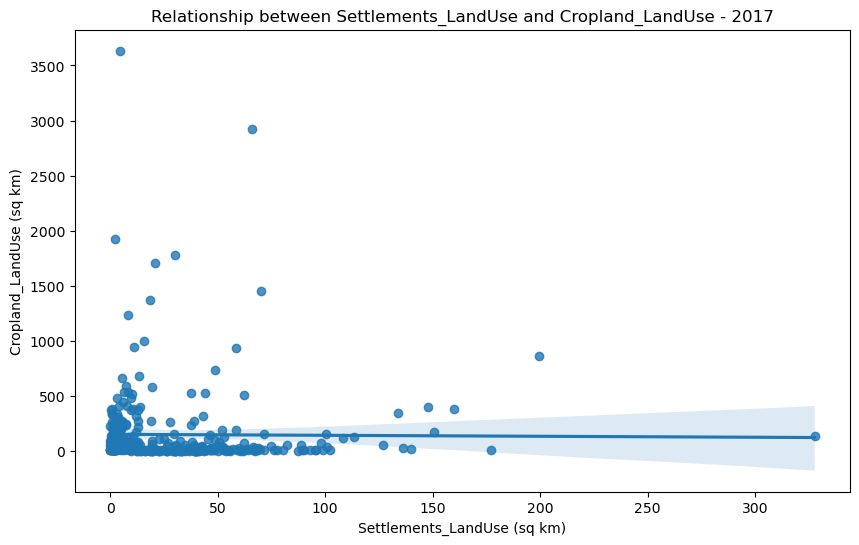

2017 - Cropland_LandUse vs GrasslandWetland_LandUse
Correlation coefficient: 0.544
p-value: 3.609e-27
The correlation is statistically significant


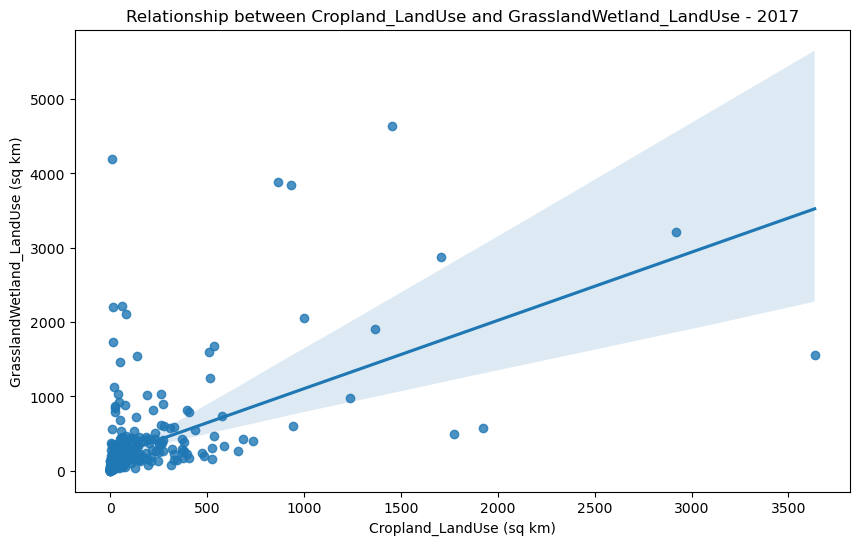

2017 - GrasslandWetland_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.572
p-value: 2.139e-30
The correlation is statistically significant


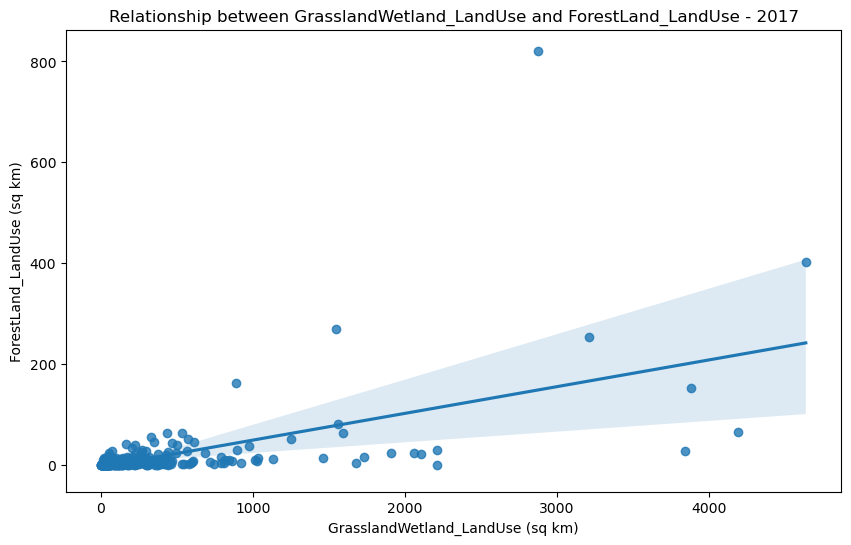

2017 - Other_LandUse vs Settlements_LandUse
Correlation coefficient: 0.0789
p-value: 0.1504156842577336
The correlation is NOT statistically significant


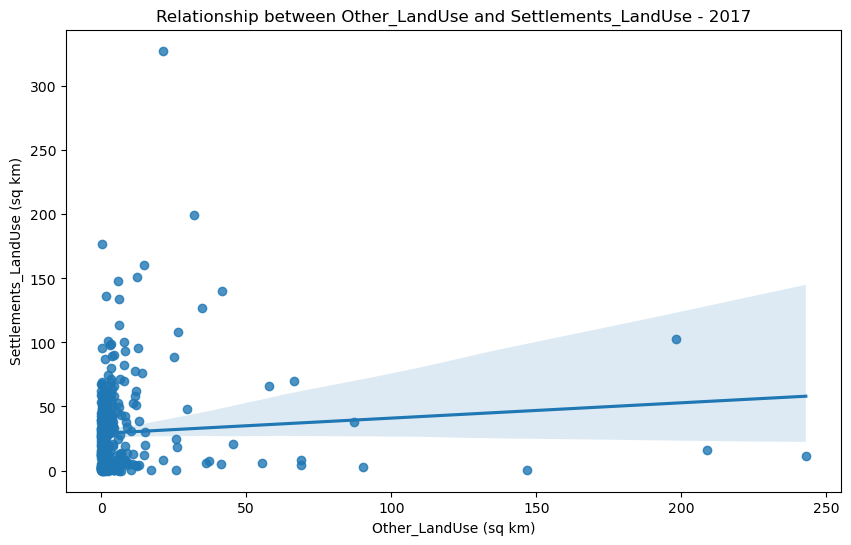

2018 - Settlements_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.281
p-value: 1.720e-07
The correlation is statistically significant


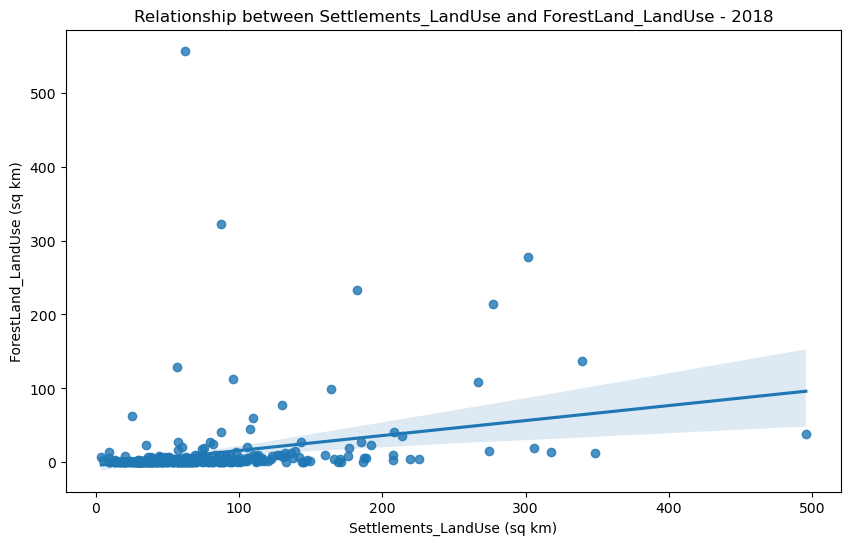

2018 - Settlements_LandUse vs Cropland_LandUse
Correlation coefficient: 0.612
p-value: 9.503e-36
The correlation is statistically significant


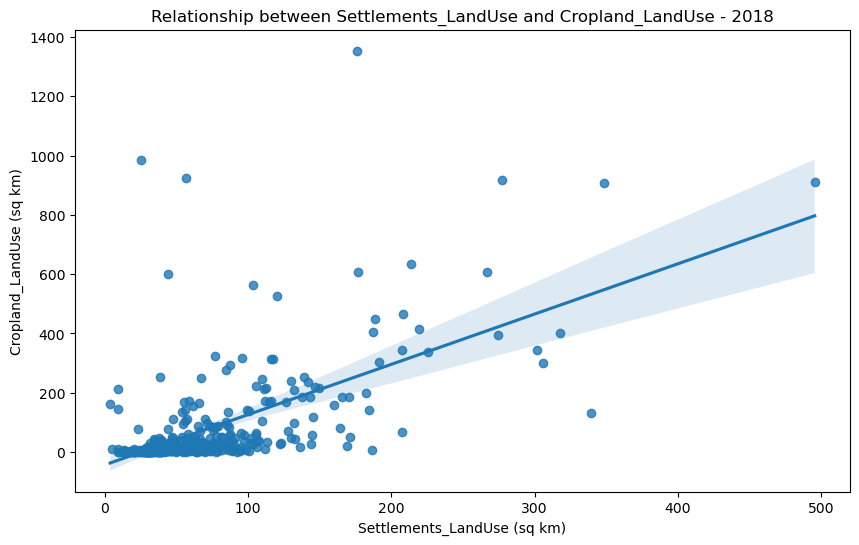

2018 - Cropland_LandUse vs GrasslandWetland_LandUse
Correlation coefficient: 0.431
p-value: 1.523e-16
The correlation is statistically significant


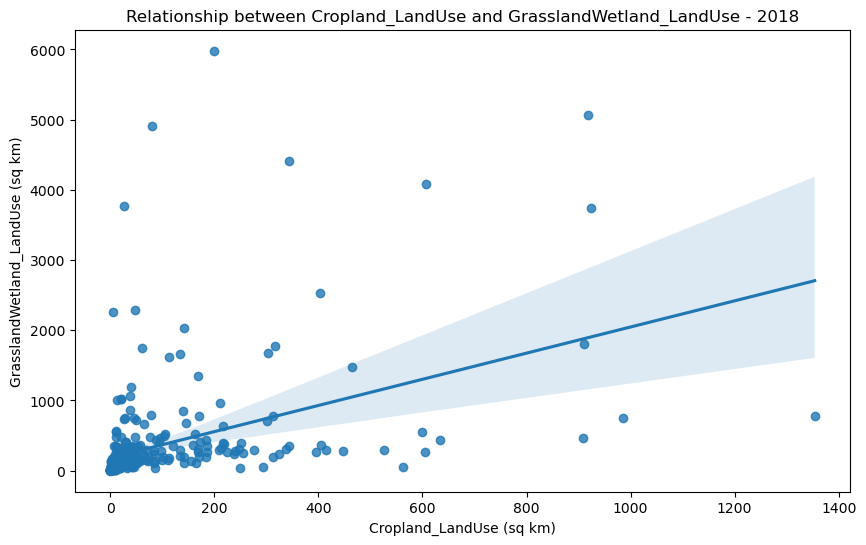

2018 - GrasslandWetland_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.733
p-value: 1.442e-57
The correlation is statistically significant


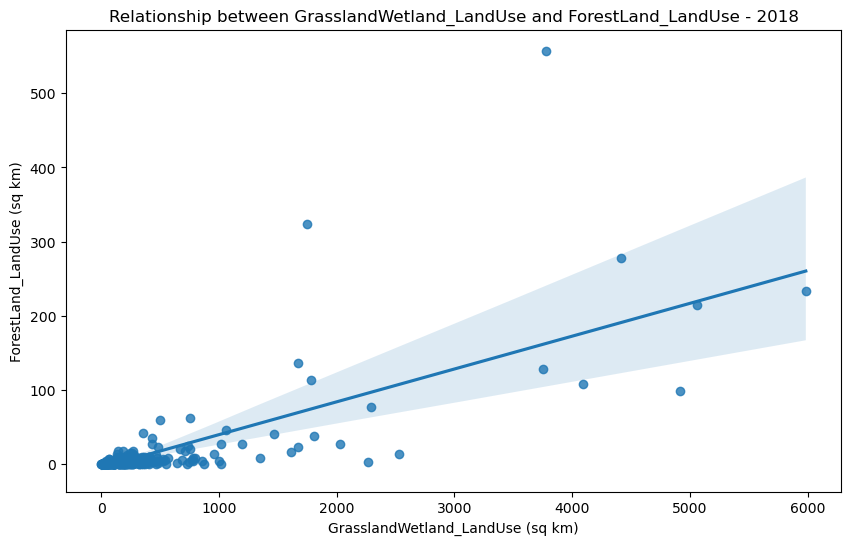

2018 - Other_LandUse vs Settlements_LandUse
Correlation coefficient: 0.621
p-value: 5.603e-37
The correlation is statistically significant


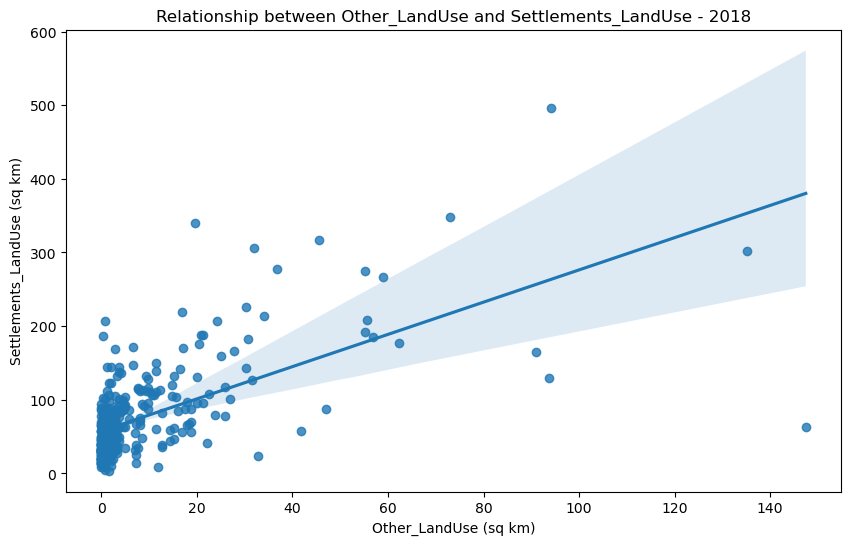

2019 - Settlements_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.0503
p-value: 0.3598987766091045
The correlation is NOT statistically significant


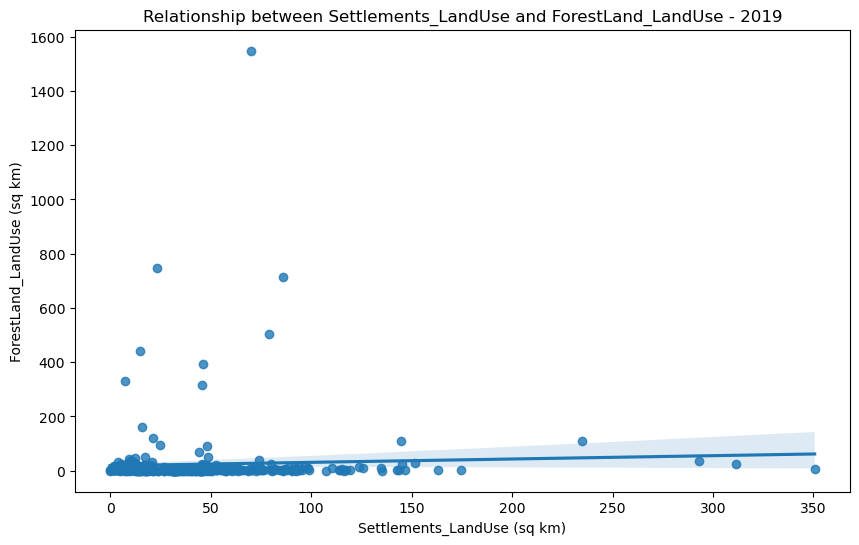

2019 - Settlements_LandUse vs Cropland_LandUse
Correlation coefficient: 0.076
p-value: 0.16564579393151857
The correlation is NOT statistically significant


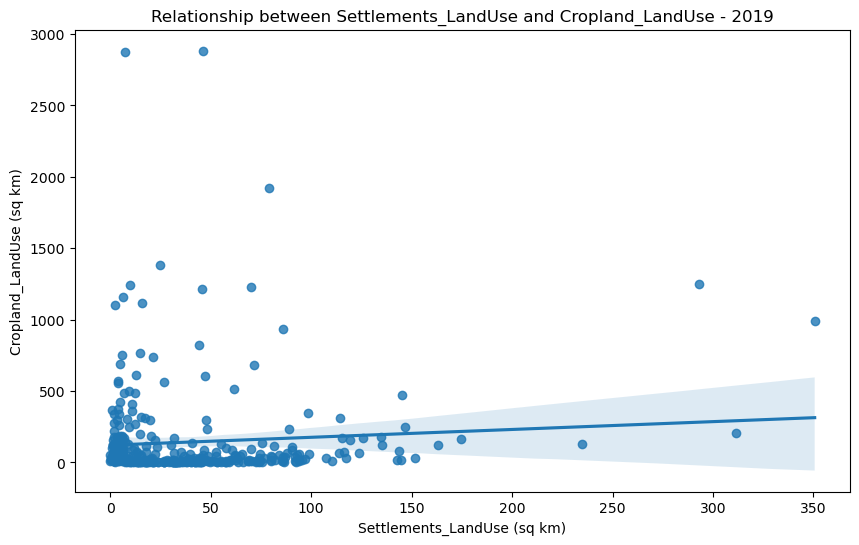

2019 - Cropland_LandUse vs GrasslandWetland_LandUse
Correlation coefficient: 0.563
p-value: 2.526e-29
The correlation is statistically significant


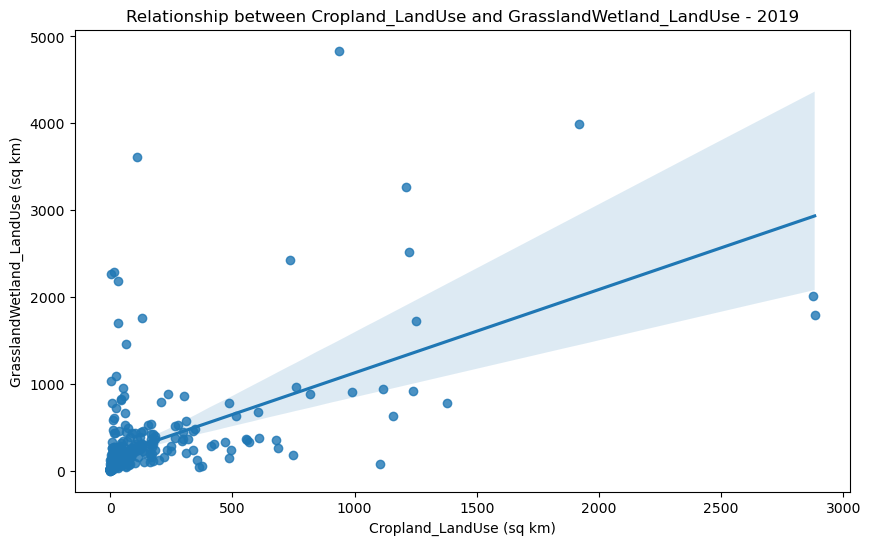

2019 - GrasslandWetland_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.68
p-value: 9.766e-47
The correlation is statistically significant


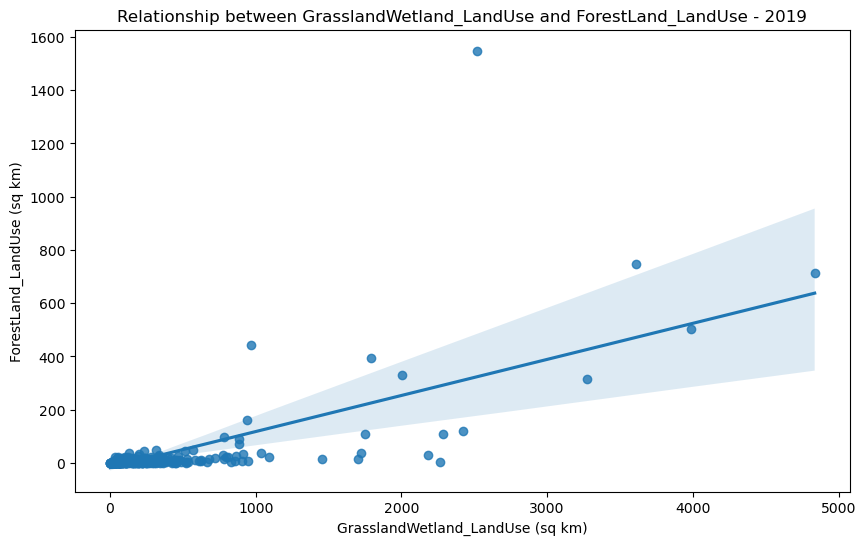

2019 - Other_LandUse vs Settlements_LandUse
Correlation coefficient: 0.327
p-value: 8.863e-10
The correlation is statistically significant


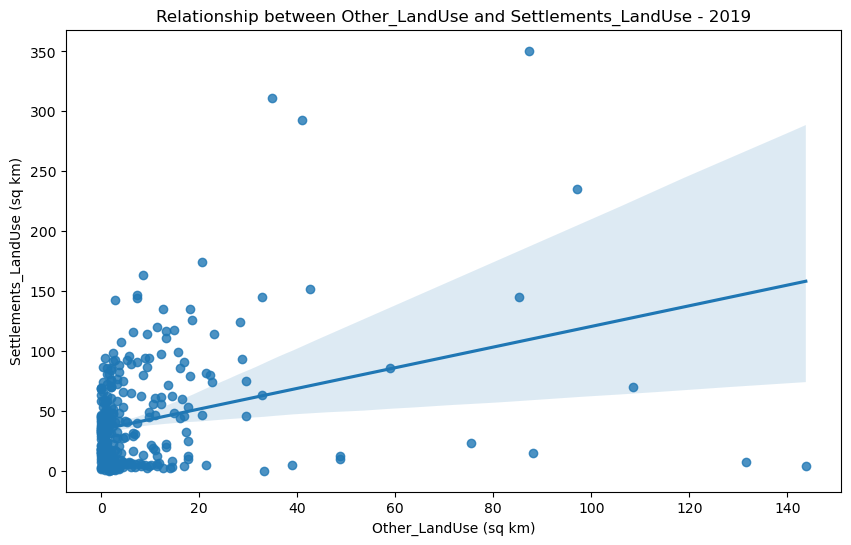

2020 - Settlements_LandUse vs ForestLand_LandUse
Correlation coefficient: -0.0583
p-value: 0.28793422519685163
The correlation is NOT statistically significant


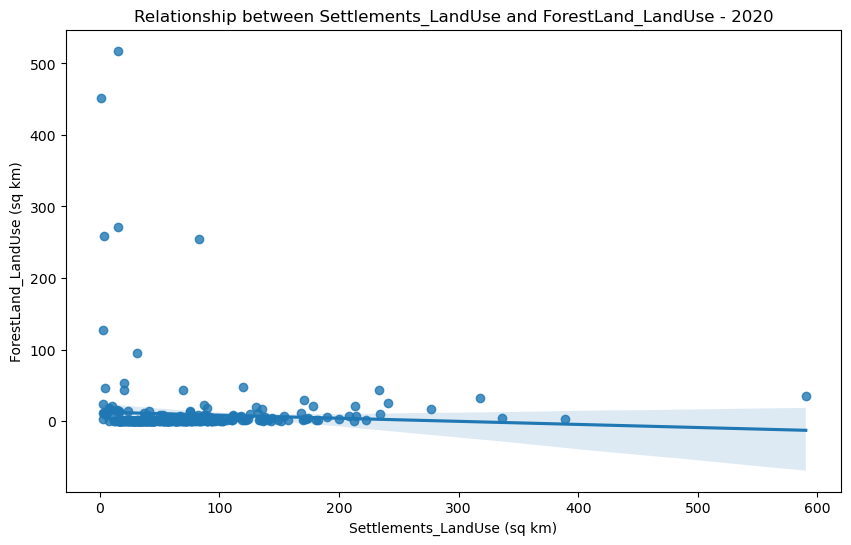

2020 - Settlements_LandUse vs Cropland_LandUse
Correlation coefficient: 0.148
p-value: 6.587e-03
The correlation is statistically significant


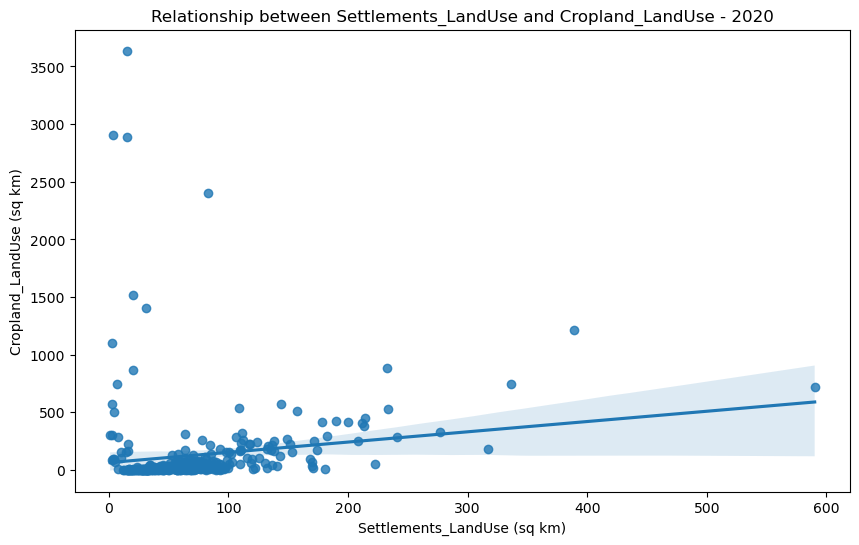

2020 - Cropland_LandUse vs GrasslandWetland_LandUse
Correlation coefficient: 0.562
p-value: 3.217e-29
The correlation is statistically significant


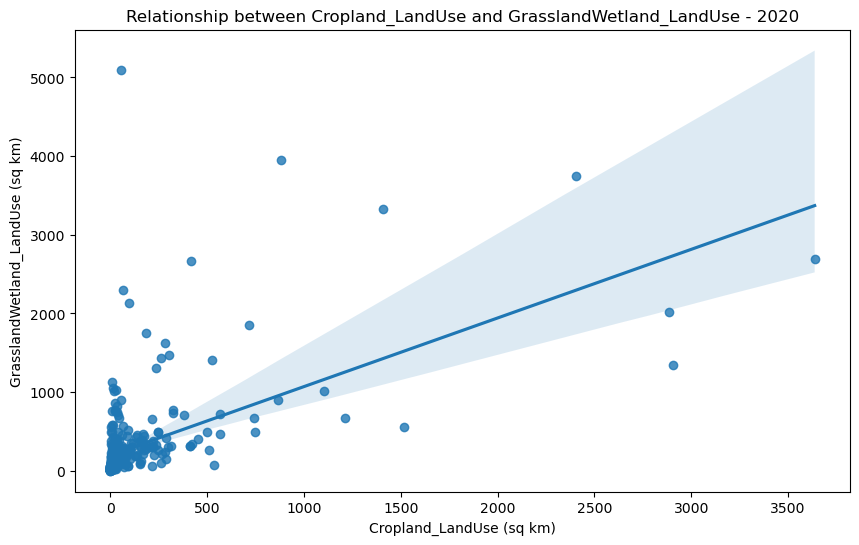

2020 - GrasslandWetland_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.482
p-value: 7.248e-21
The correlation is statistically significant


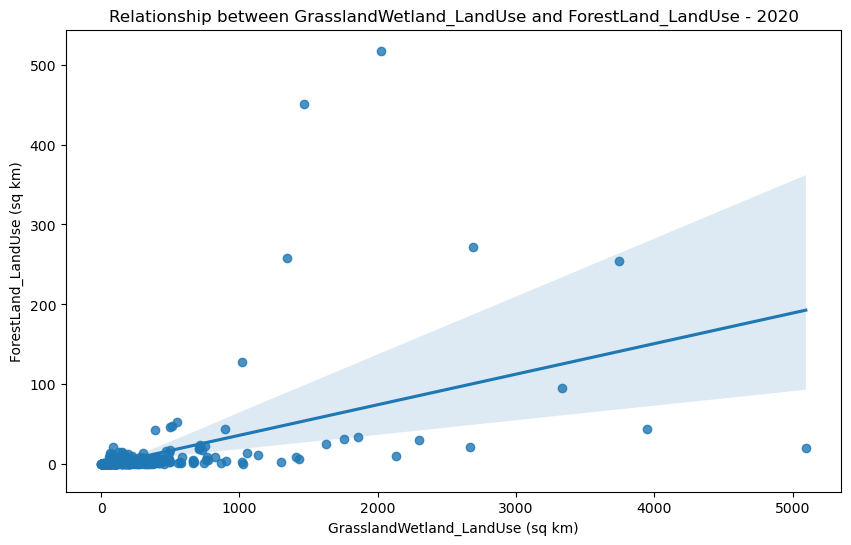

2020 - Other_LandUse vs Settlements_LandUse
Correlation coefficient: 0.526
p-value: 3.716e-25
The correlation is statistically significant


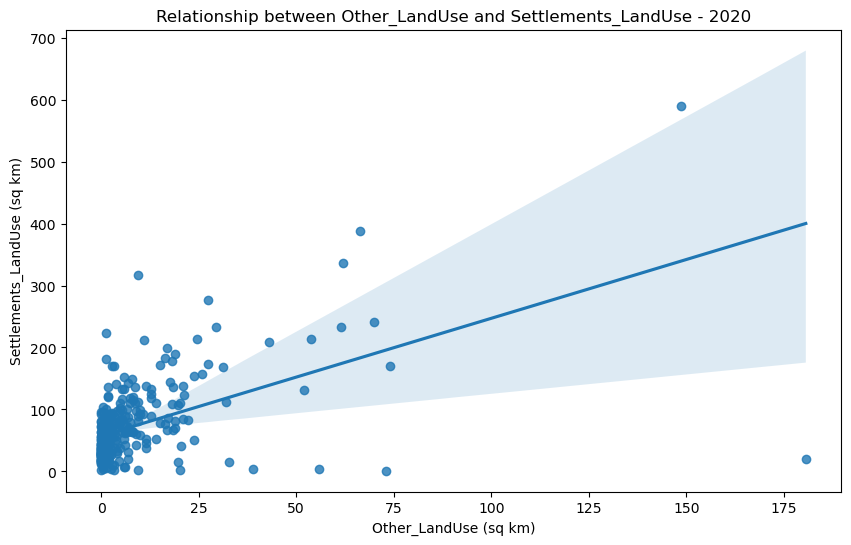

2021 - Settlements_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.114
p-value: 3.677e-02
The correlation is statistically significant


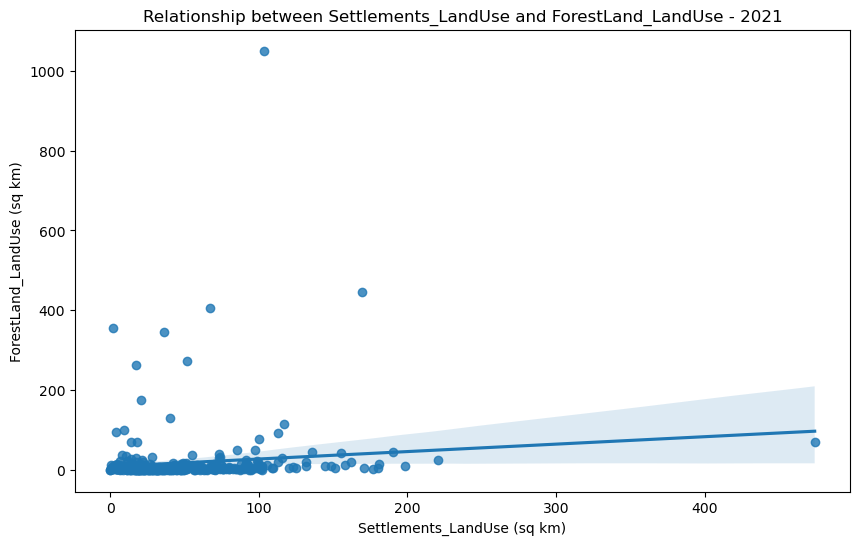

2021 - Settlements_LandUse vs Cropland_LandUse
Correlation coefficient: 0.0327
p-value: 0.5518986464134915
The correlation is NOT statistically significant


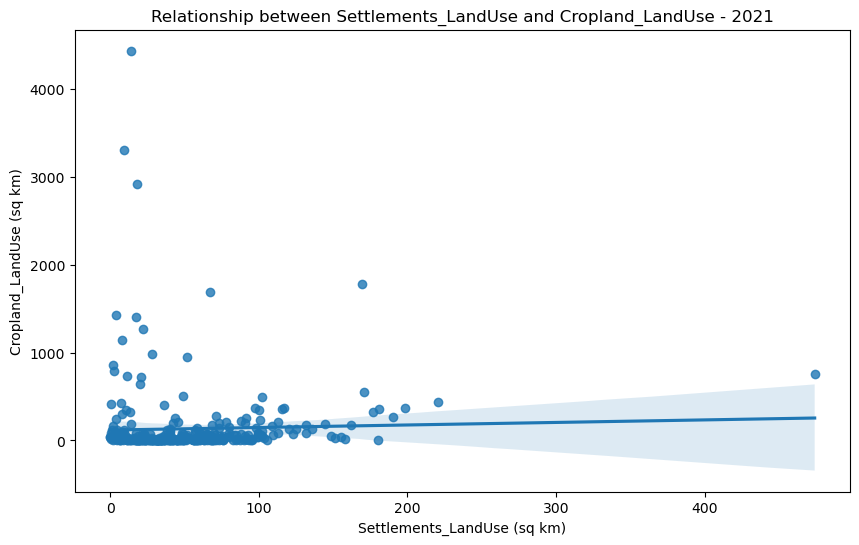

2021 - Cropland_LandUse vs GrasslandWetland_LandUse
Correlation coefficient: 0.593
p-value: 3.781e-33
The correlation is statistically significant


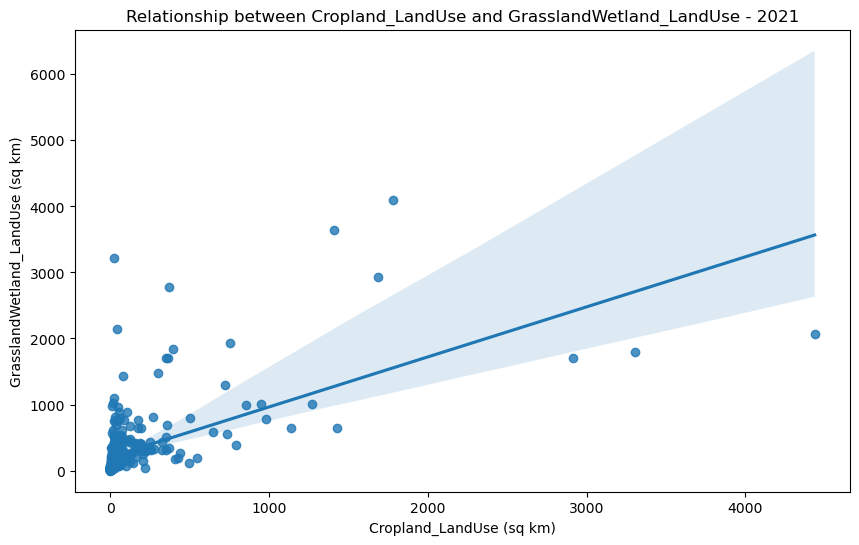

2021 - GrasslandWetland_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.692
p-value: 5.764e-49
The correlation is statistically significant


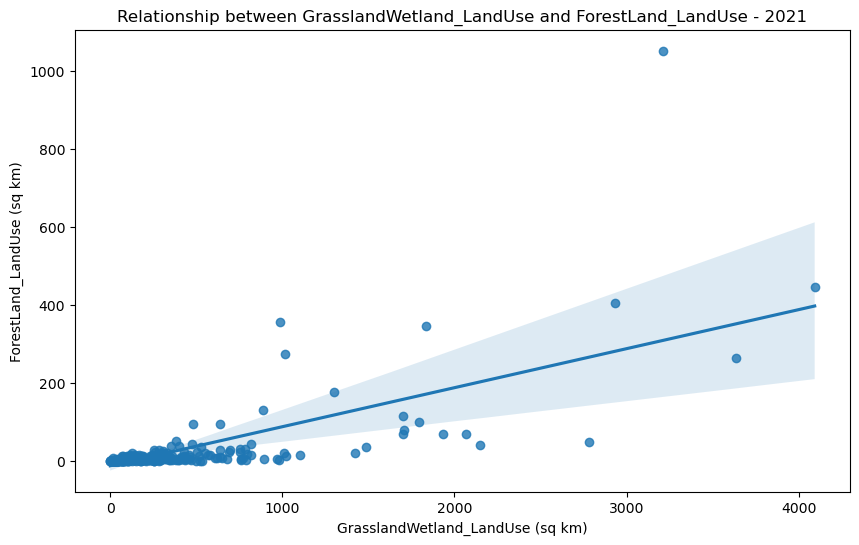

2021 - Other_LandUse vs Settlements_LandUse
Correlation coefficient: 0.243
p-value: 7.305e-06
The correlation is statistically significant


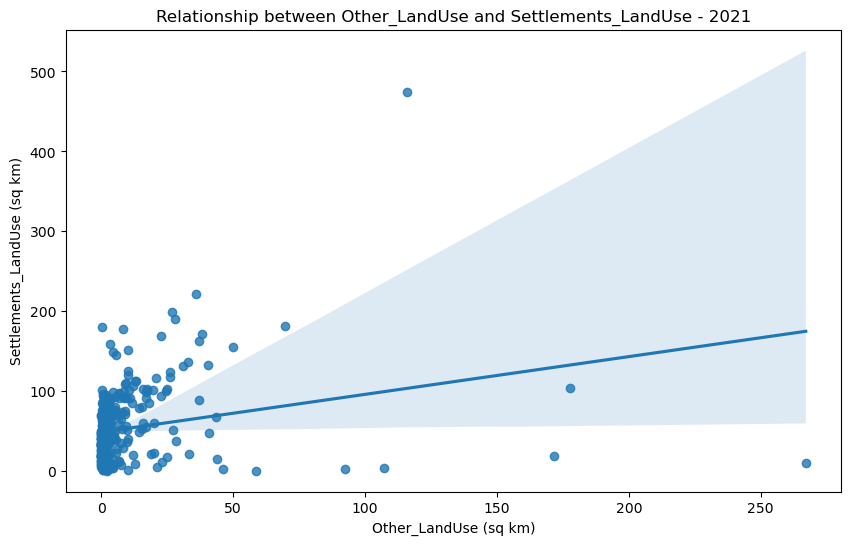

2022 - Settlements_LandUse vs ForestLand_LandUse
Correlation coefficient: -0.0474
p-value: 0.38771450191551154
The correlation is NOT statistically significant


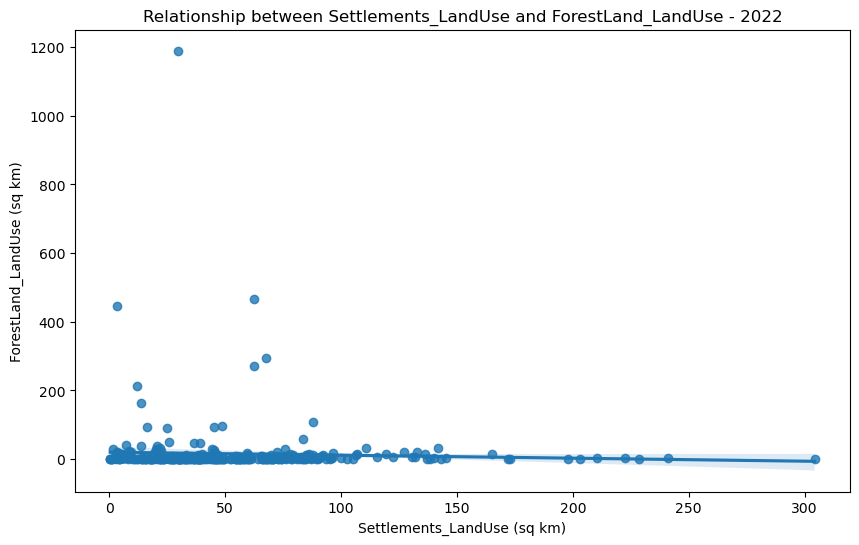

2022 - Settlements_LandUse vs Cropland_LandUse
Correlation coefficient: 0.0276
p-value: 0.6147630271443206
The correlation is NOT statistically significant


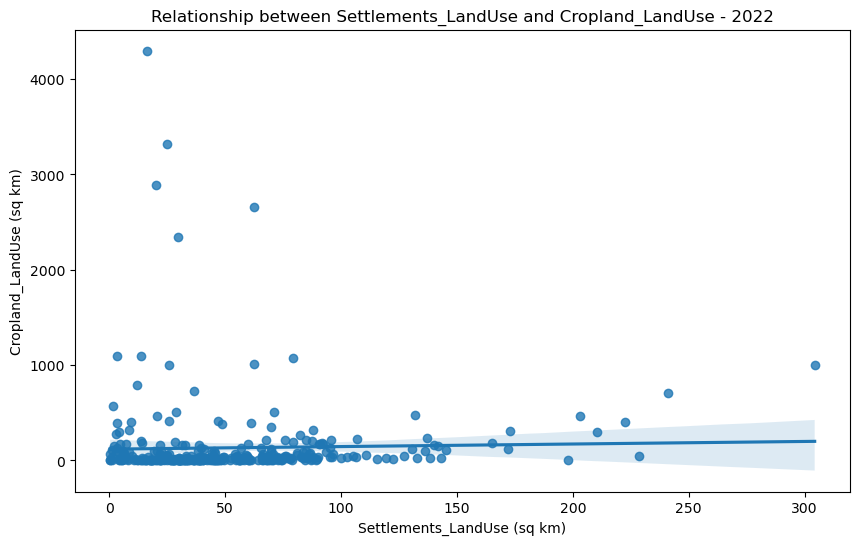

2022 - Cropland_LandUse vs GrasslandWetland_LandUse
Correlation coefficient: 0.583
p-value: 7.625e-32
The correlation is statistically significant


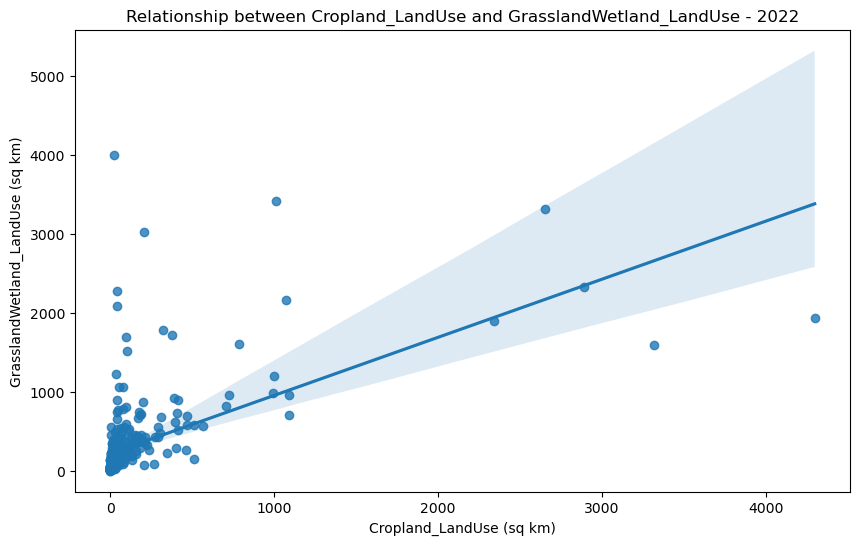

2022 - GrasslandWetland_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.505
p-value: 5.548e-23
The correlation is statistically significant


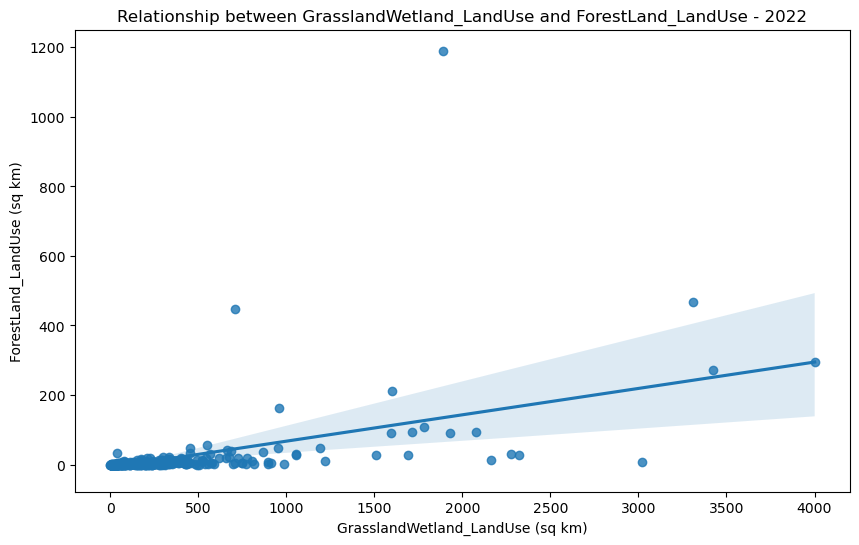

2022 - Other_LandUse vs Settlements_LandUse
Correlation coefficient: 0.0936
p-value: 0.08779239682505552
The correlation is NOT statistically significant


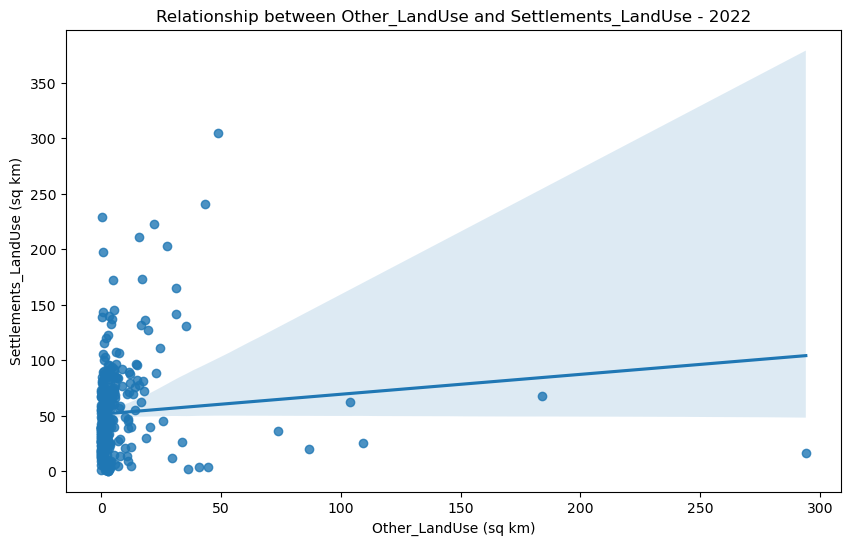

In [85]:
# opposing categories
opposing_cats = [
    ('Settlements_LandUse', 'ForestLand_LandUse'),
    ('Settlements_LandUse', 'Cropland_LandUse'),
    ('Cropland_LandUse', 'GrasslandWetland_LandUse'),
    ('GrasslandWetland_LandUse', 'ForestLand_LandUse'),
    ('Other_LandUse', 'Settlements_LandUse'),
]

years = [2016,2017,2018,2019,2020,2021,2022]

for year in years:
    filtered_df = land_use_ghg_df[land_use_ghg_df['year'] == year]

    for i in opposing_cats:
        x = filtered_df[i[0]]
        y = filtered_df[i[1]]

        print(f'{year} - {i[0]} vs {i[1]}')
        print(f'Correlation coefficient: {x.corr(y):.3}')
        p_value = pearsonr(x, y)[1]
        if p_value < 0.05:
            print(f'p-value: {p_value:.3e}')
            print('The correlation is statistically significant')
        else:
            print(f'p-value: {p_value}')
            print('The correlation is NOT statistically significant')



        plt.figure(figsize=(10, 6))
        sns.regplot(data=filtered_df, x=i[0],y=i[1])
        plt.xlabel(f'{i[0]} (sq km)')
        plt.ylabel(f'{i[1]} (sq km)')
        plt.title(f'Relationship between {i[0]} and {i[1]} - {year}')
        plt.show()

## Multiple Linear Regression

https://www.statsmodels.org/stable/generated/statsmodels.regression.linear_model.OLS.html

* r-squared - is a percentage and shows how much of the variance in emissions is explained by the model (forests is 82.9%)
* prob(f statistics) shows whether the model is statsictically signifcant overall
* coefficenet interpretation - Cropland_LandUse (-0.0582) - dor every 1 sq km increase in cropland, forestland GHG reduces by 0.0582 kt CO2e. Settlement - ofr every 1 sq km increas in settlement forestland GHG increases by +0.1334
* p value - shows statistical significance


In [86]:
# independent variabless - land use categories
X = land_use_ghg_df[['Cropland_LandUse', 'ForestLand_LandUse', 'GrasslandWetland_LandUse', 
                     'Other_LandUse', 'Settlements_LandUse']]

# adds intercept
X = sm.add_constant(X)

# loops through each GHG category and creates regression model
ghg_categories = ['Cropland_GHG', 'ForestLand_GHG', 'GrasslandWetland_GHG',
                  'Other_GHG', 'Settlements_GHG']

for ghg in ghg_categories:
    y = land_use_ghg_df[ghg]  # dependent variable
    model = sm.OLS(y, X).fit()
    
    print(f"Regression results for {ghg}:")
    print(model.summary())
    print("\n" + "-"*80 + "\n") # creates page break

Regression results for Cropland_GHG:
                            OLS Regression Results                            
Dep. Variable:           Cropland_GHG   R-squared:                       0.512
Model:                            OLS   Adj. R-squared:                  0.511
Method:                 Least Squares   F-statistic:                     490.2
Date:                Fri, 28 Mar 2025   Prob (F-statistic):               0.00
Time:                        10:24:39   Log-Likelihood:                -13021.
No. Observations:                2338   AIC:                         2.605e+04
Df Residuals:                    2332   BIC:                         2.609e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------

### Add year as independent variable

Year not statistically significant so isn't meaning full when added

In [87]:
# independent variabless - land use categories
X = land_use_ghg_df[['year','Cropland_LandUse', 'ForestLand_LandUse', 'GrasslandWetland_LandUse', 
                     'Other_LandUse', 'Settlements_LandUse']]


# adds intercept
X = sm.add_constant(X)

# loops through each GHG category and creates regression model
ghg_categories = ['Cropland_GHG', 'ForestLand_GHG', 'GrasslandWetland_GHG',
                  'Other_GHG', 'Settlements_GHG']


for ghg in ghg_categories:
    y = land_use_ghg_df[ghg]  # dependent variable
    model = sm.OLS(y, X).fit()
        

    print(f"Regression results for {ghg}:")
    print(model.summary())
    print("\n" + "-"*80 + "\n") # creates page break

Regression results for Cropland_GHG:
                            OLS Regression Results                            
Dep. Variable:           Cropland_GHG   R-squared:                       0.513
Model:                            OLS   Adj. R-squared:                  0.511
Method:                 Least Squares   F-statistic:                     408.4
Date:                Fri, 28 Mar 2025   Prob (F-statistic):               0.00
Time:                        10:24:39   Log-Likelihood:                -13021.
No. Observations:                2338   AIC:                         2.606e+04
Df Residuals:                    2331   BIC:                         2.610e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------

### Filter by year and perform regression

This will see if the coefficients change much over time. It will helpe explain/evidence how emissions have changed over time due to land changes 

In [88]:
# loops through each GHG category and creates regression model
ghg_categories = ['Cropland_GHG', 'ForestLand_GHG', 'GrasslandWetland_GHG',
                  'Other_GHG', 'Settlements_GHG']

years = [2016,2017,2018,2019,2020,2021,2022]

for year in years:
    filtered_df = land_use_ghg_df[land_use_ghg_df['year'] == year]
    
    # independent variabless - land use categories
    X = filtered_df[['Cropland_LandUse', 'ForestLand_LandUse', 'GrasslandWetland_LandUse', 
                         'Other_LandUse', 'Settlements_LandUse']]
    # adds intercept
    X = sm.add_constant(X)

    for ghg in ghg_categories:
        y = filtered_df[ghg]  # dependent variable
        model = sm.OLS(y, X).fit()
        
        print(year)
        print(f"Regression results for {ghg} in {year}:")
        print(model.summary())
        print("\n" + "-"*80 + "\n") # creates page break

2016
Regression results for Cropland_GHG in 2016:
                            OLS Regression Results                            
Dep. Variable:           Cropland_GHG   R-squared:                       0.645
Model:                            OLS   Adj. R-squared:                  0.639
Method:                 Least Squares   F-statistic:                     119.0
Date:                Fri, 28 Mar 2025   Prob (F-statistic):           1.67e-71
Time:                        10:24:39   Log-Likelihood:                -1816.3
No. Observations:                 334   AIC:                             3645.
Df Residuals:                     328   BIC:                             3667.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------

2020
Regression results for GrasslandWetland_GHG in 2020:
                             OLS Regression Results                             
Dep. Variable:     GrasslandWetland_GHG   R-squared:                       0.174
Model:                              OLS   Adj. R-squared:                  0.161
Method:                   Least Squares   F-statistic:                     13.79
Date:                  Fri, 28 Mar 2025   Prob (F-statistic):           3.11e-12
Time:                          10:24:39   Log-Likelihood:                -1914.2
No. Observations:                   334   AIC:                             3840.
Df Residuals:                       328   BIC:                             3863.
Df Model:                             5                                         
Covariance Type:              nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

2022
Regression results for Cropland_GHG in 2022:
                            OLS Regression Results                            
Dep. Variable:           Cropland_GHG   R-squared:                       0.576
Model:                            OLS   Adj. R-squared:                  0.570
Method:                 Least Squares   F-statistic:                     89.11
Date:                Fri, 28 Mar 2025   Prob (F-statistic):           5.45e-59
Time:                        10:24:39   Log-Likelihood:                -1830.3
No. Observations:                 334   AIC:                             3673.
Df Residuals:                     328   BIC:                             3696.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------

# Results for Research Q3

#### How do the findings vary across regions and city/rural areas?

### dataframe of Correlations split into categories

In [89]:
region_list = set(land_use_ghg_df['Region'].to_list())

In [90]:
land_use_ghg_df

,local_authority,year,total_pixels,total_sqkm,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG
0,South Ayrshire,2016,12284471,1228.4471,914.043309,Scotland,1234.6853,112.567854,Rural,32.3584,32.7680,1069.0560,28.2624,111.8208,60.800080,-168.406704,22.578893,-0.100247,20.931298
1,Huntingdonshire,2016,9121024,912.1024,1921.331100,East of England,912.5461,177.361733,Urban,342.8352,8.1920,368.6400,27.4432,204.8000,30.817585,-22.369041,285.969690,0.276267,6.148401
2,Tewkesbury,2016,4102733,410.2733,893.603856,South West,414.9760,88.153766,Urban,51.2000,1.6384,327.2704,3.6864,63.8976,13.104769,-22.629027,-14.844106,0.324541,3.407730
3,West Lancashire,2016,3427363,342.7363,1033.234330,North West,381.3803,114.563882,Urban,70.4512,2.8672,224.0512,2.8672,67.5840,8.864708,-11.068474,213.030559,0.067400,3.649448
4,Darlington,2016,1976753,197.6753,667.990971,North East,197.4758,106.925688,Urban,52.0192,0.4096,110.1824,2.4576,48.3328,8.121586,-5.683302,-4.716493,0.112159,3.009305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2333,Birmingham,2022,2674485,267.4485,4316.447767,West Midlands,267.7912,1157.603000,Urban,4.9152,0.8192,80.6912,0.8192,197.8368,0.719413,-8.254602,12.142281,0.037500,17.066511
2334,Torridge,2022,9688162,968.8162,626.901017,South West,995.2034,68.635000,Rural,312.9344,22.5280,677.4784,4.0960,8.6016,16.184232,-93.930942,-34.449140,-0.203014,2.409826
2335,Stockton-on-Tees,2022,1586619,158.6619,1978.178678,North East,209.7309,199.966000,Urban,20.8896,0.0000,84.7872,1.2288,67.1744,5.140902,-10.184451,-3.465311,0.072600,7.642307
2336,Perth & Kinross,2022,53376489,5337.6489,1258.152671,Scotland,5418.9445,151.120000,Rural,2343.7312,1189.8880,1891.5328,18.8416,29.4912,488.102005,-519.099546,-157.395750,-3.128700,28.999456


In [91]:
lulucf_cat = ['Cropland','ForestLand','GrasslandWetland','Other','Settlements']

In [92]:
# define df

# define dataframe to hold data
summary_cf_df = pd.DataFrame(columns=['Region/Area',
                                      'Cropland',
                                      'ForestLand',
                                      'GrasslandWetland',
                                      'Other',
                                      'Settlements',])

# create row for overall vals and add to df
row_list = []
row_list.append('All UK')
for j in lulucf_cat:
    #print(i)
        
    x = land_use_ghg_df[f'{j}_LandUse']
    y = land_use_ghg_df[f'{j}_GHG']
        
    p_value = pearsonr(x, y)[1]
        
    row_list.append(f'r={x.corr(y):.2f};p={p_value:.2f}')
    
summary_cf_df.loc[len(summary_cf_df)] = row_list #  append to df

# create for urban/rural split and add to df
for category in rural_urban_list:
    row_list = []
    row_list.append(category)
    for j in lulucf_cat:
        #print(i)
        
        filtered_data = land_use_ghg_df[land_use_ghg_df['rural/urban'] == category]
        
        x = filtered_data[f'{j}_LandUse']
        y = filtered_data[f'{j}_GHG']
        
        p_value = pearsonr(x, y)[1]
        
        row_list.append(f'r={x.corr(y):.2f};p={p_value:.2f}')
    
    summary_cf_df.loc[len(summary_cf_df)] = row_list #  append to df
    #print(row_list)


# create for regions split and add to df
for category in region_list:
    row_list = []
    row_list.append(category)
    for j in lulucf_cat:
        #print(i)
        
        filtered_data = land_use_ghg_df[land_use_ghg_df['Region'] == category]
        
        x = filtered_data[f'{j}_LandUse']
        y = filtered_data[f'{j}_GHG']
        
        p_value = pearsonr(x, y)[1]
        
        row_list.append(f'r={x.corr(y):.2f};p={p_value:.2f}')
    
    summary_cf_df.loc[len(summary_cf_df)] = row_list #  append to df
    #print(row_list)

summary_cf_df

,Region/Area,Cropland,ForestLand,GrasslandWetland,Other,Settlements
0,All UK,r=0.61;p=0.00,r=-0.66;p=0.00,r=0.05;p=0.02,r=0.18;p=0.00,r=0.25;p=0.00
1,Rural,r=0.55;p=0.00,r=-0.61;p=0.00,r=-0.07;p=0.20,r=0.14;p=0.01,r=0.14;p=0.01
2,Urban,r=0.42;p=0.00,r=-0.57;p=0.00,r=-0.13;p=0.00,r=0.07;p=0.00,r=0.26;p=0.00
3,East of England,r=0.87;p=0.00,r=-0.68;p=0.00,r=0.20;p=0.00,r=0.12;p=0.04,r=0.60;p=0.00
4,Scotland,r=0.64;p=0.00,r=-0.61;p=0.00,r=0.19;p=0.00,r=0.02;p=0.76,r=0.47;p=0.00
5,West Midlands,r=0.79;p=0.00,r=-0.66;p=0.00,r=-0.47;p=0.00,r=0.05;p=0.45,r=0.63;p=0.00
6,London,r=0.58;p=0.00,r=-0.36;p=0.00,r=-0.86;p=0.00,r=-0.05;p=0.50,r=0.73;p=0.00
7,North East,r=0.83;p=0.00,r=-0.69;p=0.00,r=-0.76;p=0.00,r=0.83;p=0.00,r=0.55;p=0.00
8,South East,r=0.80;p=0.00,r=-0.77;p=0.00,r=-0.79;p=0.00,r=0.30;p=0.00,r=0.53;p=0.00
9,Yorkshire and the Humber,r=0.96;p=0.00,r=-0.36;p=0.00,r=0.29;p=0.00,r=0.14;p=0.17,r=0.47;p=0.00


# Results for Research Q3 for Urban/Rural categories

### Heatmaps

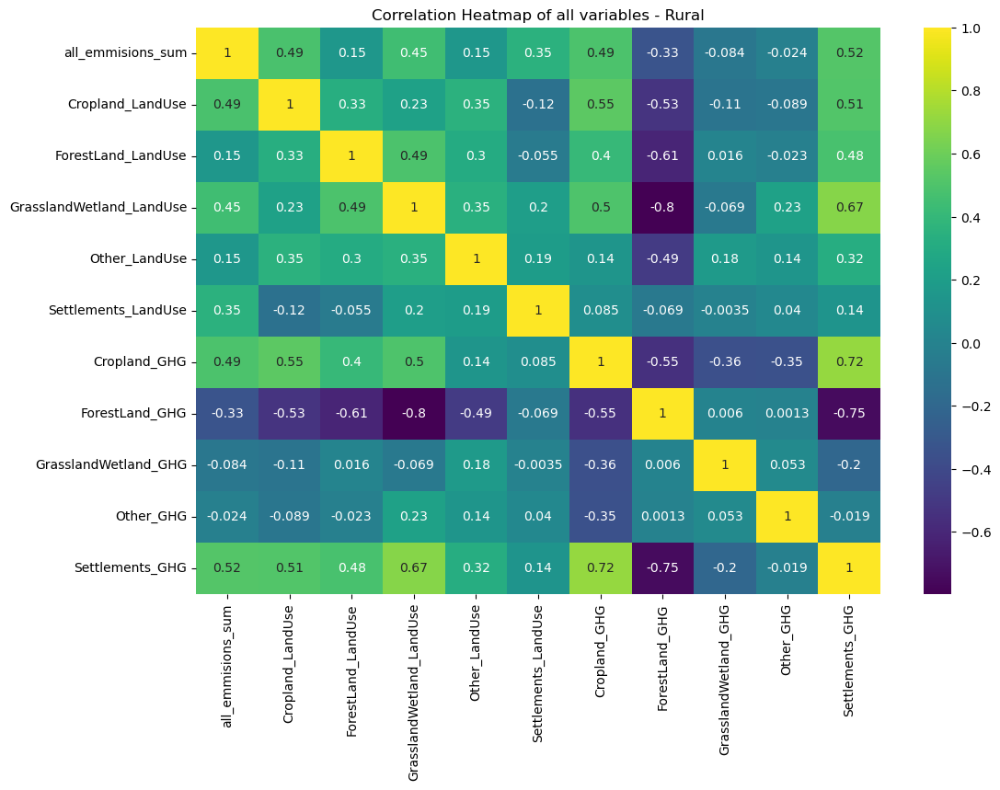

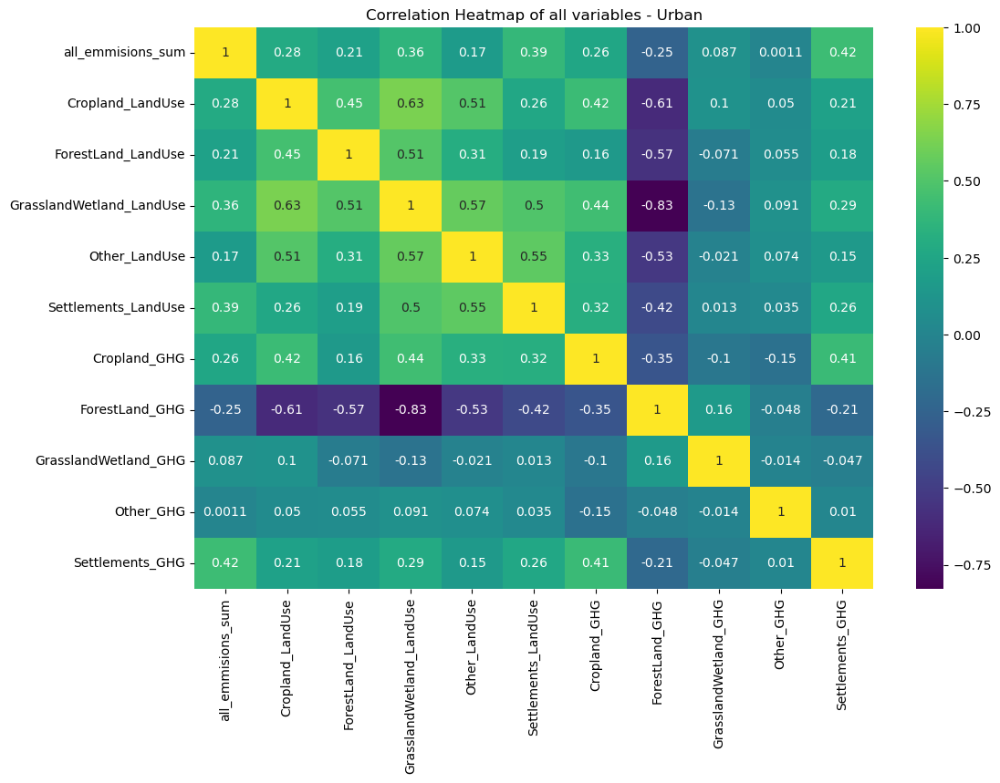

In [93]:
### rural/urban

# heat map of all cols
# drop cols I dont want to include first

for i in rural_urban_list:
    
    filtered_df = land_use_ghg_df[land_use_ghg_df['rural/urban'] == i]

    heatmap_df = filtered_df.drop(columns = ['local_authority','year','total_pixels','total_sqkm',
                                                'Region','Area (km2)','Mid-year Population (thousands)', 'rural/urban'])
    plt.figure(figsize=(12, 8))
    sns.heatmap(heatmap_df.corr(),annot=True,cmap='viridis')
    plt.title(f"Correlation Heatmap of all variables - {i.title()}")
    plt.show()

### Regression plots for each category

This compares each LULUCF class - it's land use class with its repective GHG emissions 

Cropland
Correlation coefficient: 0.55
p-value: 3.498e-29
The correlation is statistically significant


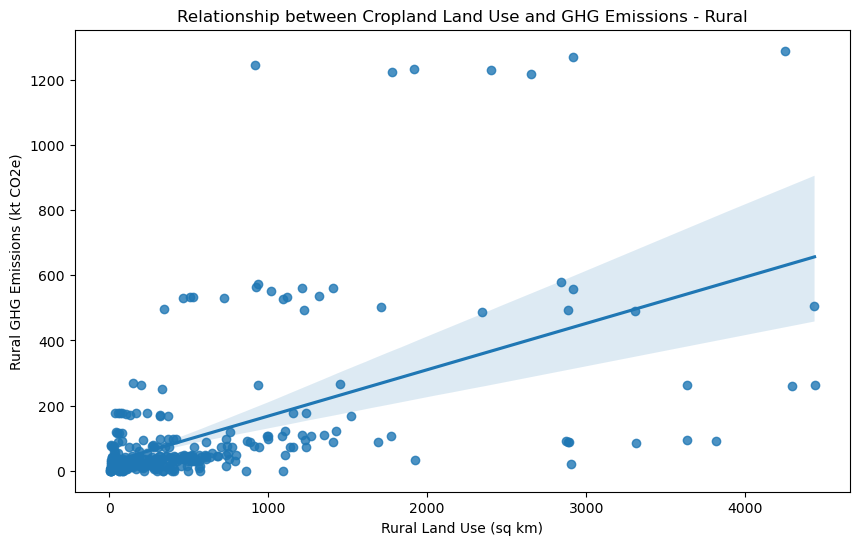

Other
Correlation coefficient: 0.142
p-value: 7.537e-03
The correlation is statistically significant


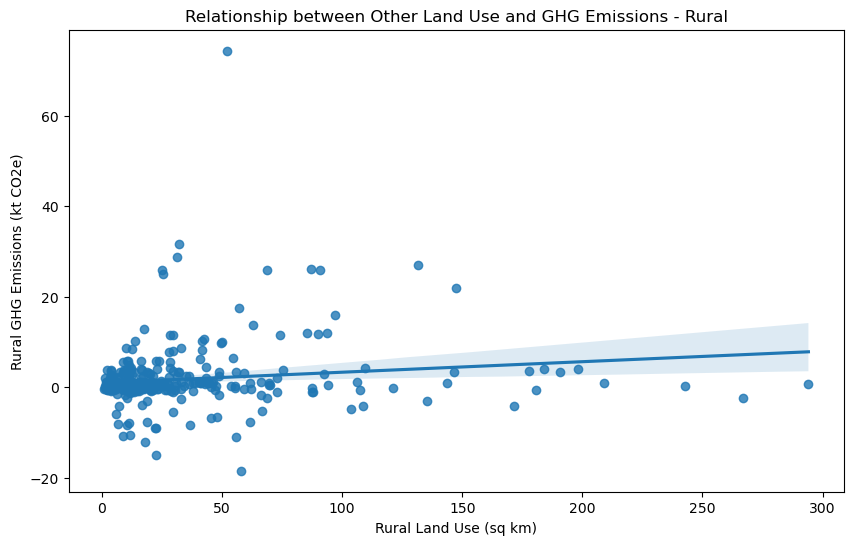

ForestLand
Correlation coefficient: -0.609
p-value: 3.750e-37
The correlation is statistically significant


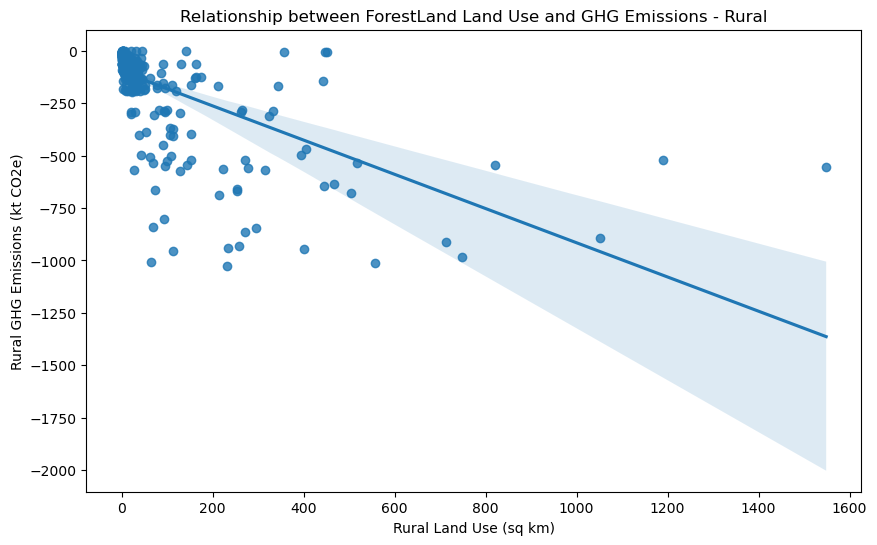

Settlements
Correlation coefficient: 0.136
p-value: 1.037e-02
The correlation is statistically significant


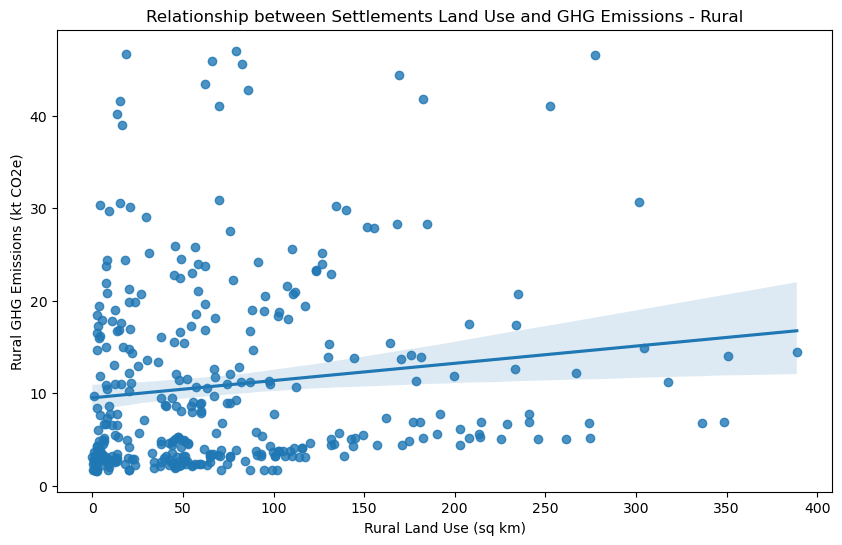

GrasslandWetland
Correlation coefficient: -0.069
p-value: 0.1965197214892767
The correlation is NOT statistically significant


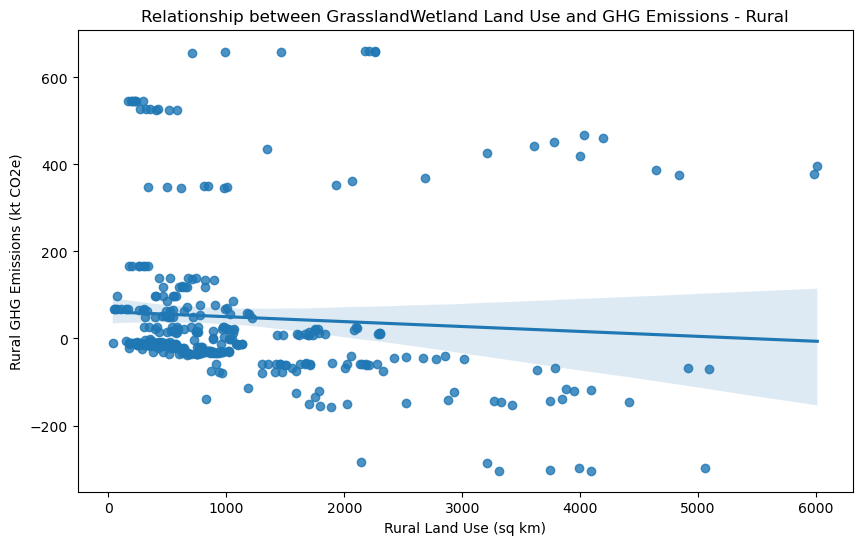

Cropland
Correlation coefficient: 0.418
p-value: 1.006e-84
The correlation is statistically significant


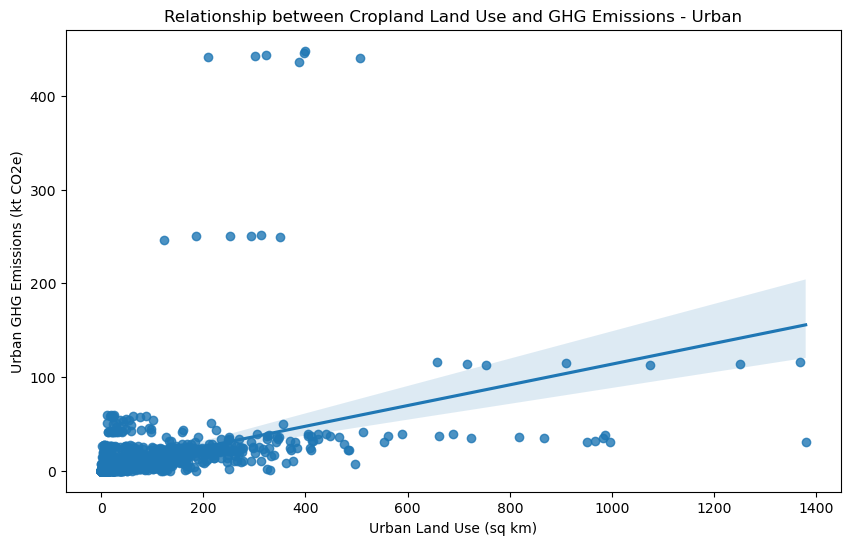

Other
Correlation coefficient: 0.0739
p-value: 9.822e-04
The correlation is statistically significant


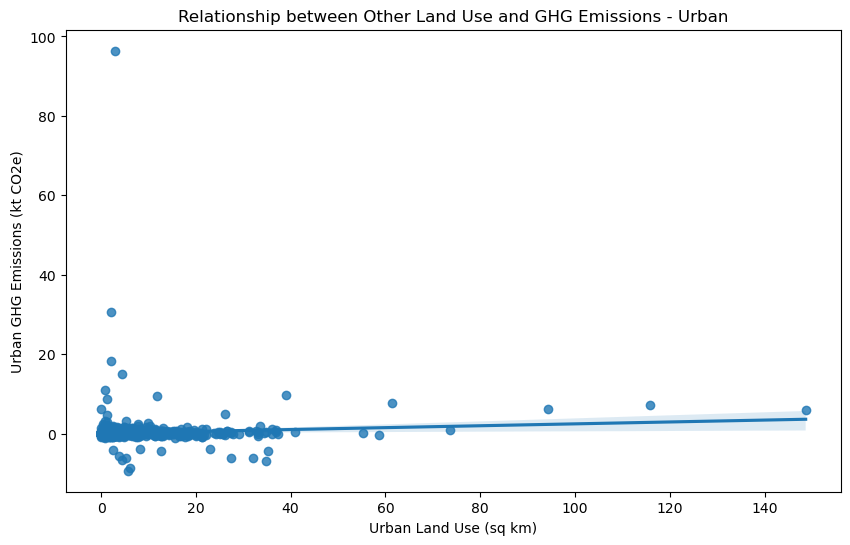

ForestLand
Correlation coefficient: -0.57
p-value: 1.219e-171
The correlation is statistically significant


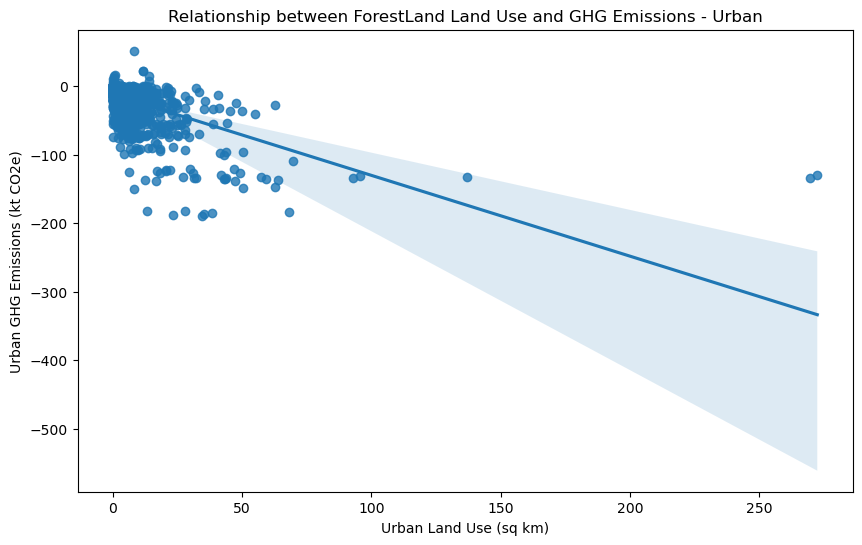

Settlements
Correlation coefficient: 0.264
p-value: 6.052e-33
The correlation is statistically significant


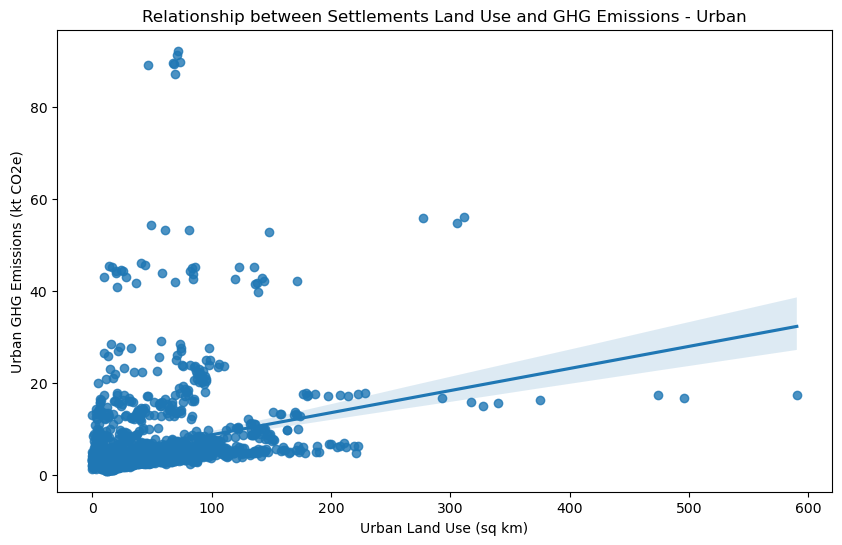

GrasslandWetland
Correlation coefficient: -0.13
p-value: 6.015e-09
The correlation is statistically significant


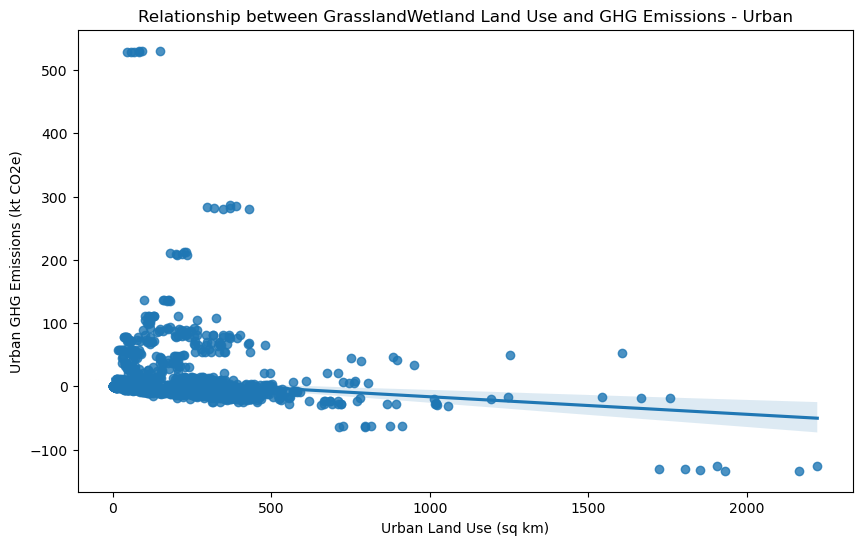

In [94]:
for i in rural_urban_list:
    
    lulucf_cat = set(land_use_ghg_df_longform['LULUCF_category'].to_list())

    for j in lulucf_cat:
        
        filtered_data = land_use_ghg_df[land_use_ghg_df['rural/urban'] == i]
        
        x = filtered_data[f'{j}_LandUse']
        y = filtered_data[f'{j}_GHG']
        
        print(j)
        print(f'Correlation coefficient: {x.corr(y):.3}')
        p_value = pearsonr(x, y)[1]
        if p_value < 0.05:
            print(f'p-value: {p_value:.3e}')
            print('The correlation is statistically significant')
        else:
            print(f'p-value: {p_value}')
            print('The correlation is NOT statistically significant')


        #data = filtered_data[filtered_data['LULUCF_category']==j]
        plt.figure(figsize=(10, 6))
        sns.regplot(data=filtered_data, x=f'{j}_LandUse',y=f'{j}_GHG')
        plt.xlabel(f"{i} Land Use (sq km)")
        plt.ylabel(f"{i} GHG Emissions (kt CO2e)")
        plt.title(f"Relationship between {j} Land Use and GHG Emissions - {i.title()}")
        plt.show()

### Plot against opposing categories

Settlements_LandUse vs ForestLand_LandUse
Correlation coefficient: -0.055
p-value: 0.3033250081462552
The correlation is NOT statistically significant


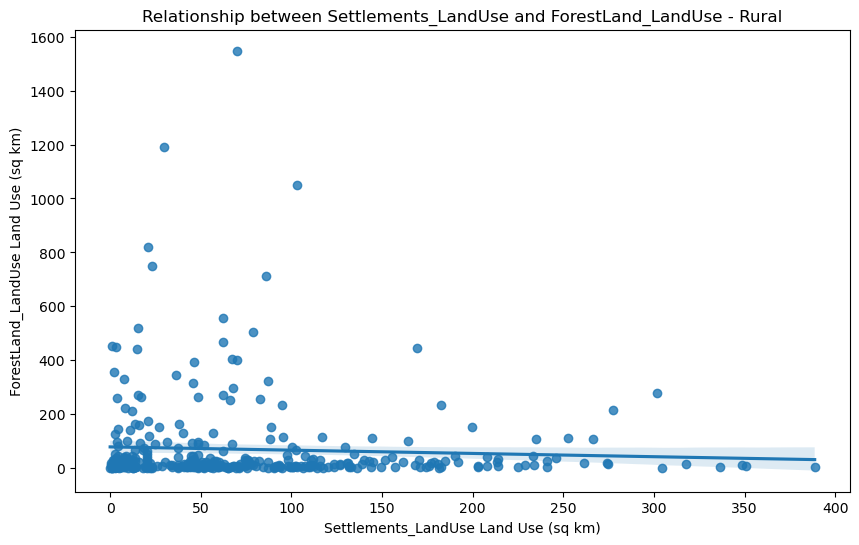

Settlements_LandUse vs Cropland_LandUse
Correlation coefficient: -0.124
p-value: 1.946e-02
The correlation is statistically significant


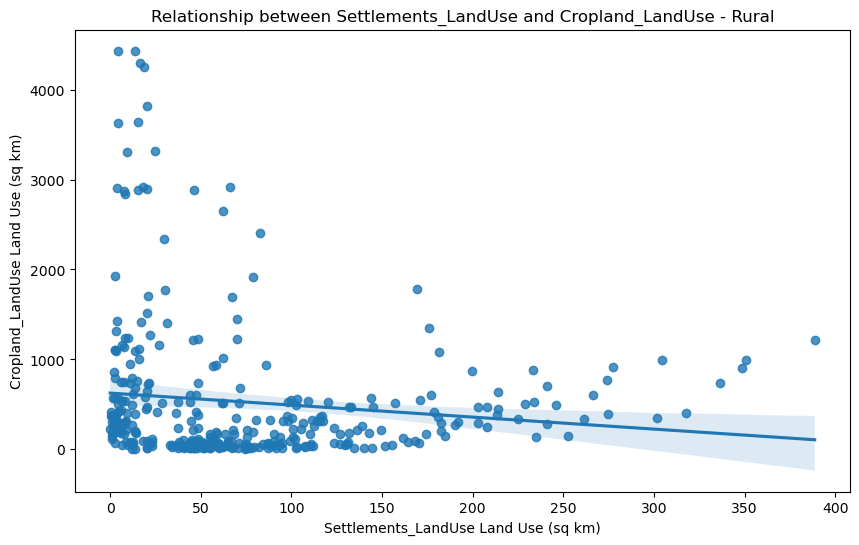

Cropland_LandUse vs GrasslandWetland_LandUse
Correlation coefficient: 0.231
p-value: 1.150e-05
The correlation is statistically significant


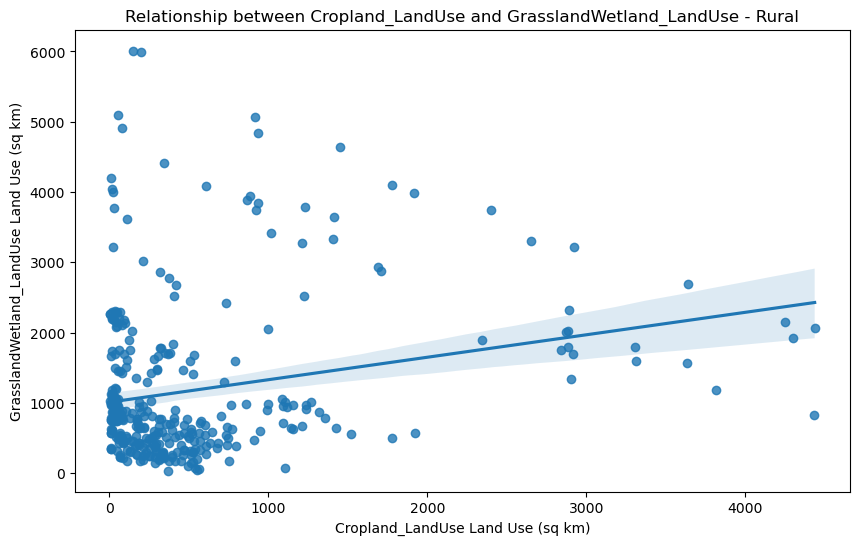

GrasslandWetland_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.492
p-value: 7.590e-23
The correlation is statistically significant


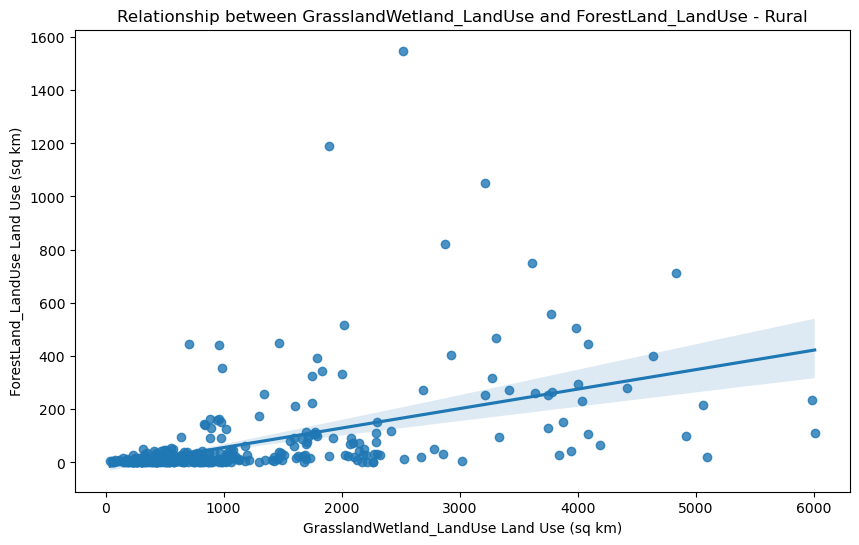

Other_LandUse vs Settlements_LandUse
Correlation coefficient: 0.192
p-value: 2.968e-04
The correlation is statistically significant


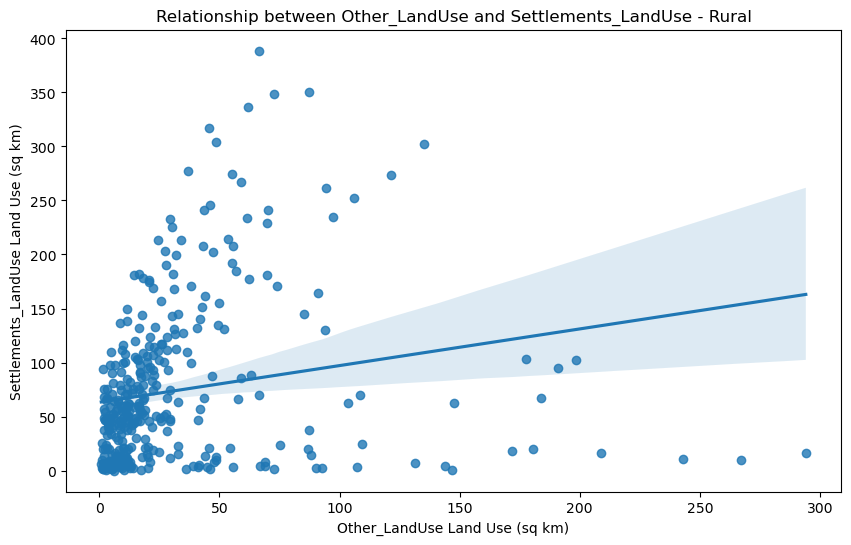

Settlements_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.19
p-value: 1.348e-17
The correlation is statistically significant


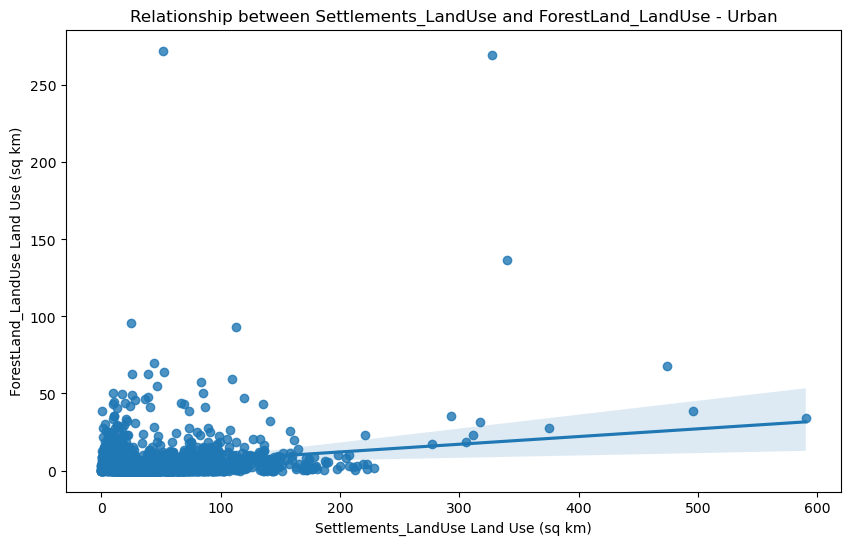

Settlements_LandUse vs Cropland_LandUse
Correlation coefficient: 0.263
p-value: 7.183e-33
The correlation is statistically significant


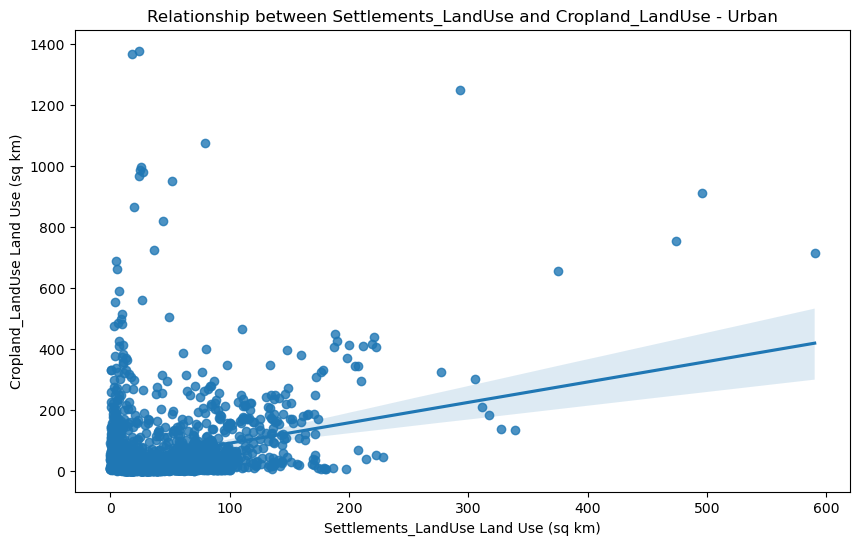

Cropland_LandUse vs GrasslandWetland_LandUse
Correlation coefficient: 0.635
p-value: 2.071e-224
The correlation is statistically significant


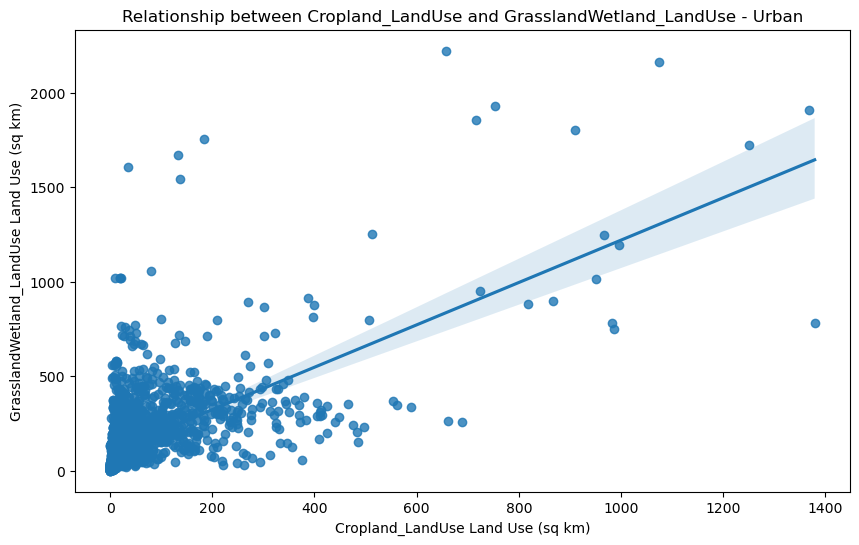

GrasslandWetland_LandUse vs ForestLand_LandUse
Correlation coefficient: 0.513
p-value: 1.346e-133
The correlation is statistically significant


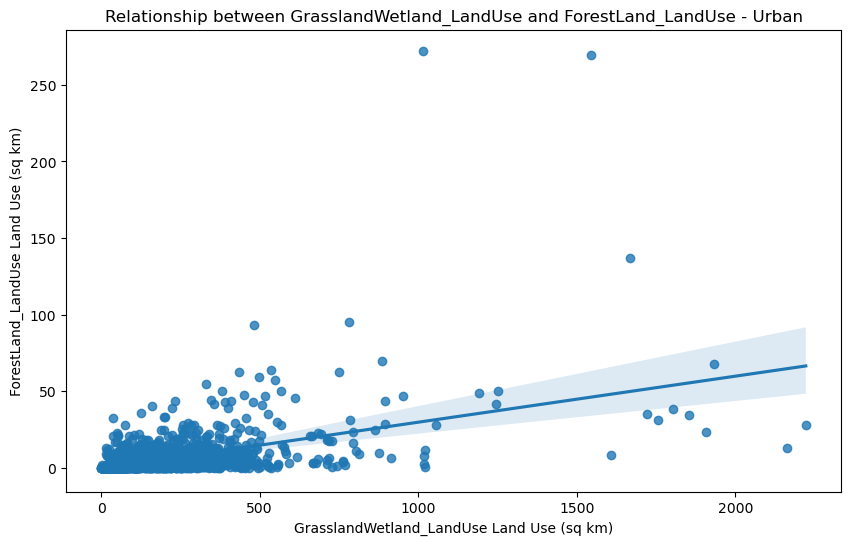

Other_LandUse vs Settlements_LandUse
Correlation coefficient: 0.55
p-value: 2.352e-157
The correlation is statistically significant


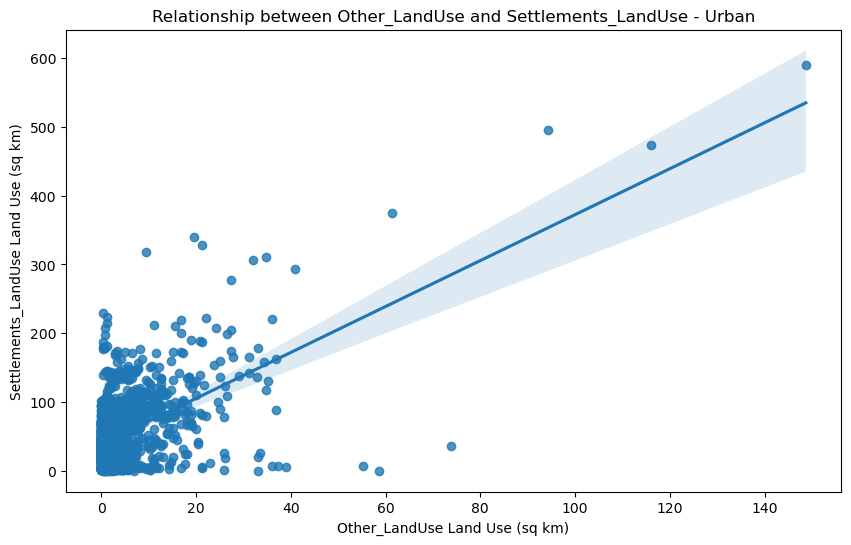

In [95]:
# opposing categories
opposing_cats = [
    ('Settlements_LandUse', 'ForestLand_LandUse'),
    ('Settlements_LandUse', 'Cropland_LandUse'),
    ('Cropland_LandUse', 'GrasslandWetland_LandUse'),
    ('GrasslandWetland_LandUse', 'ForestLand_LandUse'),
    ('Other_LandUse', 'Settlements_LandUse'),
]

for cat in rural_urban_list:
    
    filtered_data = land_use_ghg_df[land_use_ghg_df['rural/urban'] == cat]

    for i in opposing_cats:
        x = filtered_data[i[0]]
        y = filtered_data[i[1]]

        print(f'{i[0]} vs {i[1]}')
        print(f'Correlation coefficient: {x.corr(y):.3}')
        p_value = pearsonr(x, y)[1]
        if p_value < 0.05:
            print(f'p-value: {p_value:.3e}')
            print('The correlation is statistically significant')
        else:
            print(f'p-value: {p_value}')
            print('The correlation is NOT statistically significant')



        plt.figure(figsize=(10, 6))
        sns.regplot(data=filtered_data, x=i[0],y=i[1])
        plt.xlabel(f'{i[0]} Land Use (sq km)')
        plt.ylabel(f'{i[1]} Land Use (sq km)')
        plt.title(f'Relationship between {i[0]} and {i[1]} - {cat}')
        plt.show()

### Multiple linear regression 

In [96]:
for cat in rural_urban_list:
    
    print(cat)
    
    filtered_data = land_use_ghg_df[land_use_ghg_df['rural/urban'] == cat]

    # independent variabless - land use categories
    X = filtered_data[['Cropland_LandUse', 'ForestLand_LandUse', 'GrasslandWetland_LandUse', 
                         'Other_LandUse', 'Settlements_LandUse']]

    # adds intercept
    X = sm.add_constant(X)

    # loops through categories and creates regression model
    ghg_categories = ['Cropland_GHG', 'ForestLand_GHG', 'GrasslandWetland_GHG',
                      'Other_GHG', 'Settlements_GHG']

    for ghg in ghg_categories:
        y = filtered_data[ghg]  # dependent variable
        model = sm.OLS(y, X).fit()

        print(f"Regression results for {ghg} in {cat} Areas:")
        print(model.summary())
        print("\n" + "-"*80 + "\n") # creates page break

Rural
Regression results for Cropland_GHG in Rural Areas:
                            OLS Regression Results                            
Dep. Variable:           Cropland_GHG   R-squared:                       0.496
Model:                            OLS   Adj. R-squared:                  0.489
Method:                 Least Squares   F-statistic:                     68.06
Date:                Fri, 28 Mar 2025   Prob (F-statistic):           2.14e-49
Time:                        10:24:43   Log-Likelihood:                -2253.6
No. Observations:                 352   AIC:                             4519.
Df Residuals:                     346   BIC:                             4542.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------

In [97]:
## more concise 

for cat in rural_urban_list:
    
    print(cat)
    
    filtered_data = land_use_ghg_df[land_use_ghg_df['rural/urban'] == cat]

    X = filtered_data[['Cropland_LandUse', 'ForestLand_LandUse', 'GrasslandWetland_LandUse', 
                       'Other_LandUse', 'Settlements_LandUse']]

    X = sm.add_constant(X)

    ghg_categories = ['Cropland_GHG', 'ForestLand_GHG', 'GrasslandWetland_GHG',
                      'Other_GHG', 'Settlements_GHG']

    for ghg in ghg_categories:
        y = filtered_data[ghg]  
        model = sm.OLS(y, X).fit()

        print(f"\nSummary for {ghg} in {cat} Areas:")
        print(f"R-squared: {model.rsquared:.3f}")
        print("Coefficients and p-values:")
        for var, coef, pval in zip(model.params.index, model.params, model.pvalues):
            print(f" - {var}: Coef = {coef:.4f}, p = {pval:.4f}")
        print("\n" + "-"*80 + "\n")

Rural

Summary for Cropland_GHG in Rural Areas:
R-squared: 0.496
Coefficients and p-values:
 - const: Coef = -52.8146, p = 0.0002
 - Cropland_LandUse: Coef = 0.1341, p = 0.0000
 - ForestLand_LandUse: Coef = 0.1604, p = 0.0061
 - GrasslandWetland_LandUse: Coef = 0.0686, p = 0.0000
 - Other_LandUse: Coef = -1.1188, p = 0.0000
 - Settlements_LandUse: Coef = 0.3505, p = 0.0022

--------------------------------------------------------------------------------


Summary for ForestLand_GHG in Rural Areas:
R-squared: 0.802
Coefficients and p-values:
 - const: Coef = 57.2926, p = 0.0000
 - Cropland_LandUse: Coef = -0.0771, p = 0.0000
 - ForestLand_LandUse: Coef = -0.2368, p = 0.0000
 - GrasslandWetland_LandUse: Coef = -0.1207, p = 0.0000
 - Other_LandUse: Coef = -0.6982, p = 0.0000
 - Settlements_LandUse: Coef = 0.1014, p = 0.1821

--------------------------------------------------------------------------------


Summary for GrasslandWetland_GHG in Rural Areas:
R-squared: 0.084
Coefficients and 

In [98]:
land_use_ghg_df

,local_authority,year,total_pixels,total_sqkm,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG
0,South Ayrshire,2016,12284471,1228.4471,914.043309,Scotland,1234.6853,112.567854,Rural,32.3584,32.7680,1069.0560,28.2624,111.8208,60.800080,-168.406704,22.578893,-0.100247,20.931298
1,Huntingdonshire,2016,9121024,912.1024,1921.331100,East of England,912.5461,177.361733,Urban,342.8352,8.1920,368.6400,27.4432,204.8000,30.817585,-22.369041,285.969690,0.276267,6.148401
2,Tewkesbury,2016,4102733,410.2733,893.603856,South West,414.9760,88.153766,Urban,51.2000,1.6384,327.2704,3.6864,63.8976,13.104769,-22.629027,-14.844106,0.324541,3.407730
3,West Lancashire,2016,3427363,342.7363,1033.234330,North West,381.3803,114.563882,Urban,70.4512,2.8672,224.0512,2.8672,67.5840,8.864708,-11.068474,213.030559,0.067400,3.649448
4,Darlington,2016,1976753,197.6753,667.990971,North East,197.4758,106.925688,Urban,52.0192,0.4096,110.1824,2.4576,48.3328,8.121586,-5.683302,-4.716493,0.112159,3.009305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2333,Birmingham,2022,2674485,267.4485,4316.447767,West Midlands,267.7912,1157.603000,Urban,4.9152,0.8192,80.6912,0.8192,197.8368,0.719413,-8.254602,12.142281,0.037500,17.066511
2334,Torridge,2022,9688162,968.8162,626.901017,South West,995.2034,68.635000,Rural,312.9344,22.5280,677.4784,4.0960,8.6016,16.184232,-93.930942,-34.449140,-0.203014,2.409826
2335,Stockton-on-Tees,2022,1586619,158.6619,1978.178678,North East,209.7309,199.966000,Urban,20.8896,0.0000,84.7872,1.2288,67.1744,5.140902,-10.184451,-3.465311,0.072600,7.642307
2336,Perth & Kinross,2022,53376489,5337.6489,1258.152671,Scotland,5418.9445,151.120000,Rural,2343.7312,1189.8880,1891.5328,18.8416,29.4912,488.102005,-519.099546,-157.395750,-3.128700,28.999456


# Results for Research Q3 but for Regions

### Regression plots and pearsons correlation coefficents comparing region categories

In [99]:
region_list = set(land_use_ghg_df['Region'].to_list())

East of England
Cropland
Correlation coefficient: 0.866
p-value: 3.317e-92
The correlation is statistically significant


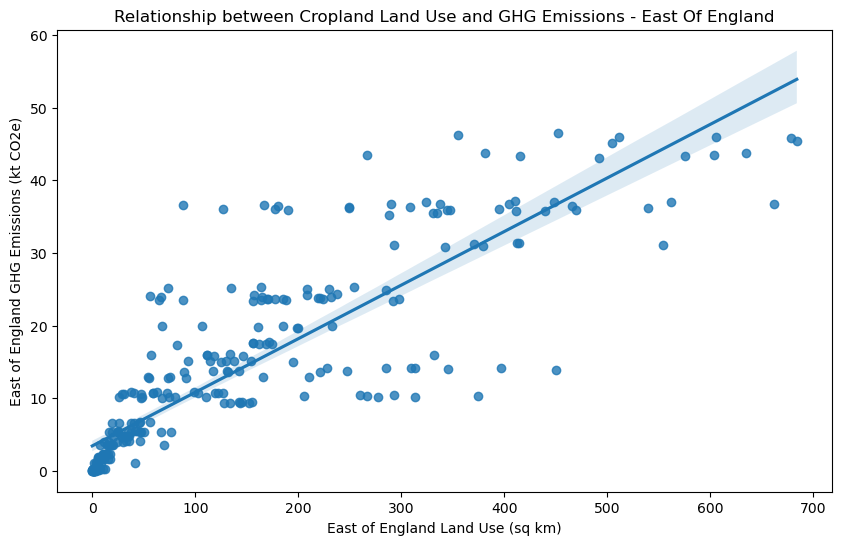

East of England
Other
Correlation coefficient: 0.116
p-value: 4.472e-02
The correlation is statistically significant


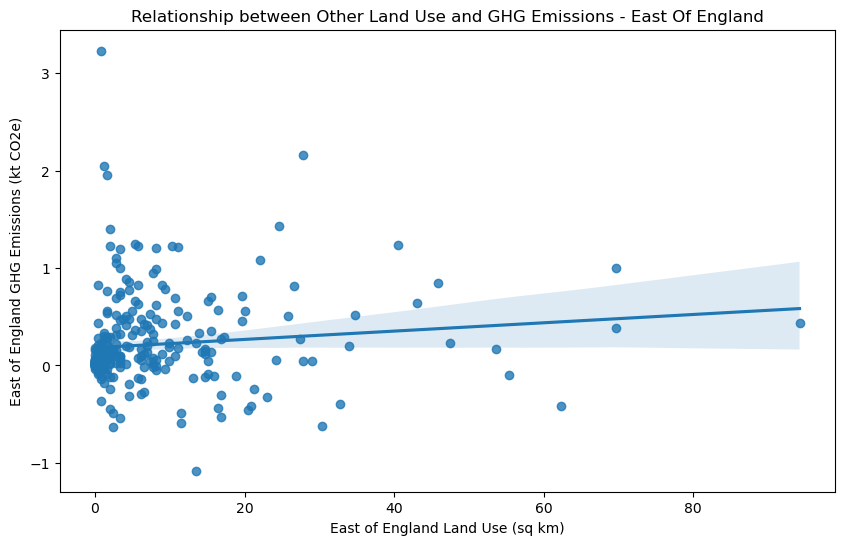

East of England
ForestLand
Correlation coefficient: -0.676
p-value: 1.565e-41
The correlation is statistically significant


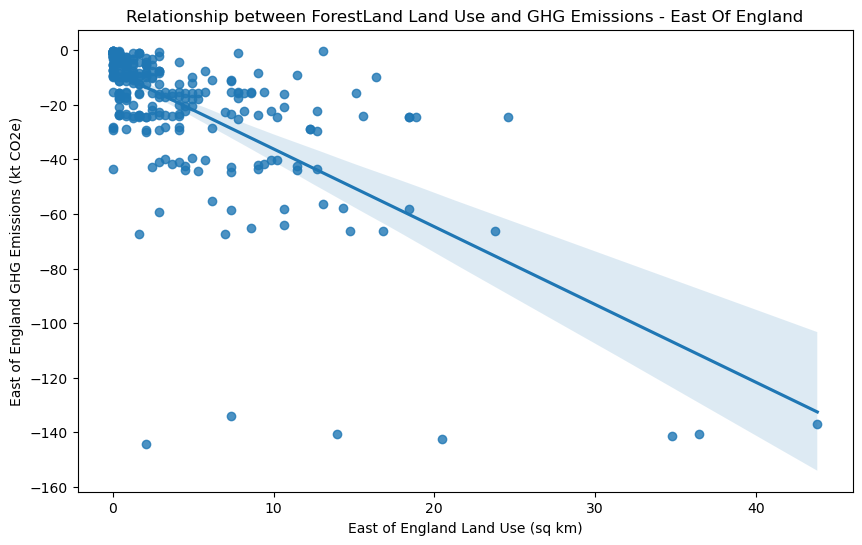

East of England
Settlements
Correlation coefficient: 0.602
p-value: 5.173e-31
The correlation is statistically significant


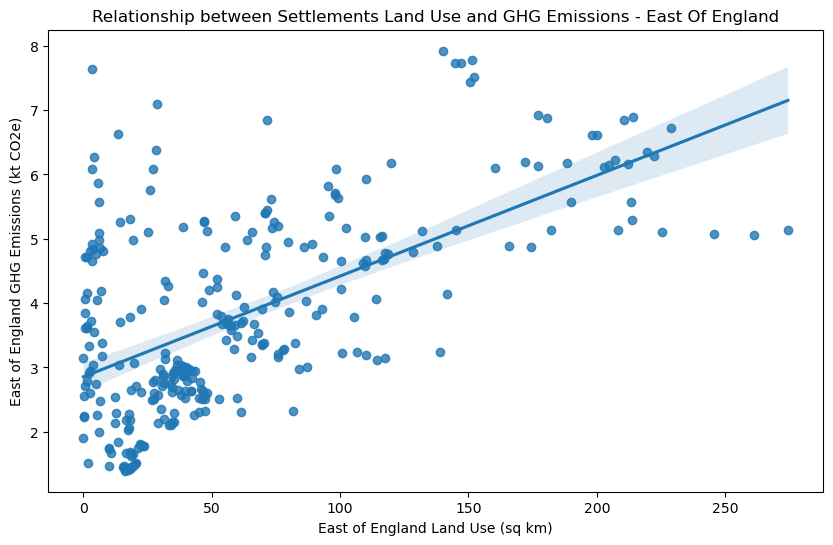

East of England
GrasslandWetland
Correlation coefficient: 0.202
p-value: 4.344e-04
The correlation is statistically significant


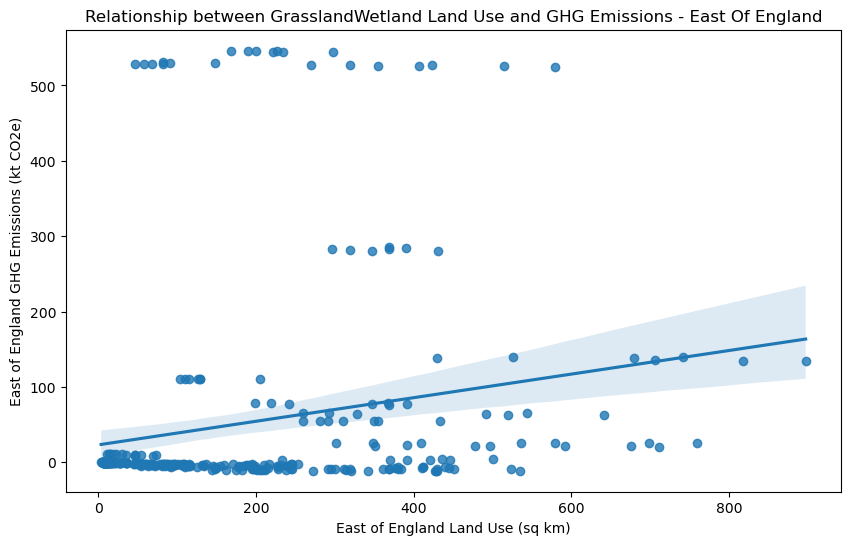

Scotland
Cropland
Correlation coefficient: 0.639
p-value: 2.782e-26
The correlation is statistically significant


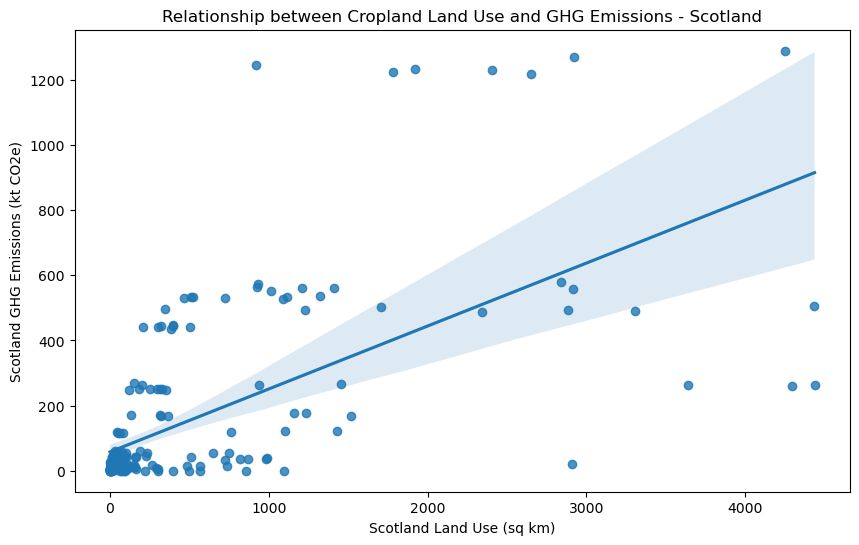

Scotland
Other
Correlation coefficient: 0.021
p-value: 0.7587872682372339
The correlation is NOT statistically significant


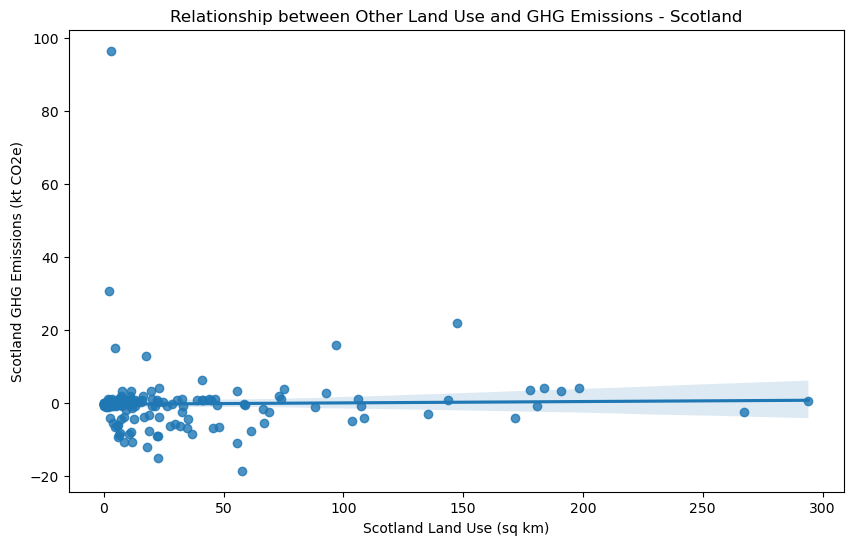

Scotland
ForestLand
Correlation coefficient: -0.609
p-value: 2.215e-23
The correlation is statistically significant


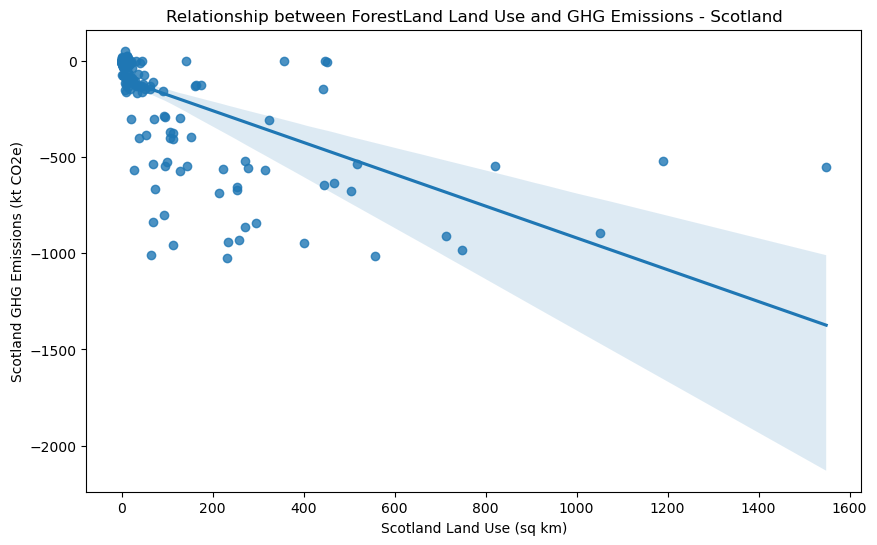

Scotland
Settlements
Correlation coefficient: 0.474
p-value: 1.574e-13
The correlation is statistically significant


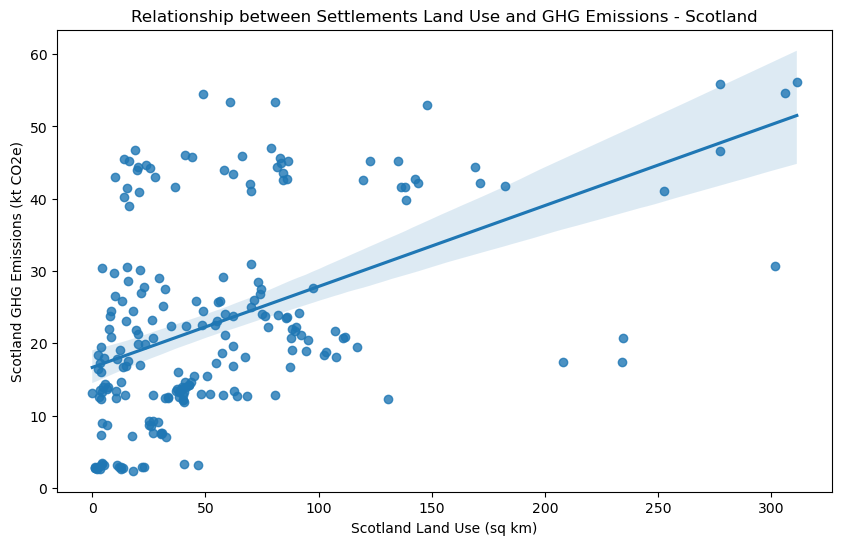

Scotland
GrasslandWetland
Correlation coefficient: 0.195
p-value: 3.963e-03
The correlation is statistically significant


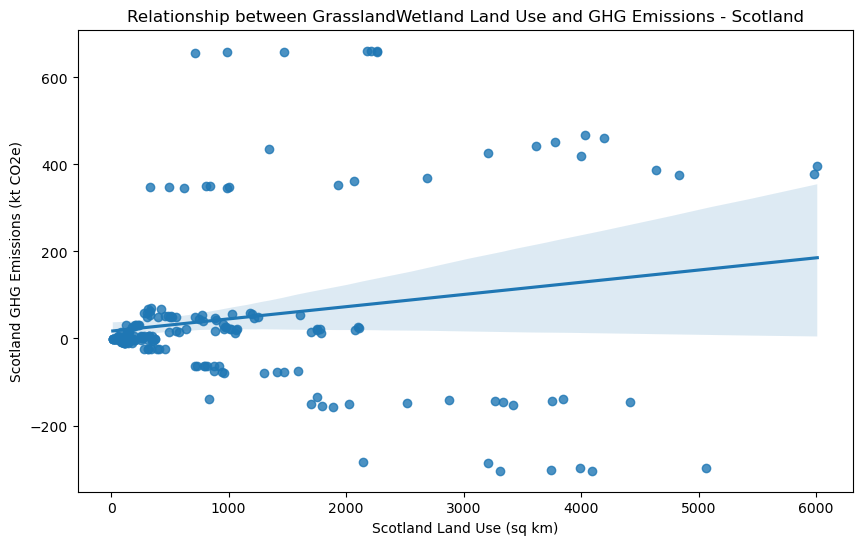

West Midlands
Cropland
Correlation coefficient: 0.789
p-value: 7.008e-46
The correlation is statistically significant


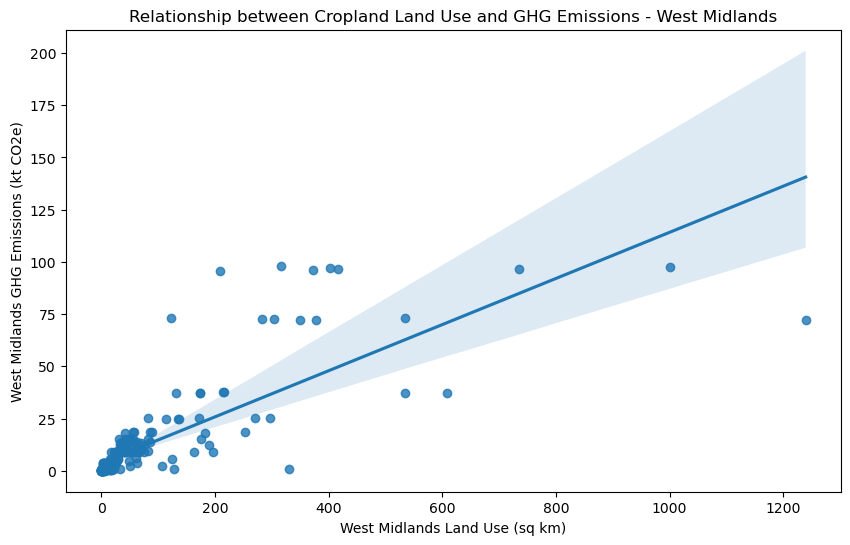

West Midlands
Other
Correlation coefficient: 0.0524
p-value: 0.4500392296553931
The correlation is NOT statistically significant


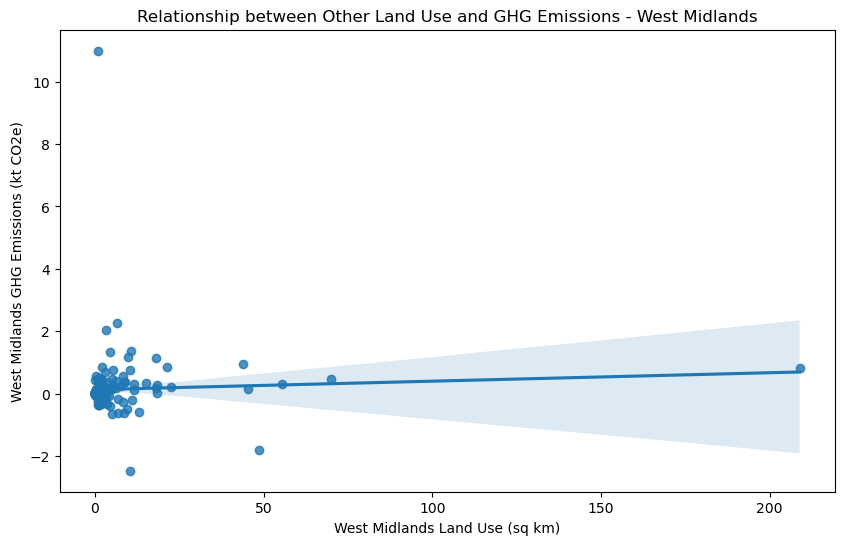

West Midlands
ForestLand
Correlation coefficient: -0.659
p-value: 1.649e-27
The correlation is statistically significant


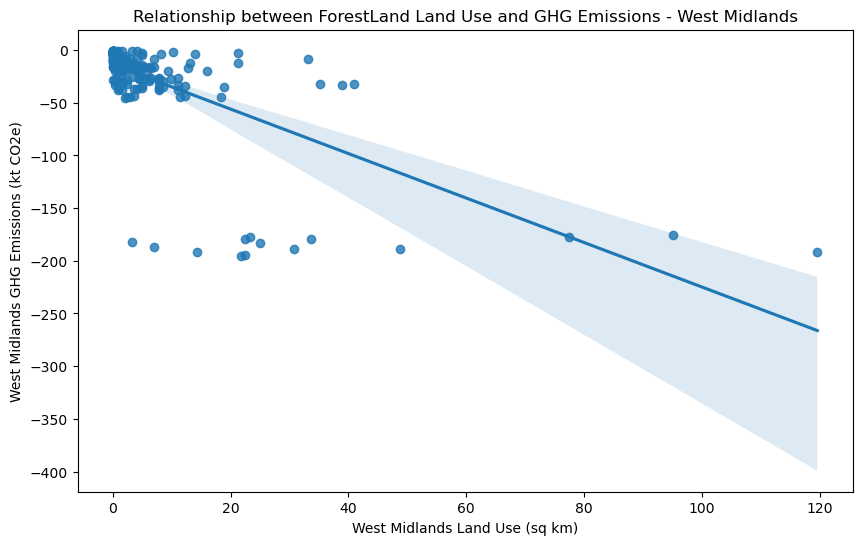

West Midlands
Settlements
Correlation coefficient: 0.627
p-value: 2.624e-24
The correlation is statistically significant


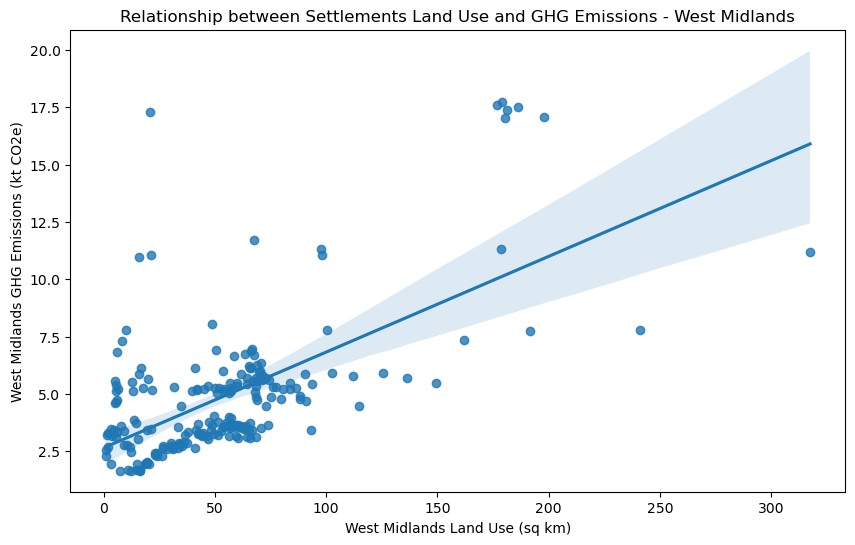

West Midlands
GrasslandWetland
Correlation coefficient: -0.469
p-value: 6.887e-13
The correlation is statistically significant


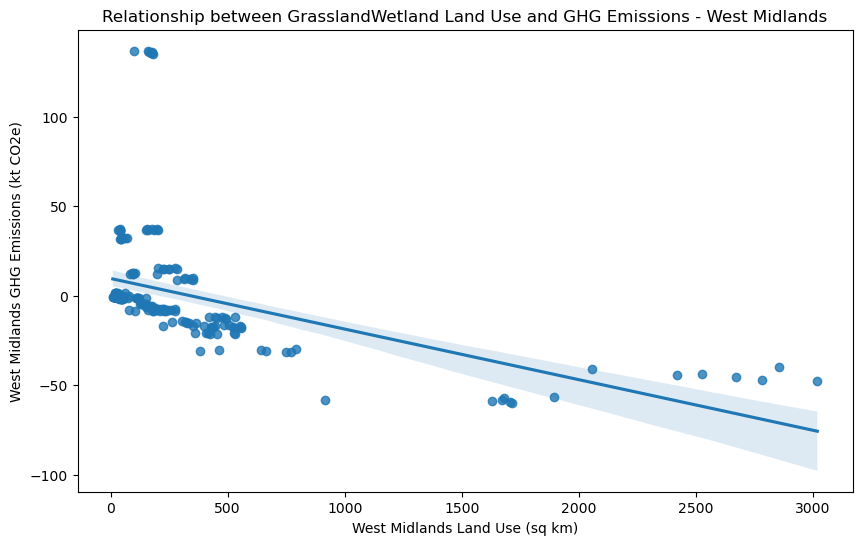

London
Cropland
Correlation coefficient: 0.578
p-value: 9.765e-21
The correlation is statistically significant


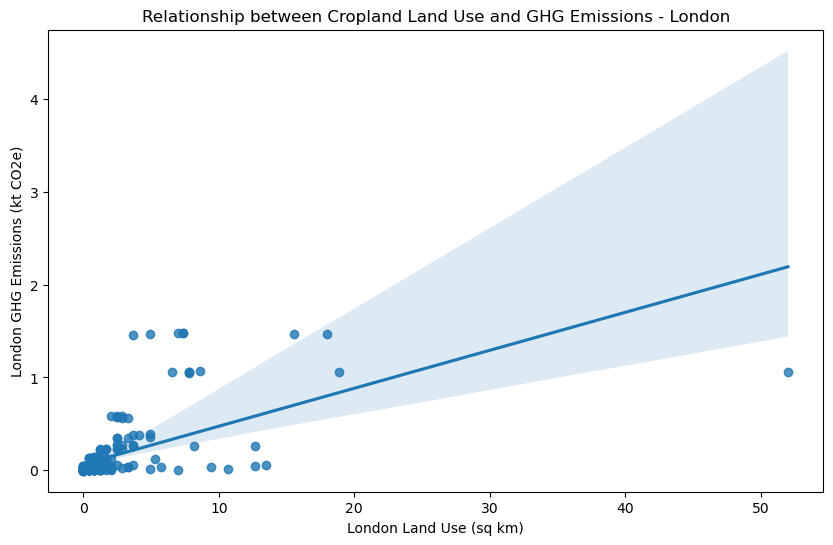

London
Other
Correlation coefficient: -0.0465
p-value: 0.49546797877286164
The correlation is NOT statistically significant


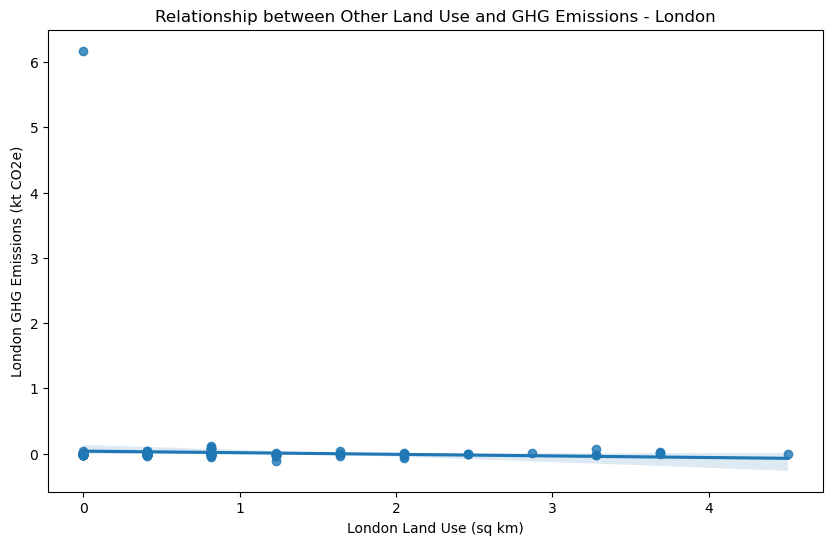

London
ForestLand
Correlation coefficient: -0.362
p-value: 3.914e-08
The correlation is statistically significant


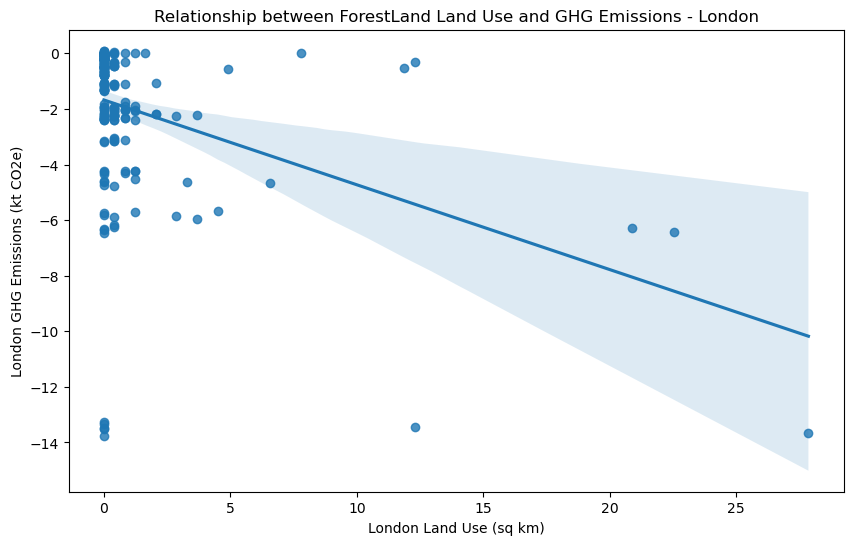

London
Settlements
Correlation coefficient: 0.733
p-value: 6.844e-38
The correlation is statistically significant


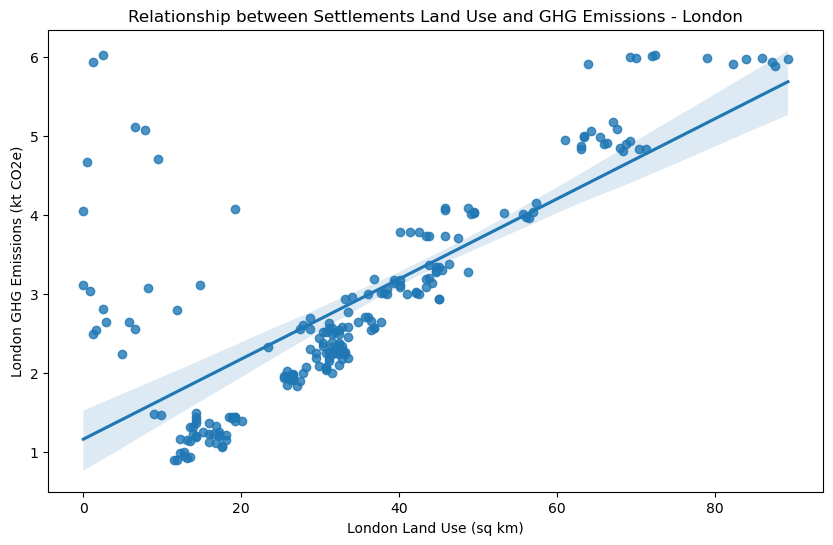

London
GrasslandWetland
Correlation coefficient: -0.863
p-value: 8.900e-66
The correlation is statistically significant


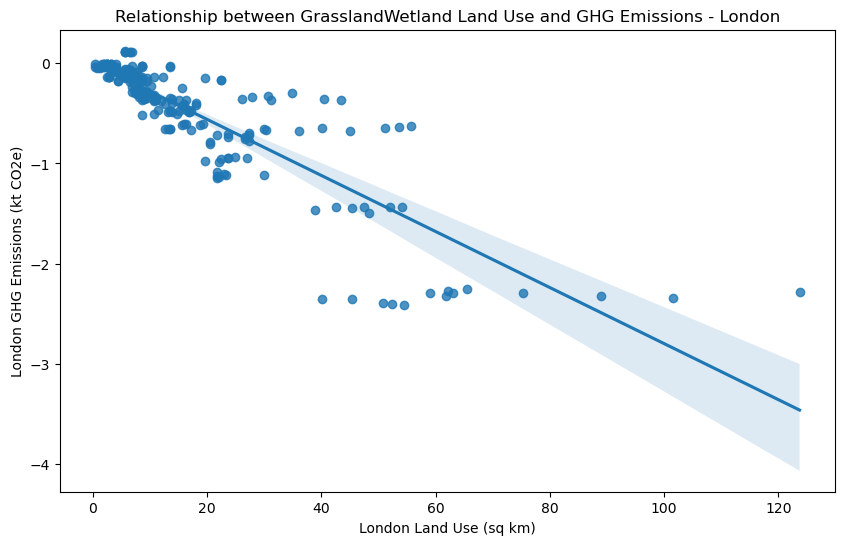

North East
Cropland
Correlation coefficient: 0.828
p-value: 2.551e-22
The correlation is statistically significant


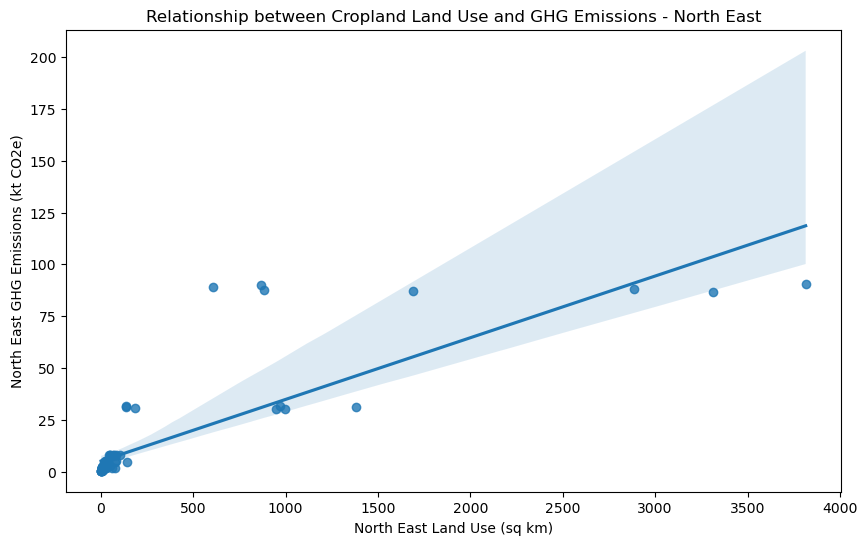

North East
Other
Correlation coefficient: 0.825
p-value: 4.722e-22
The correlation is statistically significant


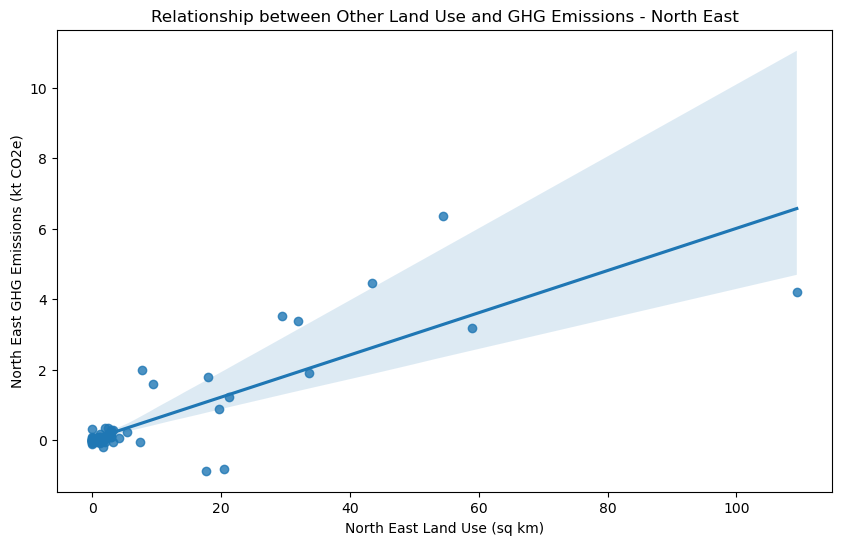

North East
ForestLand
Correlation coefficient: -0.693
p-value: 2.802e-13
The correlation is statistically significant


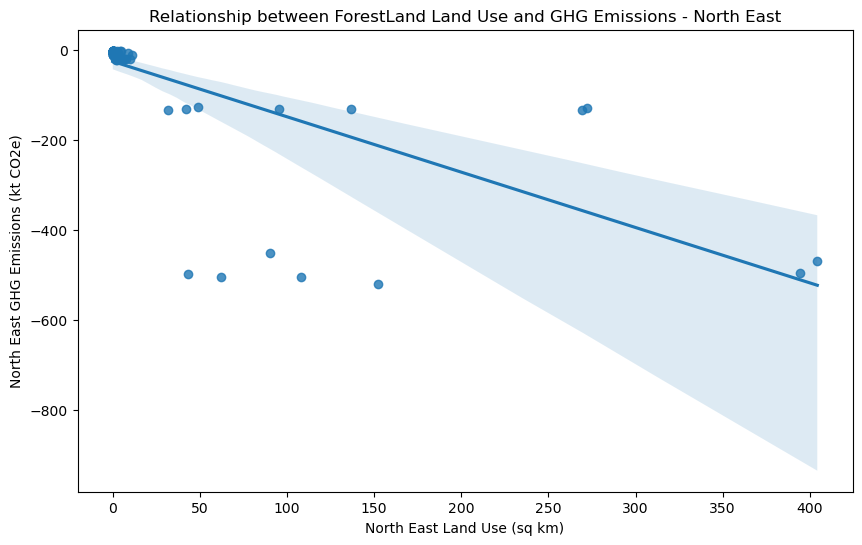

North East
Settlements
Correlation coefficient: 0.547
p-value: 7.253e-08
The correlation is statistically significant


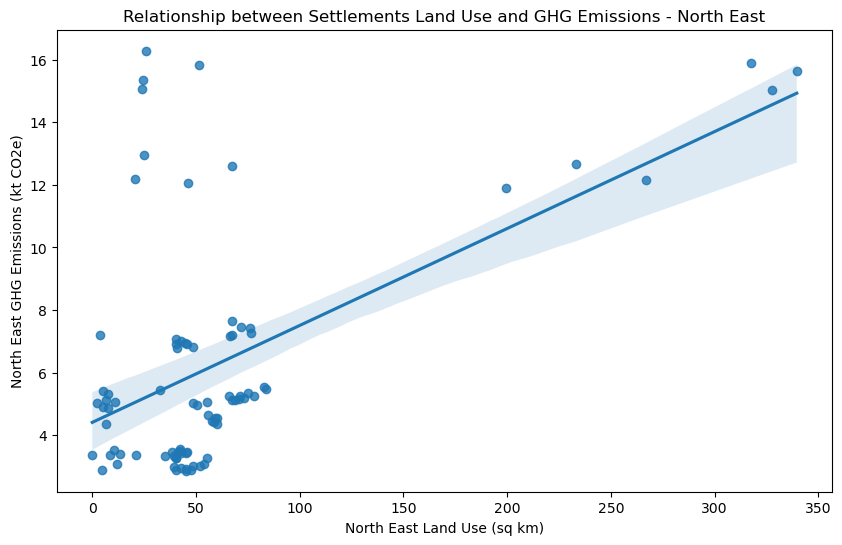

North East
GrasslandWetland
Correlation coefficient: -0.756
p-value: 9.709e-17
The correlation is statistically significant


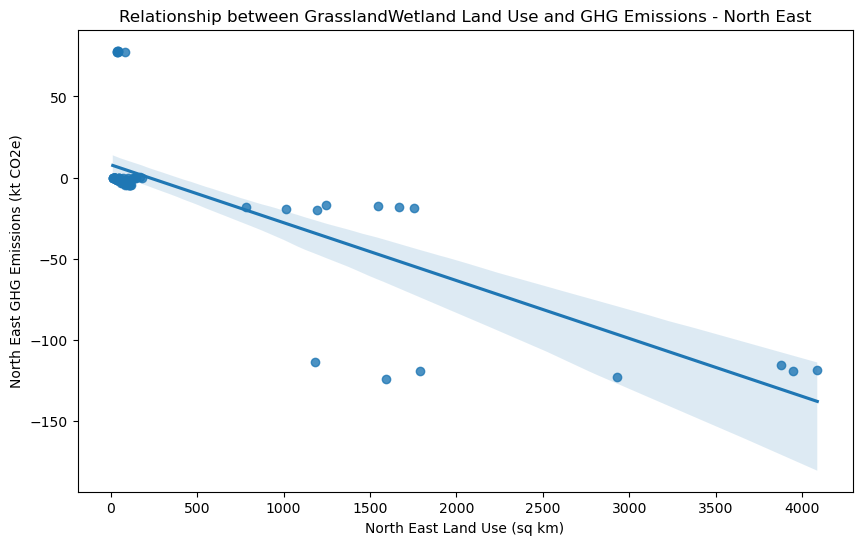

South East
Cropland
Correlation coefficient: 0.801
p-value: 2.607e-98
The correlation is statistically significant


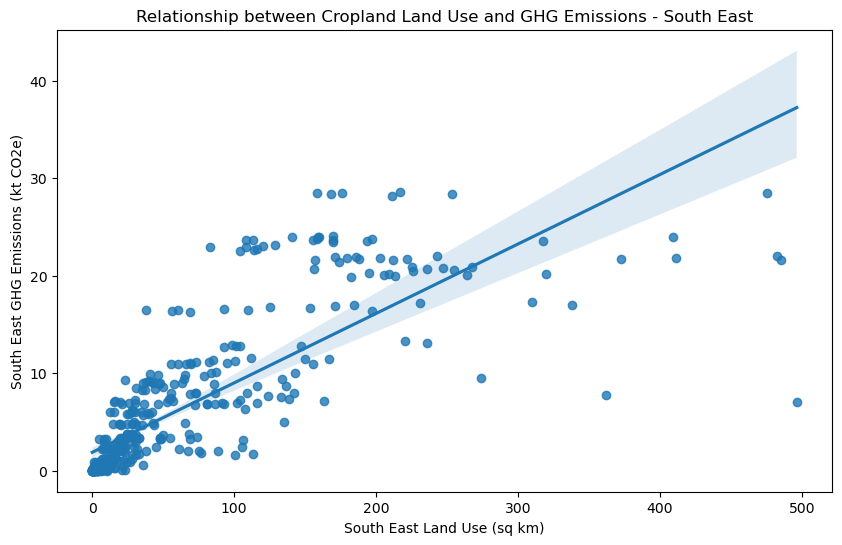

South East
Other
Correlation coefficient: 0.3
p-value: 1.664e-10
The correlation is statistically significant


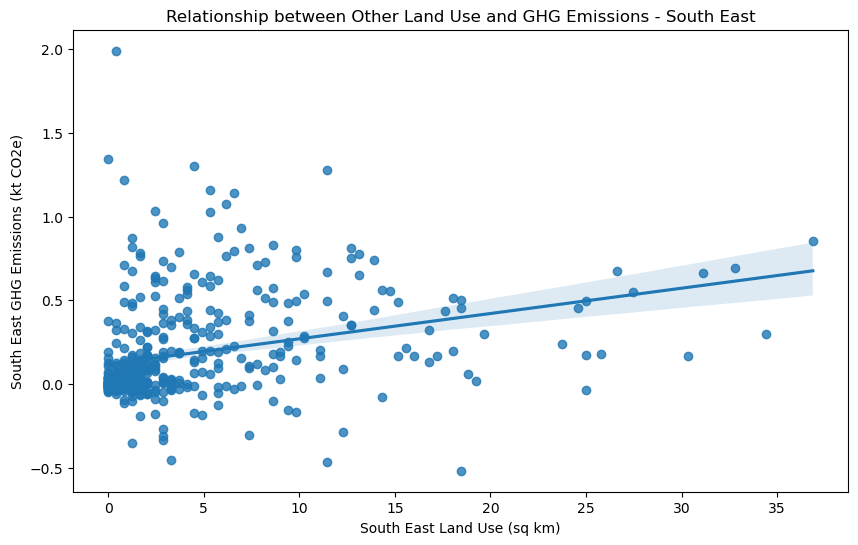

South East
ForestLand
Correlation coefficient: -0.767
p-value: 3.385e-85
The correlation is statistically significant


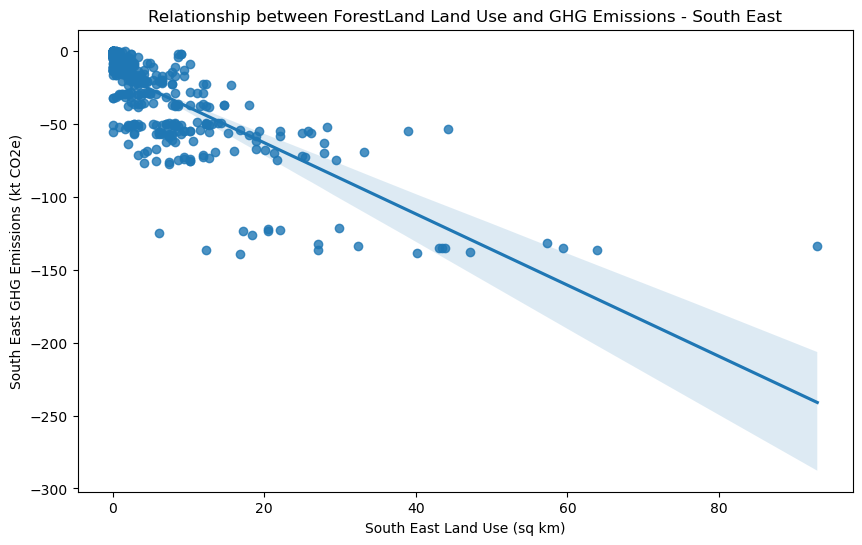

South East
Settlements
Correlation coefficient: 0.534
p-value: 2.331e-33
The correlation is statistically significant


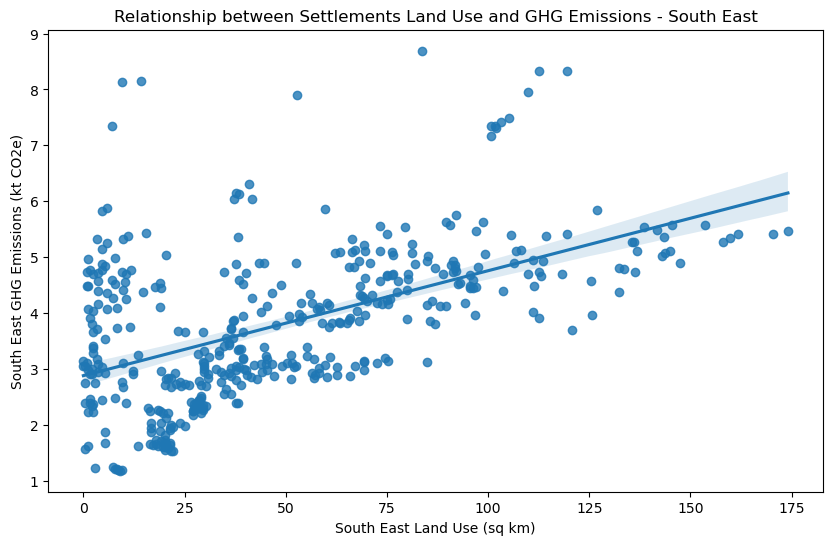

South East
GrasslandWetland
Correlation coefficient: -0.792
p-value: 1.116e-94
The correlation is statistically significant


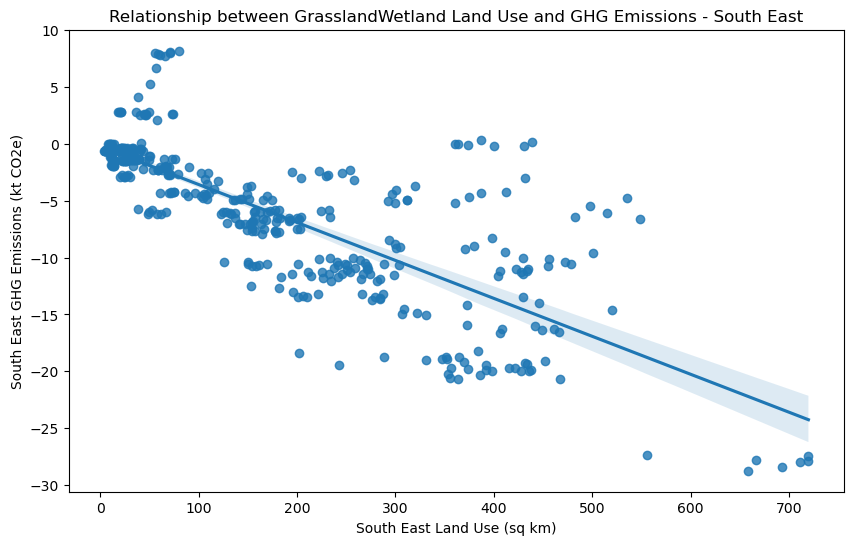

Yorkshire and the Humber
Cropland
Correlation coefficient: 0.96
p-value: 6.536e-55
The correlation is statistically significant


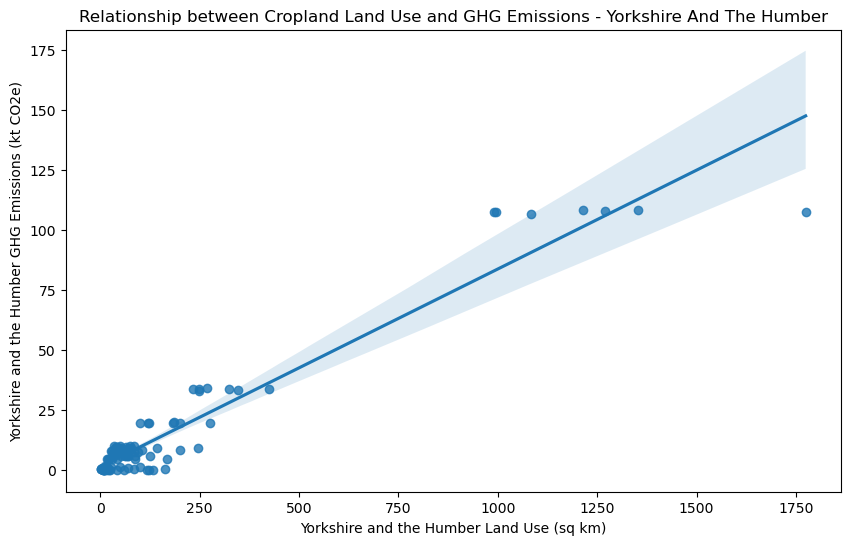

Yorkshire and the Humber
Other
Correlation coefficient: 0.14
p-value: 0.1690264152889639
The correlation is NOT statistically significant


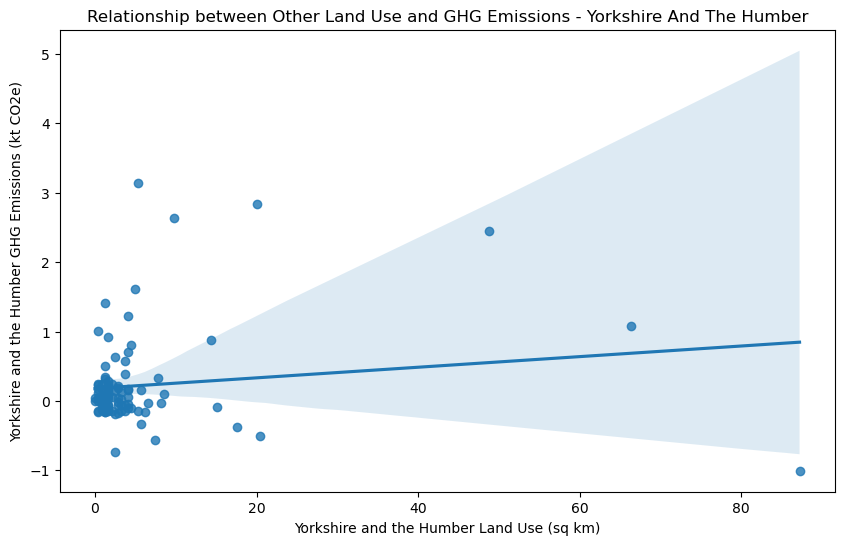

Yorkshire and the Humber
ForestLand
Correlation coefficient: -0.361
p-value: 2.658e-04
The correlation is statistically significant


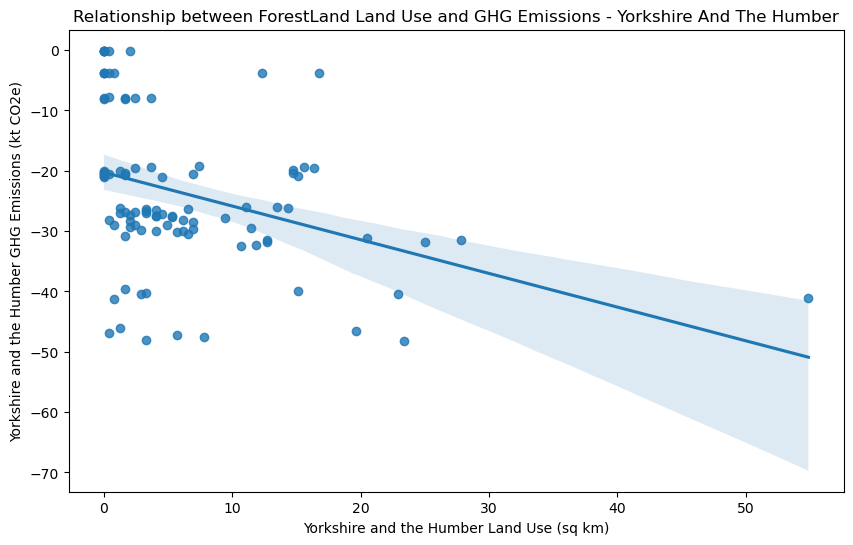

Yorkshire and the Humber
Settlements
Correlation coefficient: 0.469
p-value: 1.099e-06
The correlation is statistically significant


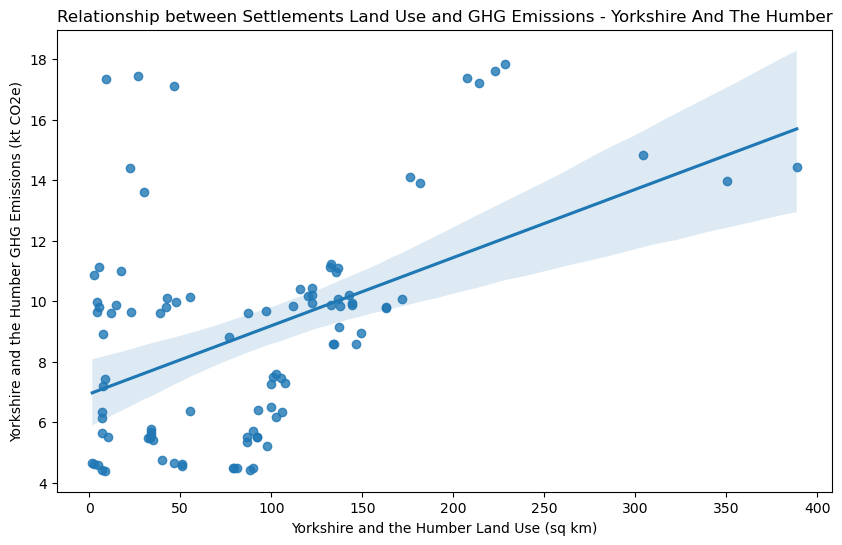

Yorkshire and the Humber
GrasslandWetland
Correlation coefficient: 0.289
p-value: 3.914e-03
The correlation is statistically significant


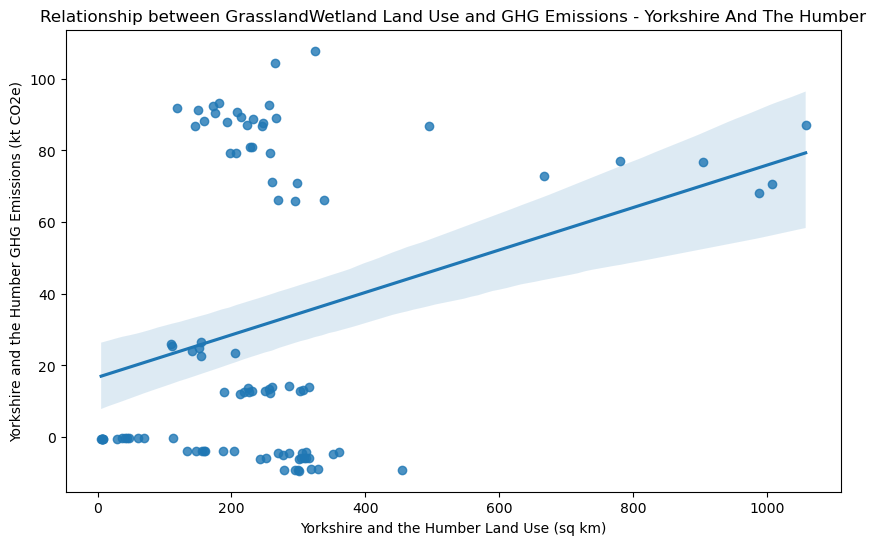

South West
Cropland
Correlation coefficient: 0.889
p-value: 2.242e-53
The correlation is statistically significant


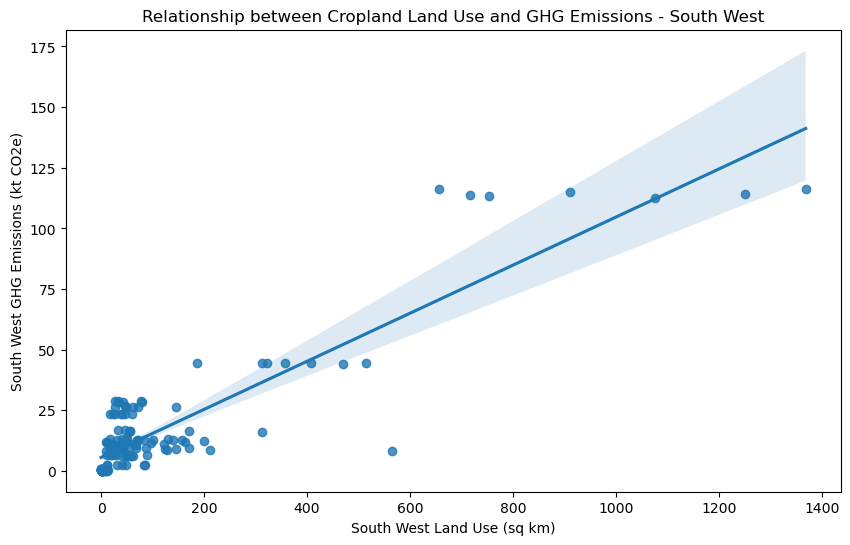

South West
Other
Correlation coefficient: 0.657
p-value: 2.332e-20
The correlation is statistically significant


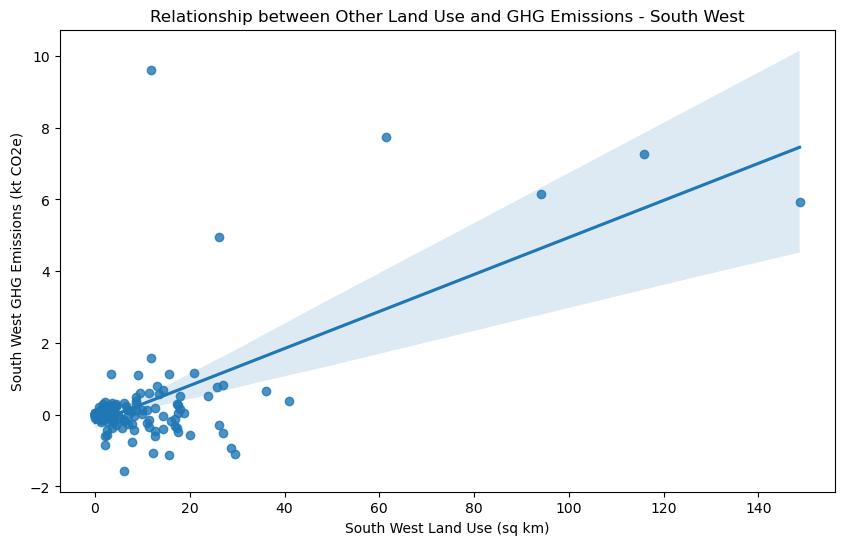

South West
ForestLand
Correlation coefficient: -0.665
p-value: 5.159e-21
The correlation is statistically significant


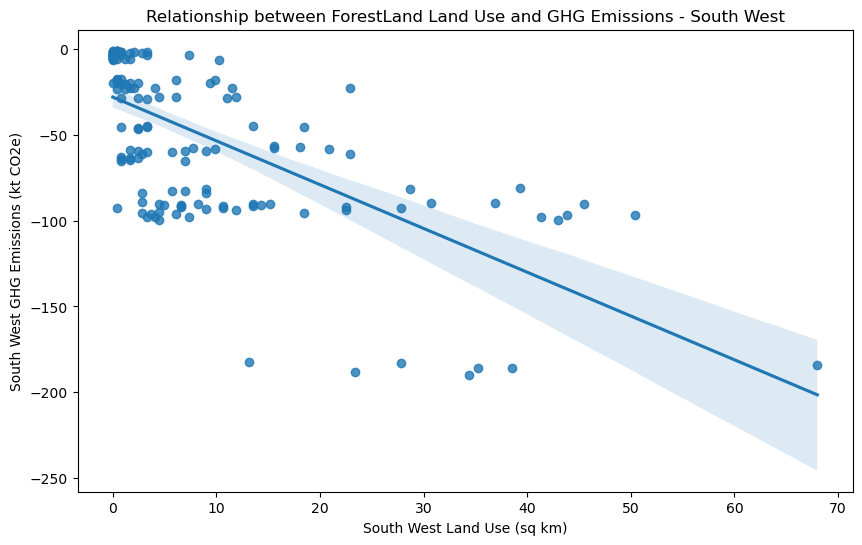

South West
Settlements
Correlation coefficient: 0.714
p-value: 2.465e-25
The correlation is statistically significant


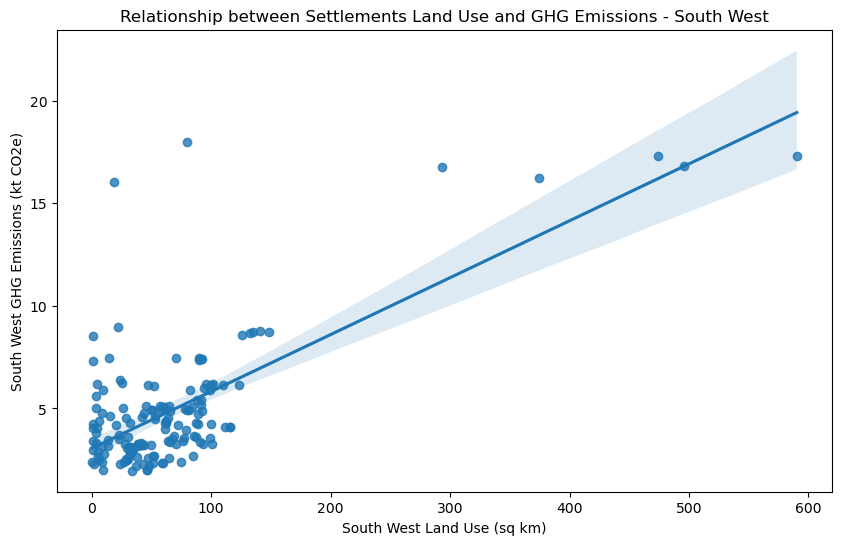

South West
GrasslandWetland
Correlation coefficient: -0.88
p-value: 5.930e-51
The correlation is statistically significant


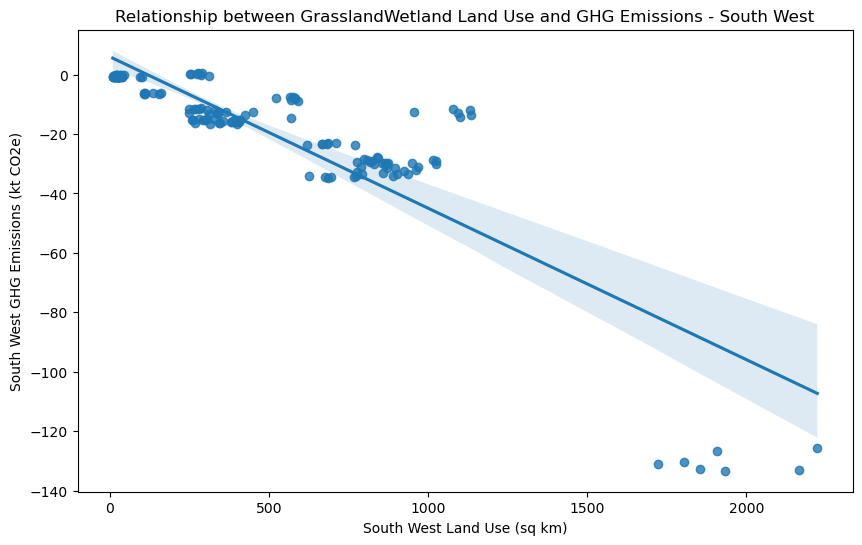

North West
Cropland
Correlation coefficient: 0.358
p-value: 2.086e-08
The correlation is statistically significant


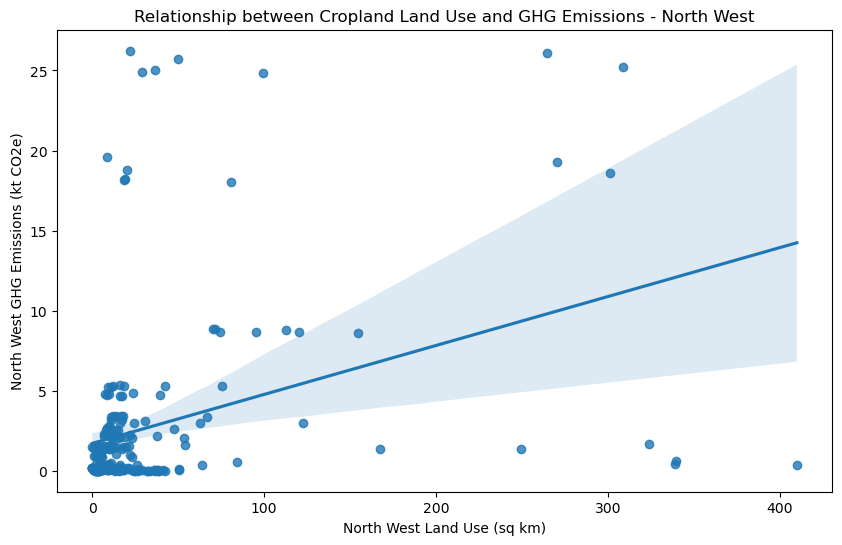

North West
Other
Correlation coefficient: 0.0179
p-value: 0.786852359549159
The correlation is NOT statistically significant


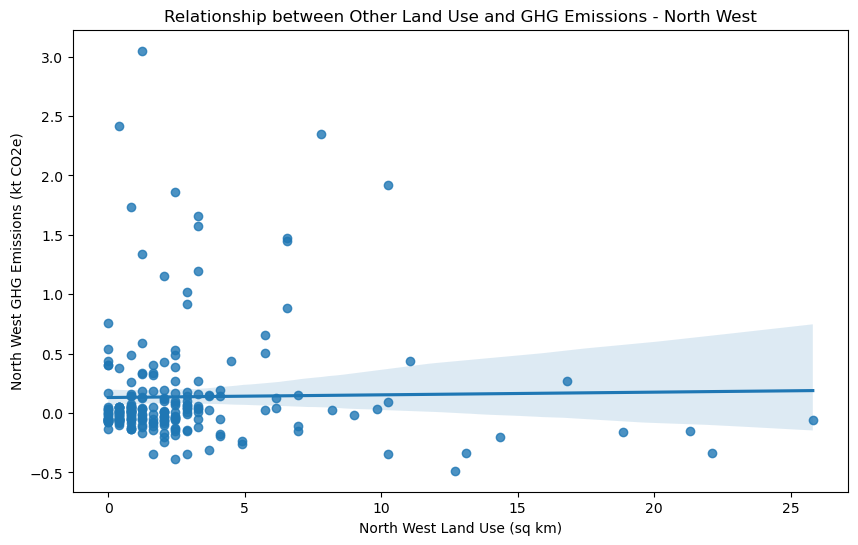

North West
ForestLand
Correlation coefficient: -0.516
p-value: 3.748e-17
The correlation is statistically significant


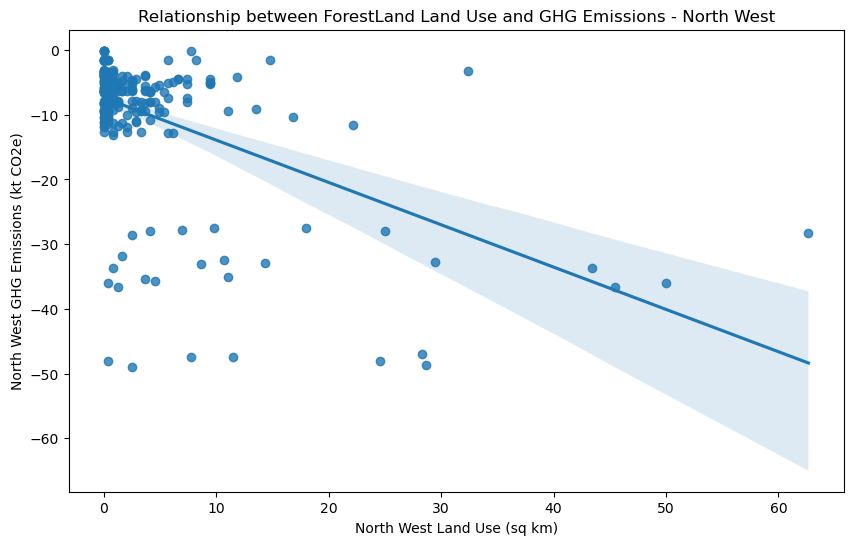

North West
Settlements
Correlation coefficient: 0.584
p-value: 1.507e-22
The correlation is statistically significant


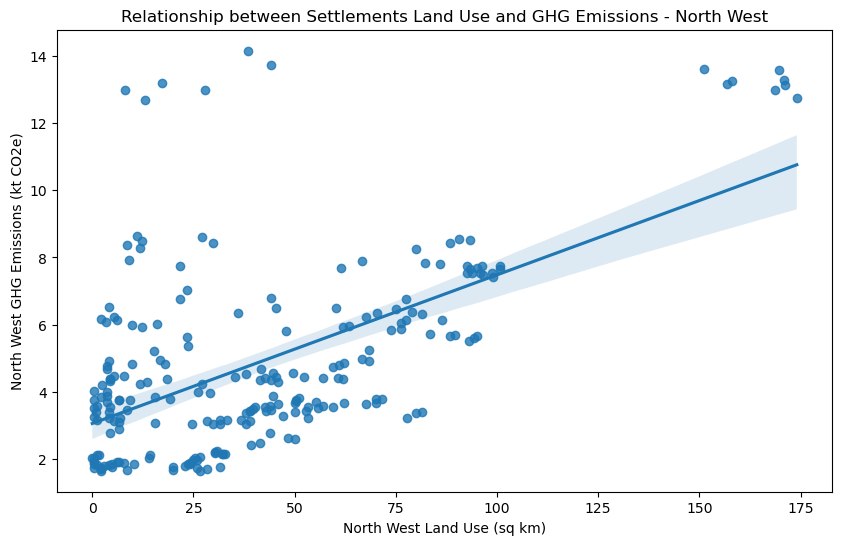

North West
GrasslandWetland
Correlation coefficient: -0.18
p-value: 5.966e-03
The correlation is statistically significant


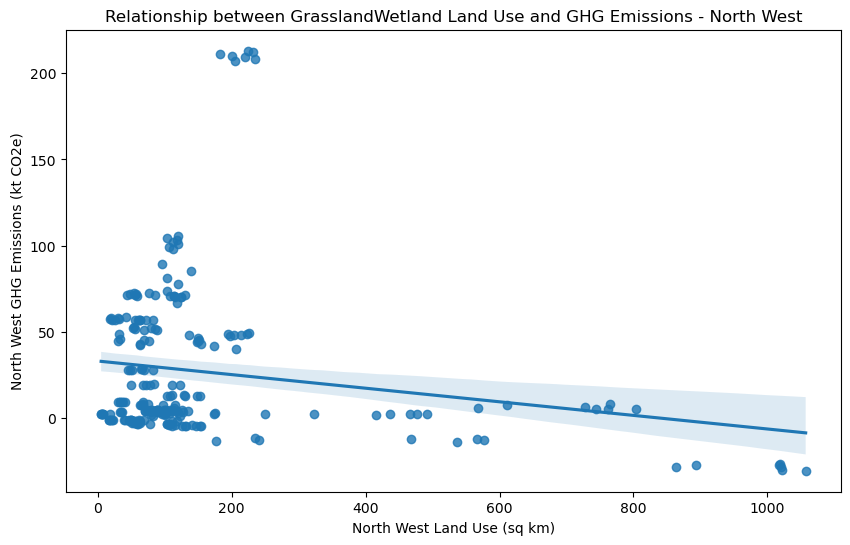

Wales
Cropland
Correlation coefficient: 0.278
p-value: 4.862e-04
The correlation is statistically significant


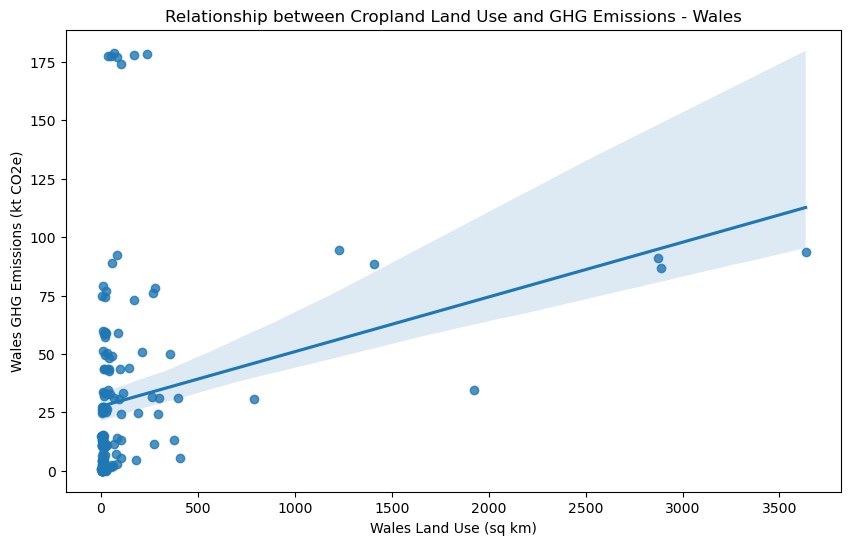

Wales
Other
Correlation coefficient: 0.561
p-value: 3.960e-14
The correlation is statistically significant


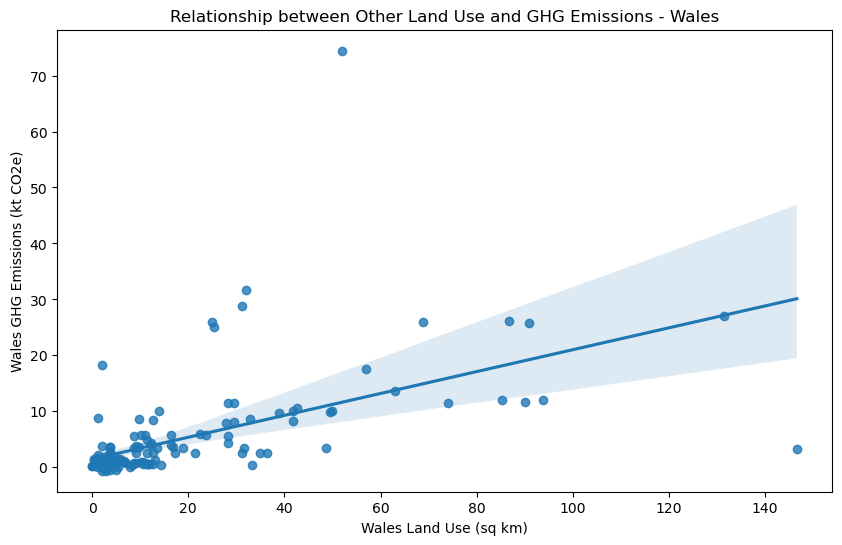

Wales
ForestLand
Correlation coefficient: -0.638
p-value: 5.626e-19
The correlation is statistically significant


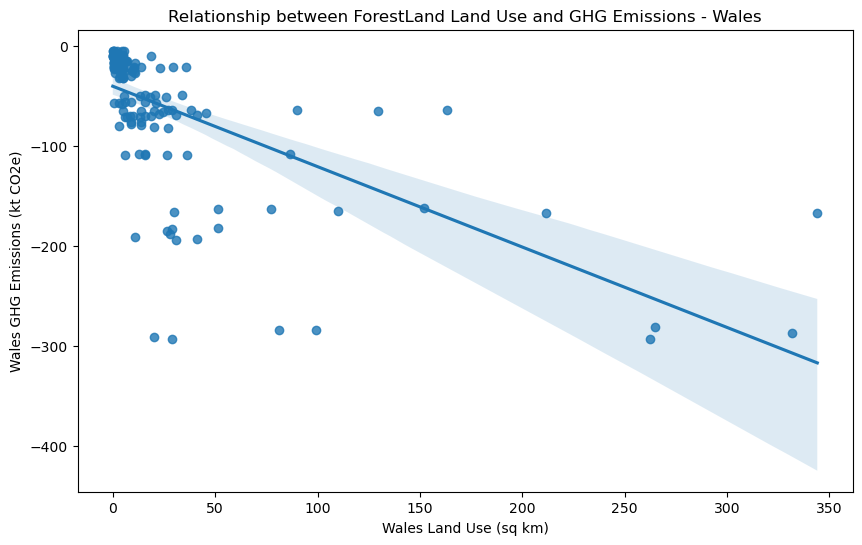

Wales
Settlements
Correlation coefficient: 0.623
p-value: 6.075e-18
The correlation is statistically significant


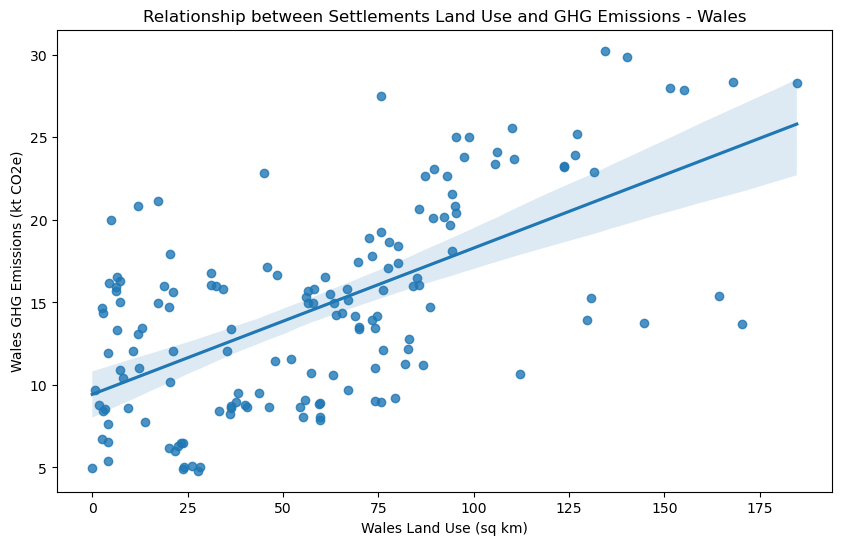

Wales
GrasslandWetland
Correlation coefficient: -0.567
p-value: 1.683e-14
The correlation is statistically significant


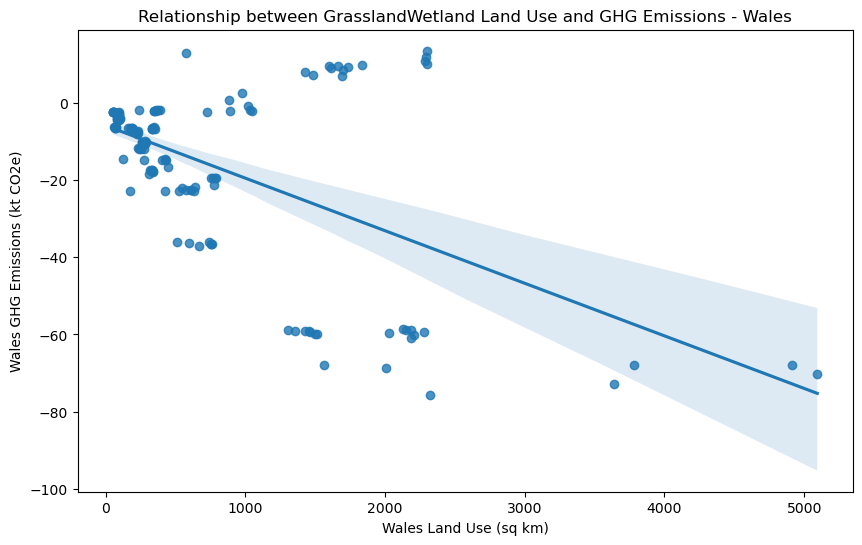

Northern Ireland
Cropland
Correlation coefficient: 0.308
p-value: 0.5008708958976889
The correlation is NOT statistically significant


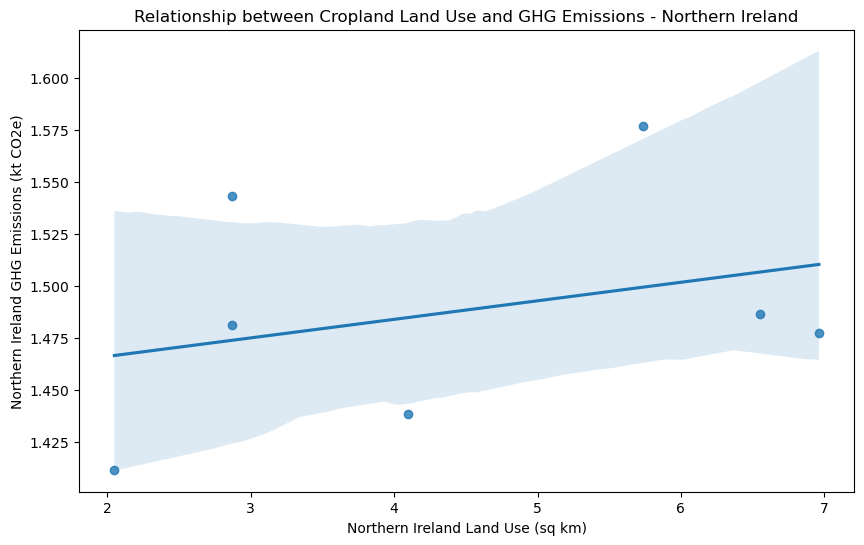

Northern Ireland
Other
Correlation coefficient: 0.198
p-value: 0.6706543600186198
The correlation is NOT statistically significant


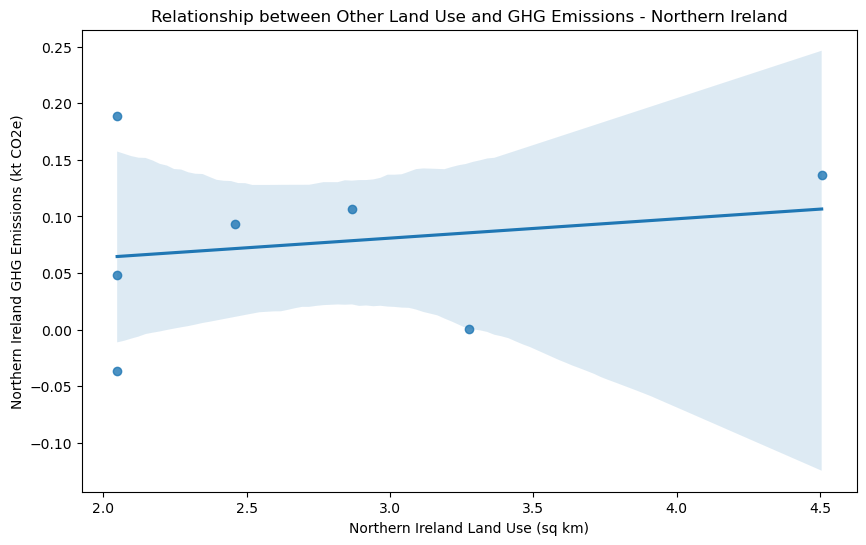

Northern Ireland
ForestLand
Correlation coefficient: 0.29
p-value: 0.5275161574800732
The correlation is NOT statistically significant


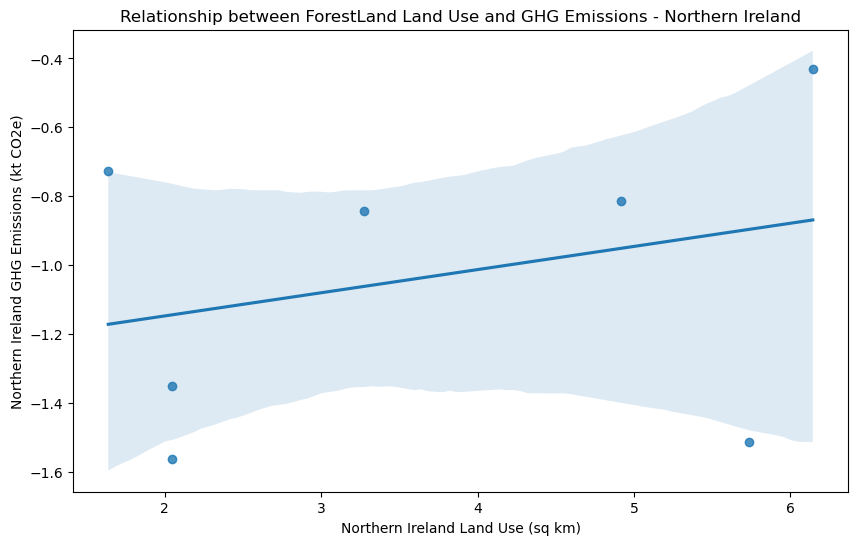

Northern Ireland
Settlements
Correlation coefficient: 0.267
p-value: 0.563083307353336
The correlation is NOT statistically significant


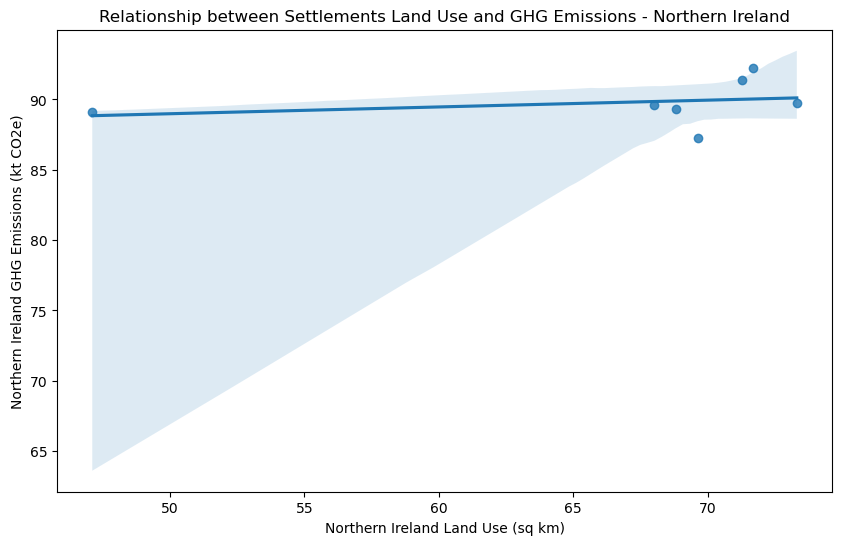

Northern Ireland
GrasslandWetland
Correlation coefficient: 0.266
p-value: 0.5639480897561417
The correlation is NOT statistically significant


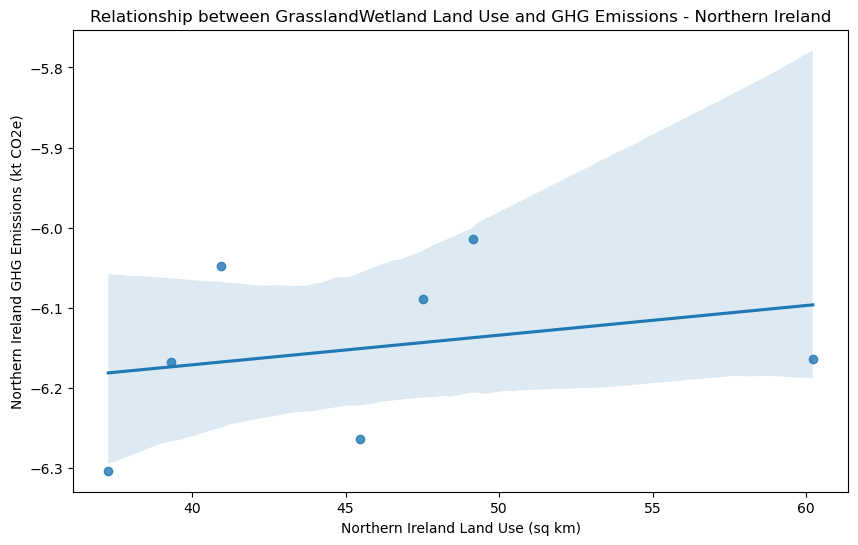

East Midlands
Cropland
Correlation coefficient: 0.924
p-value: 8.485e-98
The correlation is statistically significant


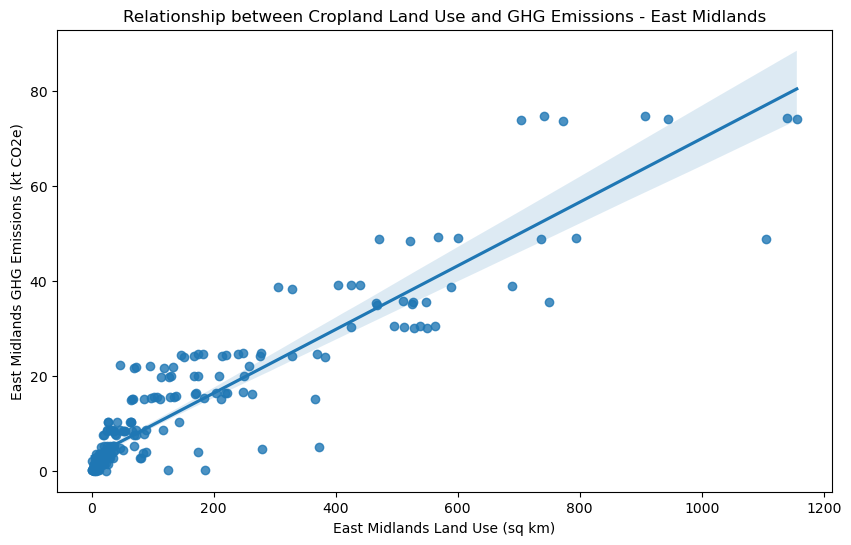

East Midlands
Other
Correlation coefficient: 0.0257
p-value: 0.6974916825859172
The correlation is NOT statistically significant


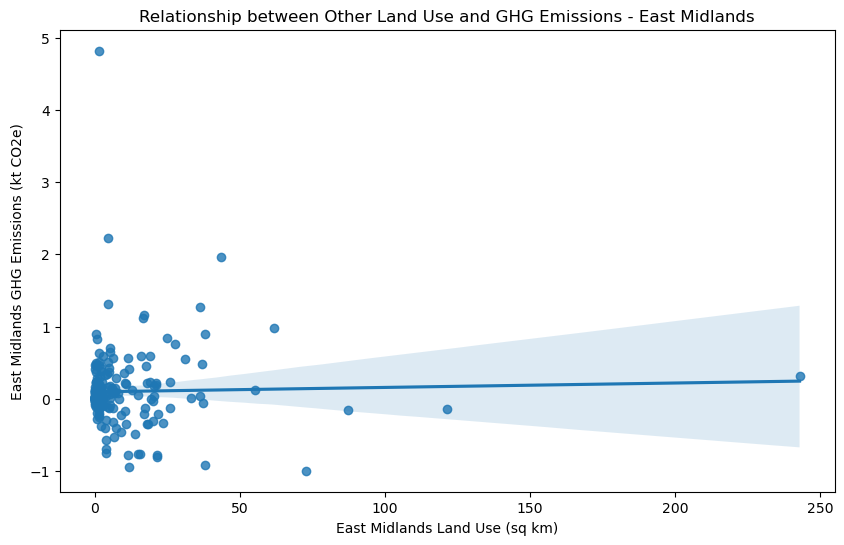

East Midlands
ForestLand
Correlation coefficient: -0.486
p-value: 4.569e-15
The correlation is statistically significant


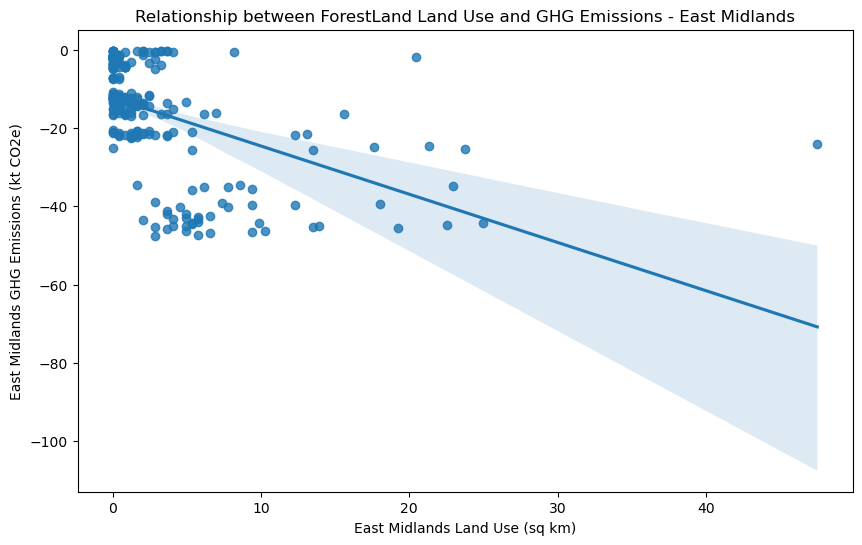

East Midlands
Settlements
Correlation coefficient: 0.47
p-value: 4.158e-14
The correlation is statistically significant


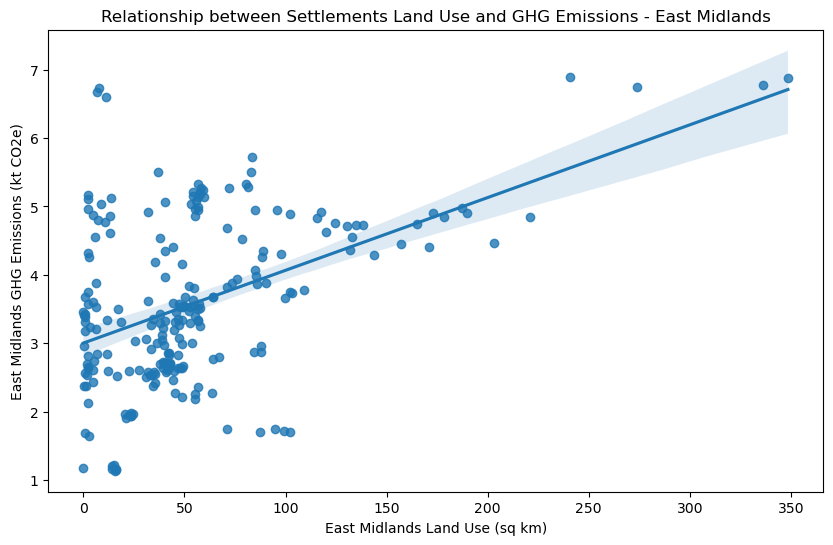

East Midlands
GrasslandWetland
Correlation coefficient: 0.402
p-value: 2.263e-10
The correlation is statistically significant


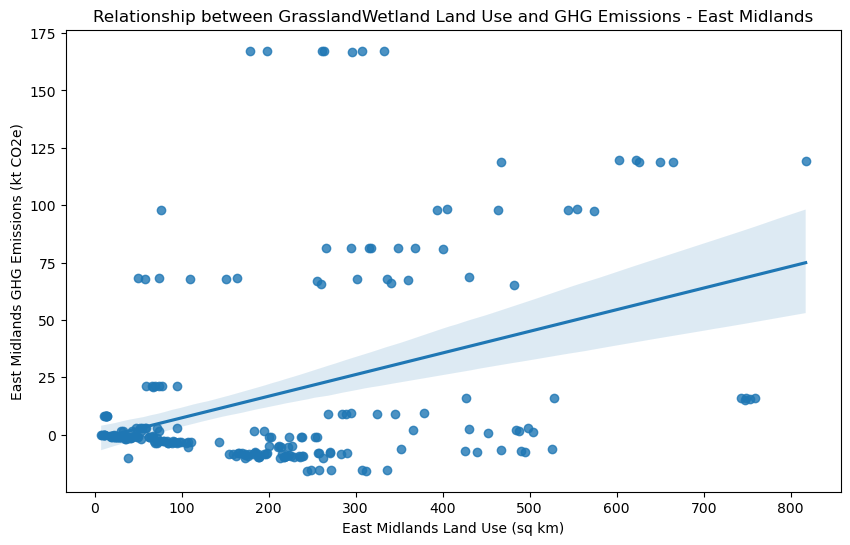

In [100]:
for i in region_list:
    
    lulucf_cat = set(land_use_ghg_df_longform['LULUCF_category'].to_list())

    for j in lulucf_cat:
        print(i)
        
        filtered_data = land_use_ghg_df[land_use_ghg_df['Region'] == i]
        
        x = filtered_data[f'{j}_LandUse']
        y = filtered_data[f'{j}_GHG']
        
        print(j)
        print(f'Correlation coefficient: {x.corr(y):.3}')
        p_value = pearsonr(x, y)[1]
        if p_value < 0.05:
            print(f'p-value: {p_value:.3e}')
            print('The correlation is statistically significant')
        else:
            print(f'p-value: {p_value}')
            print('The correlation is NOT statistically significant')


        #data = filtered_data[filtered_data['LULUCF_category']==j]
        plt.figure(figsize=(10, 6))
        sns.regplot(data=filtered_data, x=f'{j}_LandUse',y=f'{j}_GHG')
        plt.xlabel(f"{i} Land Use (sq km)")
        plt.ylabel(f"{i} GHG Emissions (kt CO2e)")
        plt.title(f"Relationship between {j} Land Use and GHG Emissions - {i.title()}")
        plt.show()

# Multiple linear regression

#### more concise version

In [101]:
## more concise 

for cat in region_list:
    
    print(cat)
    
    filtered_data = land_use_ghg_df[land_use_ghg_df['Region'] == cat]

    X = filtered_data[['Cropland_LandUse', 'ForestLand_LandUse', 'GrasslandWetland_LandUse', 
                       'Other_LandUse', 'Settlements_LandUse']]

    X = sm.add_constant(X)

    ghg_categories = ['Cropland_GHG', 'ForestLand_GHG', 'GrasslandWetland_GHG',
                      'Other_GHG', 'Settlements_GHG']

    for ghg in ghg_categories:
        y = filtered_data[ghg]  
        model = sm.OLS(y, X).fit()

        print(f"\nSummary for {ghg} in {cat} Areas:")
        print(f"R-squared: {model.rsquared:.3f}")
        print("Coefficients and p-values:")
        for var, coef, pval in zip(model.params.index, model.params, model.pvalues):
            print(f" - {var}: Coef = {coef:.4f}, p = {pval:.4f}")
        print("\n" + "-"*80 + "\n")

East of England

Summary for Cropland_GHG in East of England Areas:
R-squared: 0.970
Coefficients and p-values:
 - const: Coef = -1.5007, p = 0.0000
 - Cropland_LandUse: Coef = 0.0349, p = 0.0000
 - ForestLand_LandUse: Coef = -0.0663, p = 0.0183
 - GrasslandWetland_LandUse: Coef = 0.0405, p = 0.0000
 - Other_LandUse: Coef = 0.1074, p = 0.0000
 - Settlements_LandUse: Coef = 0.0275, p = 0.0000

--------------------------------------------------------------------------------


Summary for ForestLand_GHG in East of England Areas:
R-squared: 0.761
Coefficients and p-values:
 - const: Coef = 4.0149, p = 0.0005
 - Cropland_LandUse: Coef = -0.0114, p = 0.0814
 - ForestLand_LandUse: Coef = -1.5858, p = 0.0000
 - GrasslandWetland_LandUse: Coef = -0.0718, p = 0.0000
 - Other_LandUse: Coef = -0.1594, p = 0.0916
 - Settlements_LandUse: Coef = -0.0008, p = 0.9672

--------------------------------------------------------------------------------


Summary for GrasslandWetland_GHG in East of England Ar

# Results for Research Q4

### Using counterfactual scenarios, how have land use changes over time effected LULUCF GHG emissions?

* Calculate the emission factor for each year per local authority by dividing the land use by the GHG emission
* Using 2016 as the baseline, hold these land use proportions across the subsequent years
* Get the counterfactual GHG emissions by multiplying the baseline land use by the GHG emission factor


### Method 4

Doing it with sumarised figures instead of with whole data set. This fixes issue of some data points being zeros on the indivisual LA lines.


Calcualte EF before fixing land use as this will show how eahc land use category emits or absorbs GHGs. Therefore emission Factor needs to be calcualted using both the actual Land use for each year and the actual GHG.

After calculating these you then fix the land use for each category. And then multiply the fixed land use by the emissions Factor

In [102]:
counterfactual_df = land_use_ghg_df.groupby(['year'])[['Cropland_LandUse','ForestLand_LandUse','GrasslandWetland_LandUse','Other_LandUse',
                                   'Settlements_LandUse','Cropland_GHG','ForestLand_GHG','GrasslandWetland_GHG',
                                   'Other_GHG','Settlements_GHG']].sum().reset_index()

In [103]:
counterfactual_df

,year,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG
0,2016,42148.2496,3614.7200,106436.6080,2456.3712,18632.7040,7897.454681,-13093.000836,4655.076797,122.771397,2347.390645
1,2017,49117.1840,4332.7488,107163.2384,2667.3152,10002.4320,7849.900316,-13206.945587,4578.351697,58.665090,2327.286287
2,2018,28203.4176,3545.9072,113702.5024,2732.0320,25102.7456,7768.391733,-13160.362566,4407.615956,128.350372,2355.996582
3,2019,47750.3488,7727.9232,101345.2800,2718.1056,13751.9104,7723.572746,-12709.463914,4368.360642,146.948686,2356.297804
4,2020,41934.0288,3166.6176,101921.5872,2467.4304,23804.3136,7712.948548,-12939.287100,4279.621381,227.813982,2364.682810
5,2021,44597.2480,5890.8672,102412.2880,2918.4000,17475.5840,7670.472214,-12585.918961,4179.758746,146.858103,2330.904425
6,2022,43797.7088,5171.2000,104435.3024,2343.7312,17549.3120,7614.194492,-12347.014931,4094.651946,177.496962,2339.316232


In [104]:
# calculates the emission factor by dividing actual GHG by actual land use
# avoids divide by 0 errors, replaces 0 with nan first as this was causing issues with land etnries that were 0
for category in ['Cropland', 'ForestLand', 'GrasslandWetland', 'Other', 'Settlements']:
    counterfactual_df[f'{category}_EF'] = (counterfactual_df[f'{category}_GHG']
                                           .div(counterfactual_df[f'{category}_LandUse'].replace(0, np.nan))
                                           .replace([np.inf, -np.inf], 0).fillna(0))

In [105]:
# extract the 2016 data for each local_authority and put it in a dict
# loop through rows (except 2016) nd update the values in cols from cols_to_update
# apply update across the df

#counterfactual_df = land_use_ghg_df.copy()  # copy the land use df

cols_to_update = ['Cropland_LandUse','ForestLand_LandUse','GrasslandWetland_LandUse',
                  'Other_LandUse','Settlements_LandUse']  # list of cols to update

# gets the 2016 values
values_2016 = counterfactual_df.loc[counterfactual_df['year'] == 2016, cols_to_update].iloc[0]

# assigns 2016 values to all rows
counterfactual_df.loc[:, cols_to_update] = values_2016.values

counterfactual_df

,year,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG,Cropland_EF,ForestLand_EF,GrasslandWetland_EF,Other_EF,Settlements_EF
0,2016,42148.2496,3614.72,106436.608,2456.3712,18632.704,7897.454681,-13093.000836,4655.076797,122.771397,2347.390645,0.187373,-3.622134,0.043736,0.049981,0.125982
1,2017,42148.2496,3614.72,106436.608,2456.3712,18632.704,7849.900316,-13206.945587,4578.351697,58.665090,2327.286287,0.159820,-3.048168,0.042723,0.021994,0.232672
2,2018,42148.2496,3614.72,106436.608,2456.3712,18632.704,7768.391733,-13160.362566,4407.615956,128.350372,2355.996582,0.275442,-3.711423,0.038764,0.046980,0.093854
3,2019,42148.2496,3614.72,106436.608,2456.3712,18632.704,7723.572746,-12709.463914,4368.360642,146.948686,2356.297804,0.161749,-1.644616,0.043104,0.054063,0.171343
4,2020,42148.2496,3614.72,106436.608,2456.3712,18632.704,7712.948548,-12939.287100,4279.621381,227.813982,2364.682810,0.183931,-4.086154,0.041989,0.092328,0.099338
5,2021,42148.2496,3614.72,106436.608,2456.3712,18632.704,7670.472214,-12585.918961,4179.758746,146.858103,2330.904425,0.171994,-2.136514,0.040813,0.050321,0.133381
6,2022,42148.2496,3614.72,106436.608,2456.3712,18632.704,7614.194492,-12347.014931,4094.651946,177.496962,2339.316232,0.173849,-2.387650,0.039208,0.075733,0.133300


In [106]:
# Claculates the counterfactual position by multiply fixed land use by the emission factor 
for category in ['Cropland', 'ForestLand', 'GrasslandWetland', 'Other', 'Settlements']:
    counterfactual_df[f'{category}_GHG_CF'] = counterfactual_df[f'{category}_LandUse'] * counterfactual_df[f'{category}_EF']

In [107]:
# calculates change by subtracting the counterractual GHG from actual GHG
for category in ['Cropland', 'ForestLand', 'GrasslandWetland', 'Other', 'Settlements']:
    counterfactual_df[f'{category}_GHG_Change'] = counterfactual_df[f'{category}_GHG'] - counterfactual_df[f'{category}_GHG_CF']

In [108]:
counterfactual_df

,year,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG,Cropland_EF,ForestLand_EF,GrasslandWetland_EF,Other_EF,Settlements_EF,Cropland_GHG_CF,ForestLand_GHG_CF,GrasslandWetland_GHG_CF,Other_GHG_CF,Settlements_GHG_CF,Cropland_GHG_Change,ForestLand_GHG_Change,GrasslandWetland_GHG_Change,Other_GHG_Change,Settlements_GHG_Change
0,2016,42148.2496,3614.72,106436.608,2456.3712,18632.704,7897.454681,-13093.000836,4655.076797,122.771397,2347.390645,0.187373,-3.622134,0.043736,0.049981,0.125982,7897.454681,-13093.000836,4655.076797,122.771397,2347.390645,0.000000,0.000000,0.000000,0.000000,0.000000
1,2017,42148.2496,3614.72,106436.608,2456.3712,18632.704,7849.900316,-13206.945587,4578.351697,58.665090,2327.286287,0.159820,-3.048168,0.042723,0.021994,0.232672,6736.126360,-11018.273285,4547.307753,54.025575,4335.309304,1113.773956,-2188.672302,31.043944,4.639515,-2008.023017
2,2018,42148.2496,3614.72,106436.608,2456.3712,18632.704,7768.391733,-13160.362566,4407.615956,128.350372,2355.996582,0.275442,-3.711423,0.038764,0.046980,0.093854,11609.377217,-13415.755994,4125.957493,115.399878,1748.756397,-3840.985485,255.393429,281.658463,12.950495,607.240186
3,2019,42148.2496,3614.72,106436.608,2456.3712,18632.704,7723.572746,-12709.463914,4368.360642,146.948686,2356.297804,0.161749,-1.644616,0.043104,0.054063,0.171343,6817.438618,-5944.825306,4587.815922,132.798564,3192.589119,906.134129,-6764.638608,-219.455280,14.150122,-836.291316
4,2020,42148.2496,3614.72,106436.608,2456.3712,18632.704,7712.948548,-12939.287100,4279.621381,227.813982,2364.682810,0.183931,-4.086154,0.041989,0.092328,0.099338,7752.350296,-14770.302504,4469.204178,226.792903,1850.943304,-39.401747,1831.015404,-189.582797,1.021079,513.739506
5,2021,42148.2496,3614.72,106436.608,2456.3712,18632.704,7670.472214,-12585.918961,4179.758746,146.858103,2330.904425,0.171994,-2.136514,0.040813,0.050321,0.133381,7249.258462,-7722.899098,4344.003556,123.608146,2485.241821,421.213752,-4863.019863,-164.244809,23.249956,-154.337396
6,2022,42148.2496,3614.72,106436.608,2456.3712,18632.704,7614.194492,-12347.014931,4094.651946,177.496962,2339.316232,0.173849,-2.387650,0.039208,0.075733,0.133300,7327.437410,-8630.685685,4173.118228,186.027487,2483.731950,286.757082,-3716.329247,-78.466282,-8.530525,-144.415718


## Analysis of counterfactual results

### Actual vs Counterfactual line charts

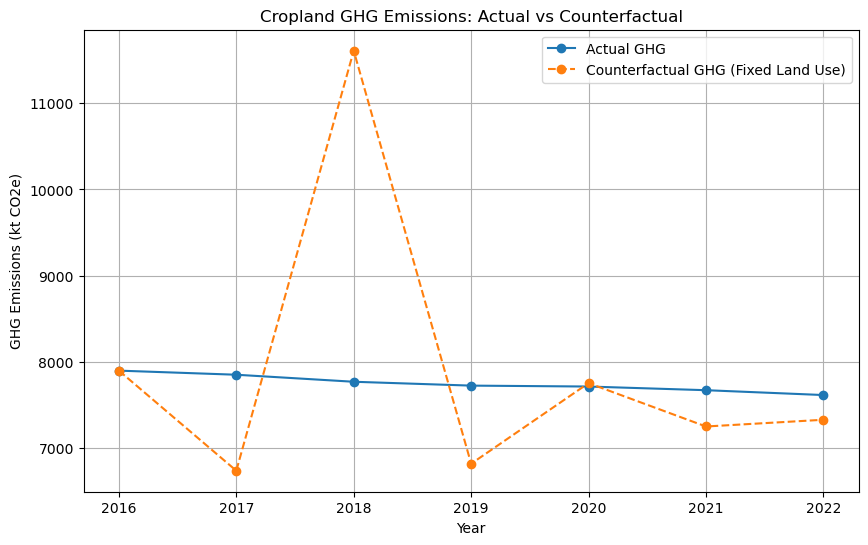

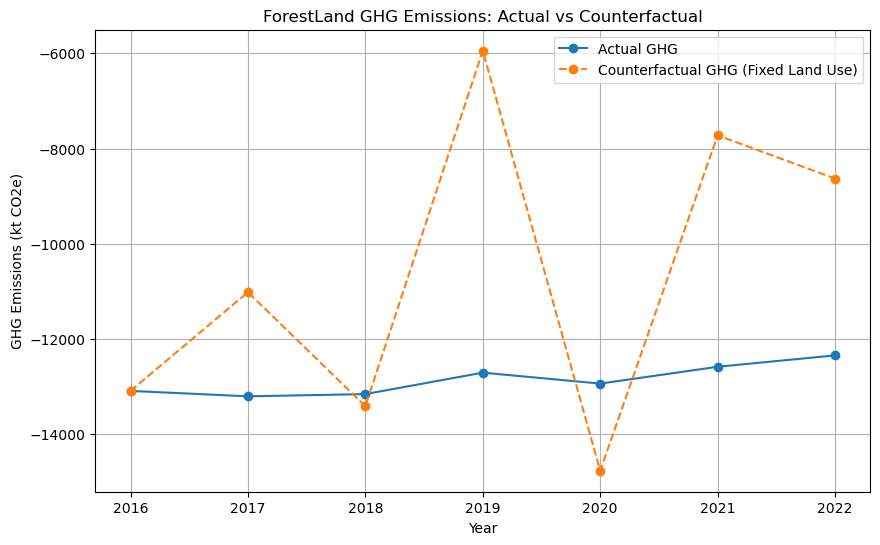

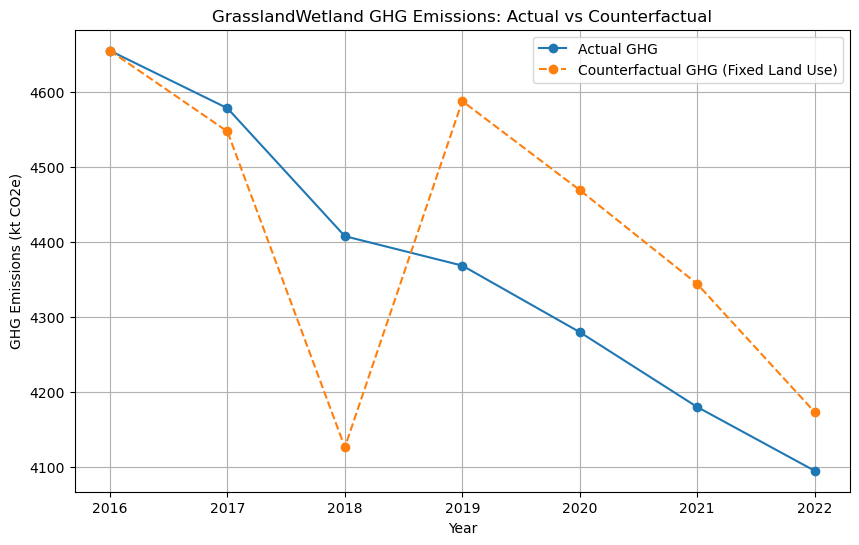

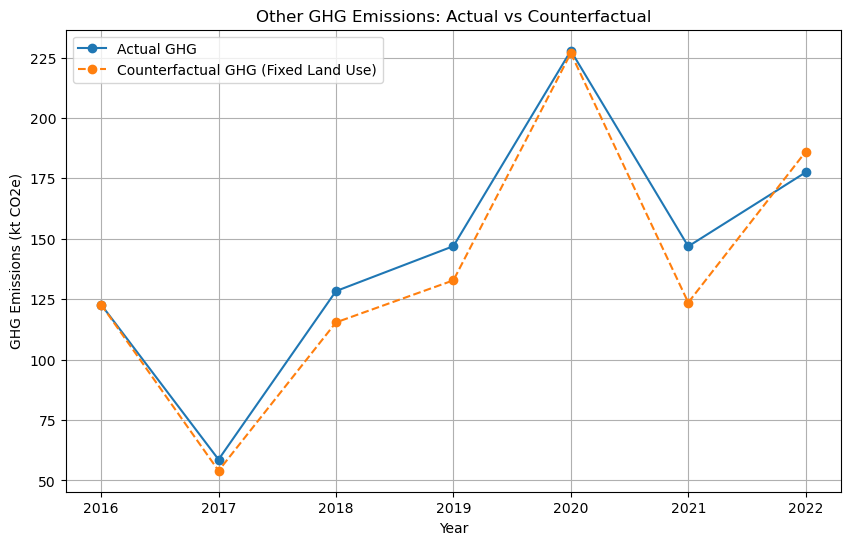

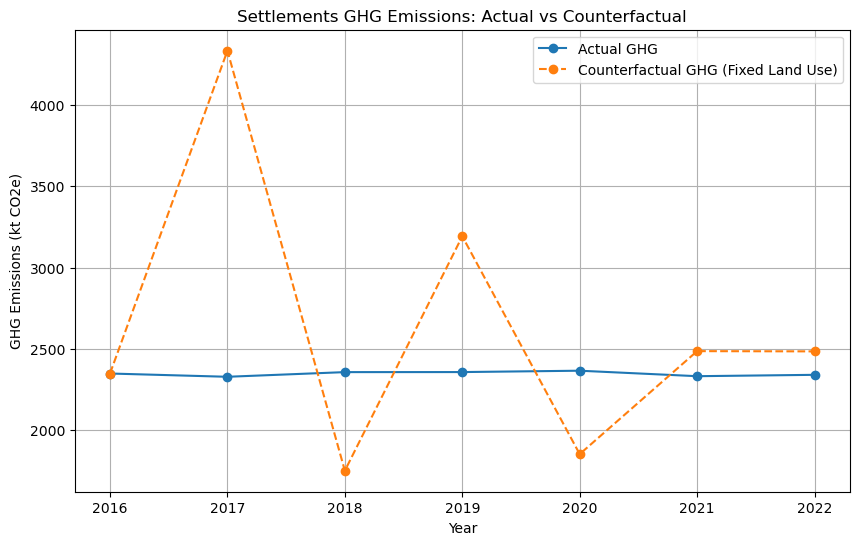

In [109]:
categories = ['Cropland', 'ForestLand', 'GrasslandWetland', 'Other', 'Settlements']

for category in categories:
    plt.figure(figsize=(10,6))
    plt.plot(counterfactual_df['year'], counterfactual_df[f'{category}_GHG'], marker='o', label='Actual GHG')
    plt.plot(counterfactual_df['year'], counterfactual_df[f'{category}_GHG_CF'], marker='o', linestyle='--', label='Counterfactual GHG (Fixed Land Use)')
    plt.title(f'{category} GHG Emissions: Actual vs Counterfactual')
    plt.xlabel('Year')
    plt.ylabel('GHG Emissions (kt CO2e)')
    plt.grid(True)
    plt.legend()
    plt.show()

### Difference between actual and counterfactual

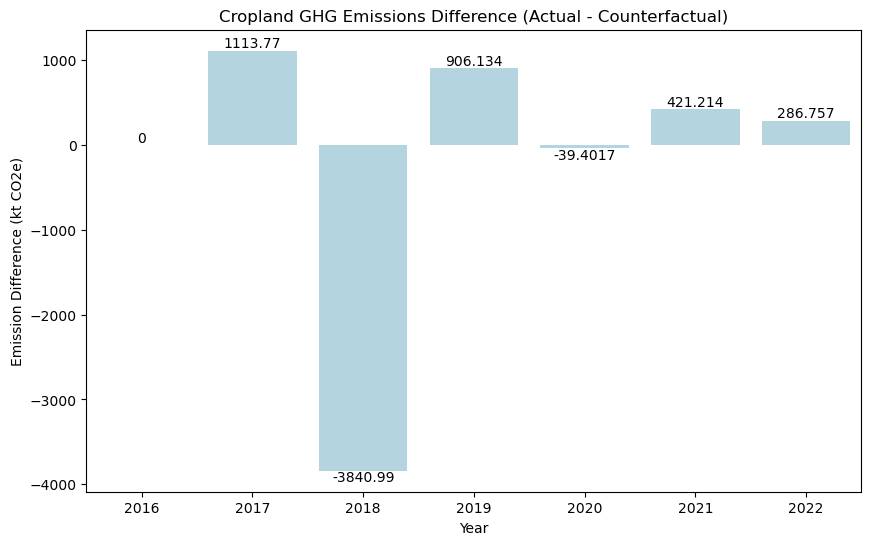

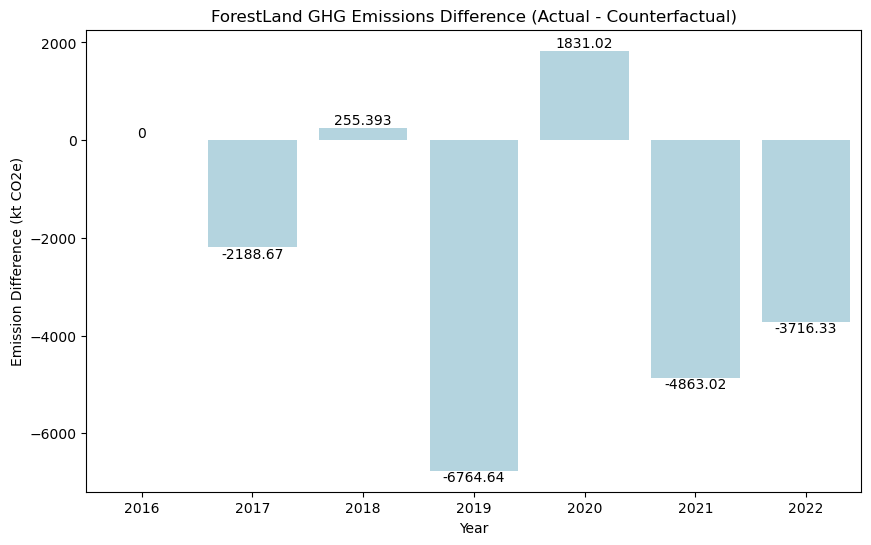

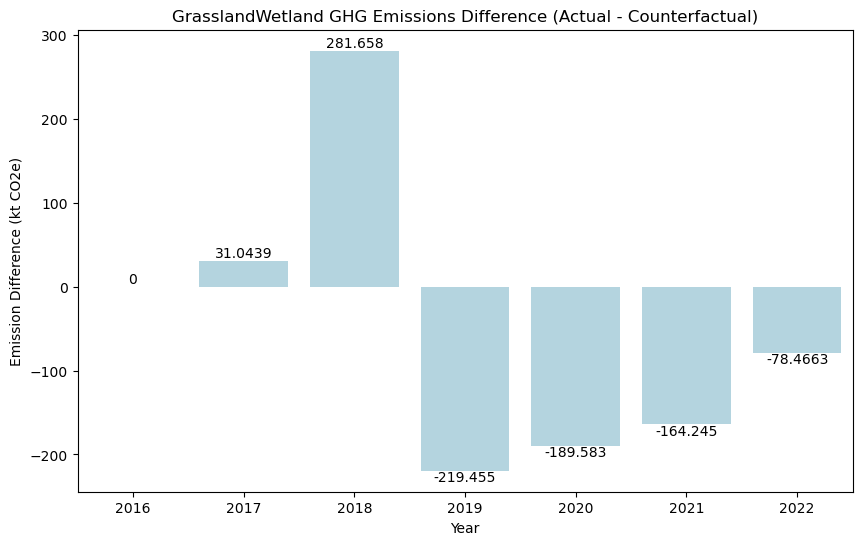

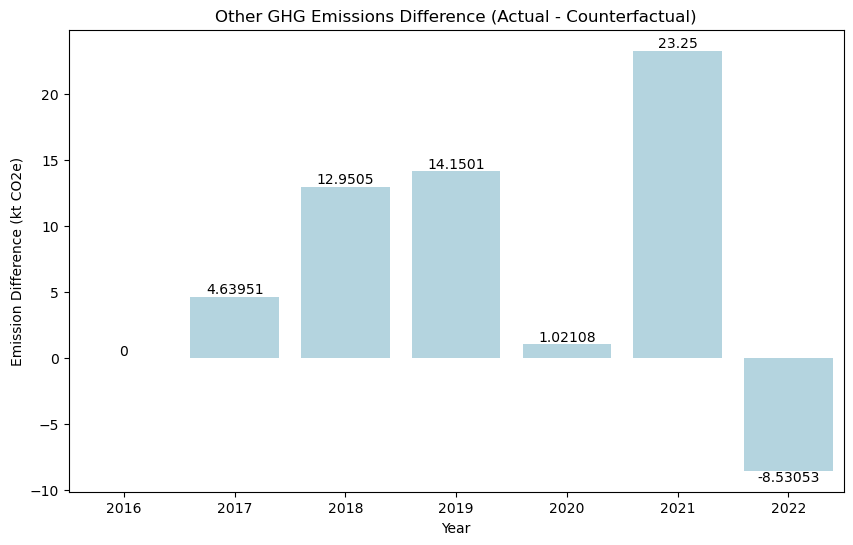

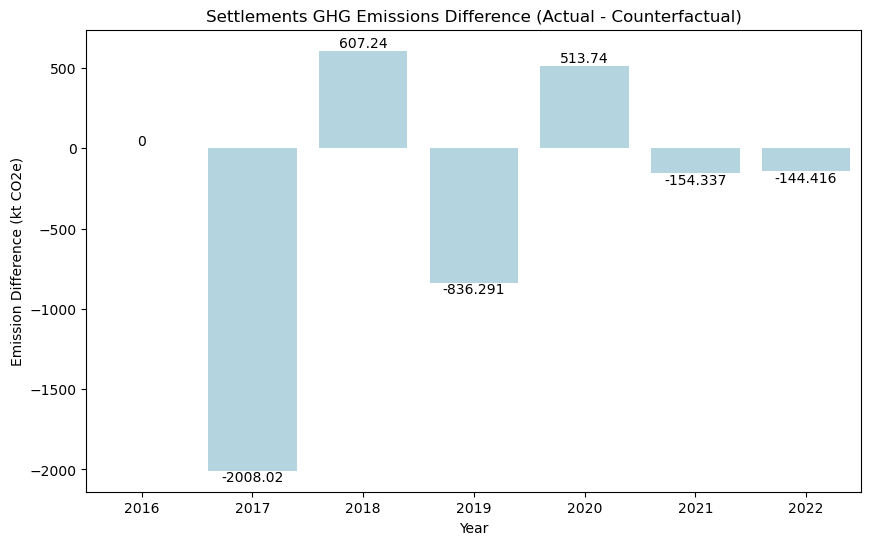

In [110]:
for category in categories:
    plt.figure(figsize=(10,6))
    #ax = plt.bar(counterfactual_df['year'], counterfactual_df[f'{category}_GHG_Change'], color='skyblue')
    ax = sns.barplot(counterfactual_df, x='year', y=f'{category}_GHG_Change', errorbar=None, color='lightblue',)
    ax.bar_label(ax.containers[0], fontsize=10);
    plt.title(f'{category} GHG Emissions Difference (Actual - Counterfactual)')
    plt.xlabel('Year')
    plt.ylabel('Emission Difference (kt CO2e)')
    #plt.axhline(0, color='black', linewidth=0.8)
    #plt.grid(axis='y')
    plt.show()
    
    #ax = sns.barplot(counterfactual_df, x='year', y=f'{category}_GHG_Change', errorbar=None)

### Paired t-tests

In [111]:
for category in categories:
    actual = counterfactual_df[f'{category}_GHG']
    counterfactual = counterfactual_df[f'{category}_GHG_CF']
    t_stat, p_val = ttest_rel(actual, counterfactual)
    print(f'{category}: t-statistic={t_stat:.3f}, p-value={p_val:.3f}')

Cropland: t-statistic=-0.260, p-value=0.804
ForestLand: t-statistic=-1.888, p-value=0.108
GrasslandWetland: t-statistic=-0.738, p-value=0.489
Other: t-statistic=1.684, p-value=0.143
Settlements: t-statistic=-0.852, p-value=0.427


### Create summary df

In [112]:
# define df

# define dataframe to hold data

summary_cf_df = pd.DataFrame(columns=['Land Use',
                                      'Avg. Actual GHG (kt CO2e)',
                                      'Avg. Counterfactual GHG (kt CO2e)',
                                      'Avg. Change',
                                      't-statistic',
                                      'p-value'])

#create summary df
for category in categories:
    row_list = []
    row_list.append(category)
    row_list.append(counterfactual_df[f'{category}_GHG'].mean().round(2))
    row_list.append(counterfactual_df[f'{category}_GHG_CF'].mean().round(2))
    row_list.append(counterfactual_df[f'{category}_GHG_Change'].mean().round(2))
    
    actual = counterfactual_df[f'{category}_GHG']
    counterfactual = counterfactual_df[f'{category}_GHG_CF']
    t_stat, p_val = ttest_rel(actual, counterfactual)
    row_list.append(t_stat.round(2))
    row_list.append(p_val.round(2))
    summary_cf_df.loc[len(summary_cf_df)] = row_list #  append to df

summary_cf_df

,Land Use,Avg. Actual GHG (kt CO2e),Avg. Counterfactual GHG (kt CO2e),Avg. Change,t-statistic,p-value
0,Cropland,7748.13,7912.78,-164.64,-0.26,0.80
1,ForestLand,-12863.14,-10656.53,-2206.61,-1.89,0.11
2,GrasslandWetland,4366.21,4414.64,-48.44,-0.74,0.49
3,Other,144.13,137.35,6.78,1.68,0.14
4,Settlements,2345.98,2634.85,-288.87,-0.85,0.43


# Population Density

### Looking at population density compared with Total LULUFC GHG emissions

In [113]:
land_use_ghg_df

,local_authority,year,total_pixels,total_sqkm,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG
0,South Ayrshire,2016,12284471,1228.4471,914.043309,Scotland,1234.6853,112.567854,Rural,32.3584,32.7680,1069.0560,28.2624,111.8208,60.800080,-168.406704,22.578893,-0.100247,20.931298
1,Huntingdonshire,2016,9121024,912.1024,1921.331100,East of England,912.5461,177.361733,Urban,342.8352,8.1920,368.6400,27.4432,204.8000,30.817585,-22.369041,285.969690,0.276267,6.148401
2,Tewkesbury,2016,4102733,410.2733,893.603856,South West,414.9760,88.153766,Urban,51.2000,1.6384,327.2704,3.6864,63.8976,13.104769,-22.629027,-14.844106,0.324541,3.407730
3,West Lancashire,2016,3427363,342.7363,1033.234330,North West,381.3803,114.563882,Urban,70.4512,2.8672,224.0512,2.8672,67.5840,8.864708,-11.068474,213.030559,0.067400,3.649448
4,Darlington,2016,1976753,197.6753,667.990971,North East,197.4758,106.925688,Urban,52.0192,0.4096,110.1824,2.4576,48.3328,8.121586,-5.683302,-4.716493,0.112159,3.009305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2333,Birmingham,2022,2674485,267.4485,4316.447767,West Midlands,267.7912,1157.603000,Urban,4.9152,0.8192,80.6912,0.8192,197.8368,0.719413,-8.254602,12.142281,0.037500,17.066511
2334,Torridge,2022,9688162,968.8162,626.901017,South West,995.2034,68.635000,Rural,312.9344,22.5280,677.4784,4.0960,8.6016,16.184232,-93.930942,-34.449140,-0.203014,2.409826
2335,Stockton-on-Tees,2022,1586619,158.6619,1978.178678,North East,209.7309,199.966000,Urban,20.8896,0.0000,84.7872,1.2288,67.1744,5.140902,-10.184451,-3.465311,0.072600,7.642307
2336,Perth & Kinross,2022,53376489,5337.6489,1258.152671,Scotland,5418.9445,151.120000,Rural,2343.7312,1189.8880,1891.5328,18.8416,29.4912,488.102005,-519.099546,-157.395750,-3.128700,28.999456


In [114]:
pop_dense_df = land_use_ghg_df[land_use_ghg_df['year'] == 2022].copy()

pop_dense_df['population_density'] = (pop_dense_df['Mid-year Population (thousands)']*1000)/pop_dense_df['Area (km2)']


pop_dense_df['all_emissions_per_capita'] = pop_dense_df['all_emmisions_sum']/(pop_dense_df['Mid-year Population (thousands)']*1000)

pop_dense_df['lulucf_emissions_per_capita'] = (pop_dense_df['Cropland_GHG']+pop_dense_df['ForestLand_GHG']+pop_dense_df['GrasslandWetland_GHG']+pop_dense_df['Other_GHG']+pop_dense_df['Settlements_GHG'])/(pop_dense_df['Mid-year Population (thousands)']*1000)

In [115]:
pop_dense_df

,local_authority,year,total_pixels,total_sqkm,all_emmisions_sum,Region,Area (km2),Mid-year Population (thousands),rural/urban,Cropland_LandUse,ForestLand_LandUse,GrasslandWetland_LandUse,Other_LandUse,Settlements_LandUse,Cropland_GHG,ForestLand_GHG,GrasslandWetland_GHG,Other_GHG,Settlements_GHG,population_density,all_emissions_per_capita,lulucf_emissions_per_capita
2004,South Ayrshire,2022,12274610,1227.4610,807.156114,Scotland,1234.6853,111.560,Rural,52.8384,31.1296,1055.1296,24.5760,110.5920,54.274927,-129.244906,13.354317,0.227427,20.687073,90.355008,0.007235,-0.000365
2005,Huntingdonshire,2022,9137588,913.7588,1810.111860,East of England,912.5461,184.052,Urban,292.8640,2.4576,430.4896,15.5648,210.5344,31.064386,-21.919669,279.831779,0.701638,6.840086,201.690632,0.009835,0.001611
2006,Tewkesbury,2022,4052295,405.2295,718.417064,South West,414.9760,97.000,Urban,101.5808,22.9376,298.5984,2.0480,22.5280,12.608548,-22.735477,-15.391958,0.358067,3.713663,233.748458,0.007406,-0.000221
2007,West Lancashire,2022,3465954,346.5954,1003.947474,North West,381.3803,119.367,Urban,154.8288,4.0960,204.3904,2.0480,2.0480,8.602669,-10.802461,207.261311,0.130820,3.858569,312.986801,0.008411,0.001751
2008,Darlington,2022,1972276,197.2276,562.829330,North East,197.4758,109.469,Urban,84.3776,9.0112,111.0016,0.0000,8.6016,7.952520,-5.667086,-4.922762,0.322451,3.381022,554.341342,0.005141,0.000010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2333,Birmingham,2022,2674485,267.4485,4316.447767,West Midlands,267.7912,1157.603,Urban,4.9152,0.8192,80.6912,0.8192,197.8368,0.719413,-8.254602,12.142281,0.037500,17.066511,4322.782078,0.003729,0.000019
2334,Torridge,2022,9688162,968.8162,626.901017,South West,995.2034,68.635,Rural,312.9344,22.5280,677.4784,4.0960,8.6016,16.184232,-93.930942,-34.449140,-0.203014,2.409826,68.965801,0.009134,-0.001603
2335,Stockton-on-Tees,2022,1586619,158.6619,1978.178678,North East,209.7309,199.966,Urban,20.8896,0.0000,84.7872,1.2288,67.1744,5.140902,-10.184451,-3.465311,0.072600,7.642307,953.440814,0.009893,-0.000004
2336,Perth & Kinross,2022,53376489,5337.6489,1258.152671,Scotland,5418.9445,151.120,Rural,2343.7312,1189.8880,1891.5328,18.8416,29.4912,488.102005,-519.099546,-157.395750,-3.128700,28.999456,27.887350,0.008326,-0.001075


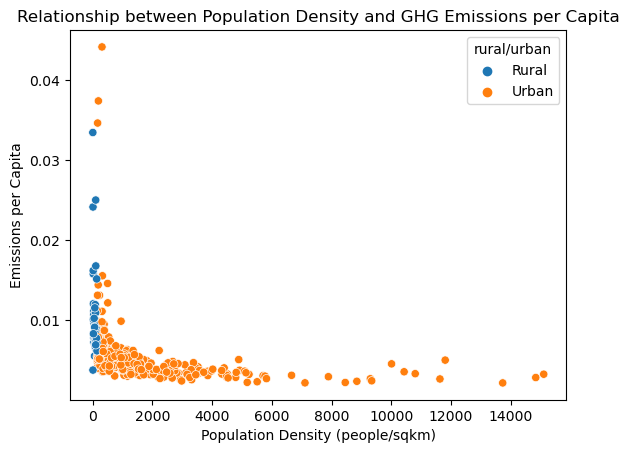

In [116]:
#plt.figure(figsize=(10, 6))
sns.scatterplot(data=pop_dense_df, x='population_density', y='all_emissions_per_capita', hue="rural/urban")
plt.xlabel('Population Density (people/sqkm)')
plt.ylabel('Emissions per Capita')
plt.title(f"Relationship between Population Density and GHG Emissions per Capita")
plt.show()


In [117]:
pop_dense_df['rural/urban'].value_counts()

rural/urban
Urban    285
Rural     49
Name: count, dtype: int64

In [118]:
pop_dense_df[['population_density', 'all_emissions_per_capita']].corr()

,population_density,all_emissions_per_capita
population_density,1.000000,-0.328273
all_emissions_per_capita,-0.328273,1.000000


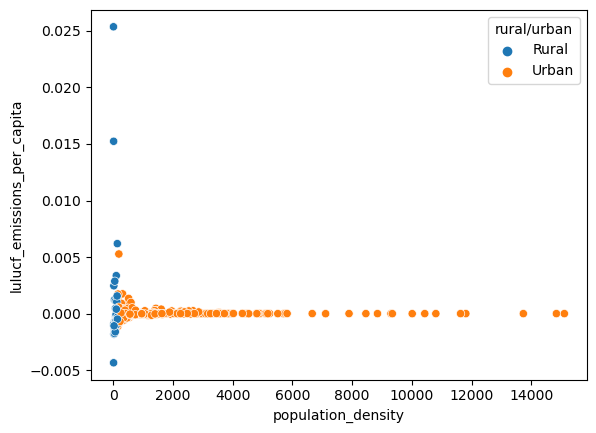

In [119]:
sns.scatterplot(data=pop_dense_df, x='population_density', y='lulucf_emissions_per_capita', hue="rural/urban")

plt.show()

In [120]:
# independent variables - land use cats
X = pop_dense_df[['population_density','Cropland_LandUse', 'ForestLand_LandUse', 'GrasslandWetland_LandUse', 
                     'Other_LandUse', 'Settlements_LandUse']]


# adds intercept
X = sm.add_constant(X)

y = pop_dense_df['all_emissions_per_capita']  # dependent variable
model = sm.OLS(y, X).fit()
        

#print(f"Regression results for :")
print(model.summary())
print("\n" + "-"*80 + "\n") # creates page break

                               OLS Regression Results                               
Dep. Variable:     all_emissions_per_capita   R-squared:                       0.154
Model:                                  OLS   Adj. R-squared:                  0.139
Method:                       Least Squares   F-statistic:                     9.933
Date:                      Fri, 28 Mar 2025   Prob (F-statistic):           4.47e-10
Time:                              10:25:02   Log-Likelihood:                 1353.9
No. Observations:                       334   AIC:                            -2694.
Df Residuals:                           327   BIC:                            -2667.
Df Model:                                 6                                         
Covariance Type:                  nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

Correlation coefficient: -0.328
p-value: 7.840e-10
The correlation is statistically significant


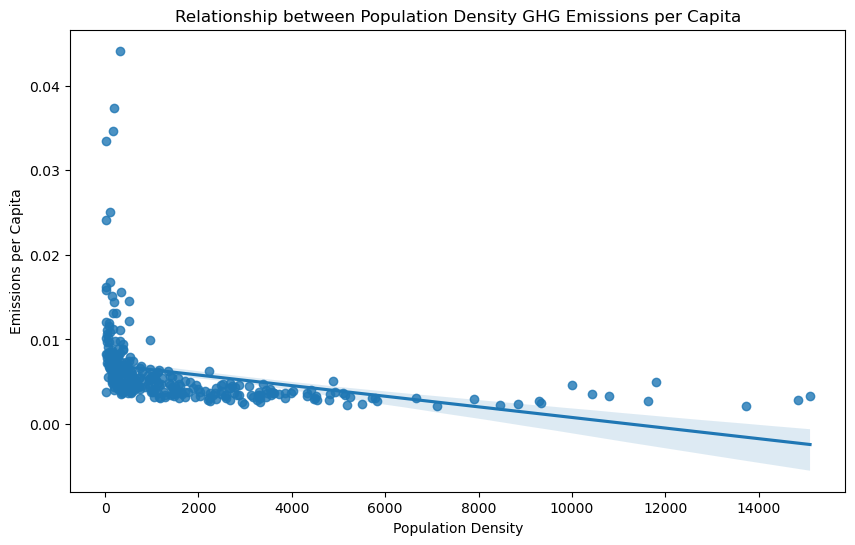

In [121]:
#filtered_data = land_use_ghg_df[land_use_ghg_df['rural/urban'] == i]
        
x = pop_dense_df['population_density']
y = pop_dense_df['all_emissions_per_capita']
        
print(f'Correlation coefficient: {x.corr(y):.3}')
p_value = pearsonr(x, y)[1]
if p_value < 0.05:
    print(f'p-value: {p_value:.3e}')
    print('The correlation is statistically significant')
else:
    print(f'p-value: {p_value}')
    print('The correlation is NOT statistically significant')


#data = filtered_data[filtered_data['LULUCF_category']==j]
plt.figure(figsize=(10, 6))
sns.regplot(data=pop_dense_df, x='population_density',y='all_emissions_per_capita')
plt.xlabel('Population Density')
plt.ylabel('Emissions per Capita')
plt.title(f'Relationship between Population Density GHG Emissions per Capita')
plt.show()